In [39]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import os
from itertools import combinations
import time
import keyboard
from IPython.display import clear_output

In [13]:
time_limit = 10

### Center node selection (SP, MPG)

In [14]:
def find_center_node(G,users):
    G_trimmed = G.copy()
    for n in G.nodes():
        if G.degree(n) == 1 and n not in users:
            G_trimmed.remove_node(n)
    weighed_ecc = {}
    weighed_sum = {}
    for c in [n for n in G_trimmed.nodes() if (G_trimmed.degree(n)>=len(users) and n not in users)]: # due to disjointness, center node must have deg > #users
        distance_list = []
        for u in users:
            distance_list.append(len(nx.shortest_path(G_trimmed, source=c, target=u, weight='weight')))
        weighed_ecc[c] = max(distance_list)
        weighed_sum[c] = sum(distance_list)

    # classicaly, graph center minimizes eccentricity
    if len(weighed_ecc)==0 and len(weighed_sum)==0:
        print('No valid central node.')
        return (None,None)
    
    min_ecc = min(weighed_ecc.values())
    min_ecc_nodes = [node for node, ecc in weighed_ecc.items() if ecc == min_ecc]
    #print(f'center ecc candidates: {min_ecc_nodes}')
    if len(min_ecc_nodes) == 1:
        center_ecc = min_ecc_nodes[0]
    elif len(min_ecc_nodes) > 1:
        center_ecc = min(min_ecc_nodes, key=weighed_sum.get)
    
    min_sum = min(weighed_sum.values())
    min_sum_nodes = [node for node, sum in weighed_sum.items() if sum == min_sum]
    #print(f'center sum candidates: {min_sum_nodes}')
    if len(min_sum_nodes) == 1:
        center_sum = min_sum_nodes[0]
    elif len(min_sum_nodes) > 1:
        center_sum = min(min_sum_nodes, key=weighed_ecc.get)

    return (center_ecc,center_sum)  

### Shortest Path

In [15]:
# Dijkstra

def disjoint_path_priority(G,users,c,index):
        G_trimmed = G.copy()
        users_TBD = list(users)
        shortest_paths_disj = []
        shortest_paths_disj_edges = []

        while len(users_TBD) > 0:
            shortest_paths = {}
            shortest_paths_cost = {}
        
            for u in users_TBD:
                G_no_u = G_trimmed.copy()
                try:
                    G_no_u.remove_nodes_from([v for v in list(users) if v!=u])
                    G_no_u.add_node(u)
                    shortest_path = nx.shortest_path(G_no_u,source=c,target=u, weight='weight')
                    shortest_paths[u] = shortest_path
                    shortest_paths_cost[u] = nx.path_weight(G_no_u, shortest_paths[u], weight="weight")
                except nx.NetworkXNoPath as e:
                    return []
            
            sorted_paths = sorted(shortest_paths, key=shortest_paths.get, reverse=True)
            
            try:
                chosen_shortest_path_user = sorted_paths[index]
            except IndexError:
                    chosen_shortest_path_user = sorted_paths[-1]
            
            chosen_shortest_path = shortest_paths[chosen_shortest_path_user]
            shortest_paths_disj.append(chosen_shortest_path)
            users_TBD.remove(chosen_shortest_path_user)

            for i in range(len(chosen_shortest_path)-1):
                G_trimmed.remove_edge(chosen_shortest_path[i],chosen_shortest_path[i+1])

        for path in shortest_paths_disj:
            for i in range(len(path)-1):
                shortest_paths_disj_edges.append((path[i],path[i+1]))
        return shortest_paths_disj_edges


def find_disjoint_path_edges(G,users,c,check_connected=False):
        for j in [0,-1]+list(range(1,len(users)-1)): # first longest, then shortest, ...
             disj_paths_edges = disjoint_path_priority(G,users,c,j)
             if disj_paths_edges != []:
                  return disj_paths_edges
        return []            

### Node coloring

In [206]:
def node_colors(G,users,center=None):
    color_map = []
    for node in G.nodes():
        if node in users:
            color_map.append('yellowgreen')
        elif node == center:
            color_map.append('yellow')
        else:
            color_map.append('white')
    return color_map



def mod_node_colors(G,users,center1,center2):
    color_map = []
    if center1 != center2:
        for node in G.nodes():
            if node in users:
                color_map.append('yellowgreen')
            elif node == center1:
                color_map.append('yellow')
                continue
            elif node == center2:
                color_map.append('red')
            else: 
                color_map.append('white')
    elif center1 == center2:
        center = center1
        for node in G.nodes():
            if node in users:
                color_map.append('yellowgreen')
            elif node == center:
                color_map.append('orange')
            else: 
                color_map.append('white')
    return color_map

def node_colors_freq(G,users,center=None,freq_dict={}):
    color_map = []
    for node in G.nodes():
        if node in users:
            color_map.append('yellowgreen')
        elif node == center:
            color_map.append('yellow')
        elif node in freq_dict:
            color_map.append((1 - freq_dict[node], 1 - freq_dict[node], 1, 1))
        else:
            color_map.append('white')
    return color_map

### User Selection

In [17]:
def is_element_in_all_sublists(element, l_l):
    for sublist in l_l:
        if element not in sublist:
            return False
    return True

def find_users(G,n):
    # Compute all-pairs shortest path lengths
    all_pairs_shortest_path_lengths = dict(nx.all_pairs_dijkstra_path_length(G))

    user_dict = {}
    
    # Iterate over all combinations of n nodes in the graph
    for nodes in combinations(G.nodes(), n):
        # Calculate the sum of shortest path lengths between each pair in the combination
        distance_sum = sum(all_pairs_shortest_path_lengths[u][v] for u, v in combinations(nodes, 2))
        
        user_dict[nodes] = distance_sum

    sorted_users_l = sorted(user_dict, key=user_dict.get, reverse=True)

    for candidate_users in sorted_users_l:

        bad_cand = False
        for nodes in combinations(candidate_users, 2):
            if bad_cand:
                break

            shortest = nx.shortest_path(G, *nodes)

            if len( set(shortest) & {u for u in candidate_users if u not in nodes} ) == 0:
                continue
            
            else: # check all paths (which takes a while)
                print('checking all paths...')

                all_paths_between = nx.all_simple_paths(G, *nodes, cutoff=20)

                all_paths_between_l = []
                for p in all_paths_between:
                    all_paths_between_l.append(p)

                for k in [u for u in candidate_users if u not in nodes]:
                    if is_element_in_all_sublists(k,all_paths_between_l):
                        #print(candidate_users, nodes, [_ for _ in all_paths_between_l], k)
                        #print('Invalid user choice. Reassigning users...')
                        bad_cand = True
                        break

        if bad_cand:
            continue

        return candidate_users
    

    print('no user config found')

### Protocols

In [18]:
# number of loop iterations before qubit decays
T_c = np.inf # qubit coherence lifetime

In [19]:
def users_connected_center_disj(G,users,c):
    shortest_disj = find_disjoint_path_edges(G,users,c,check_connected=True)
    if len(shortest_disj) == 0:
        return [False,None]
    else:
        return [True,shortest_disj]
    
def users_connected(G,users):
    for u in users:
        for v in users:
            if v!= u:
                if not nx.has_path(G,u,v):
                    return False
    return True

In [219]:
def protocol(algo,G,users):            
    if algo not in {'SP','MPG','MPC'}:
        raise ValueError("Algorithm must be SP, MPG or MPC.")
    
    if not isinstance(G, nx.Graph):
        raise TypeError("G must be a NetworkX graph.")
    
    if not isinstance(users, (list, set, tuple)):
        raise TypeError("users must be a list or set of nodes.")
    
    # initialise G'
    G_prime = nx.Graph()
    G_prime.add_nodes_from(G.nodes())

    # central node used in SP and MPG
    if algo in {'SP','MPG'}:
        central = find_center_node(G,users)[0]

    # SP: entanglement over shortest path edges
    # MPG,MPC: entangement over all edges
    if algo == 'SP':
        entangle_edges = find_disjoint_path_edges(G,users,central)
    elif algo in {'MPG','MPC'}:
        entangle_edges = G.edges(data=True)
    
    edge_memory = {}
    hasGHZ = False 
    iter = 0

    #start_time = time.time()
    while not hasGHZ:
        '''
        if time.time() - start_time > time_limit:
                 print(f'took >{time_limit}s')
                 return None
        '''
        
        iter += 1
        new_edges = []
        
        for e in entangle_edges:
            e_tuple = (e[0],e[1])
            if e in G_prime.edges():
                e_mem = edge_memory[e_tuple]
                if e_mem == 0:
                    G_prime.remove_edge(*e)
                elif e_mem > 0:
                    edge_memory[e_tuple] -= 1

            elif e not in G_prime.edges():
                edge_memory[e_tuple] = 0
                
                e_prob = G.get_edge_data(*e_tuple).get('p', 1.0)
                rng = np.random.random()
                if rng < e_prob:
                    if algo == 'SP':
                        G_prime.add_edge(*e_tuple)
                    elif algo in {'MPG','MPC'}:
                        G_prime.add_edge(*e_tuple,weight=e[2]['weight'])
                    edge_memory[e_tuple] = T_c

                    new_edges.append(e)
        

        # Plot each time a new edge is found
        plot_new_e = False
        if plot_new_e and len(new_edges)>0:
            nx.draw(G_prime, with_labels=True, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(algo + ': iteration ' + str(iter))
            plt.show()
        
        # SP,MPG: checks if each user node connects to central node
        # MPC: checks if all user nodes are connected
        if algo == 'SP':
            hasGHZ = all([e in G_prime.edges() for e in entangle_edges])

        elif algo == 'MPG':
            UCCD = users_connected_center_disj(G_prime,users,central)
            hasGHZ = UCCD[0]
            valid_edges = UCCD[1]

        elif algo == 'MPC':
            users_path_exist = []
            for nodes in combinations(users, 2):
                G_prime_no_u = G_prime.copy()
                for u in [u_ for u_ in users if u_ not in nodes]:
                    G_prime_no_u.remove_node(u)
                users_path_bool = nx.has_path(G_prime_no_u, *nodes)
                users_path_exist.append(users_path_bool)
            if all(users_path_exist):
                hasGHZ = True

            #steiner = nx.algorithms.approximation.steinertree.steiner_tree(G_prime,users,weight='weight')


        if hasGHZ:
            if algo == 'SP':
                return (G_prime,iter,entangle_edges)

            elif algo == 'MPG':
                return (G_prime,iter,valid_edges)

            elif algo == 'MPC':
                return (G_prime,iter)#,steiner.edges())

### Examples

In [21]:
grid5 = nx.grid_2d_graph(5, 5)

pos = {(x,y):(y,-x) for x,y in grid5.nodes()}

grid5_users = set([(0,0),(0,4),(4,0),(4,4)])

grid5_colors = node_colors(grid5,grid5_users)

# nx.draw(grid5, pos=pos, with_labels=True, node_size=1000,node_color=grid5_colors, edgecolors='black', font_size=8)

# find_center_node(grid5,grid5_users)



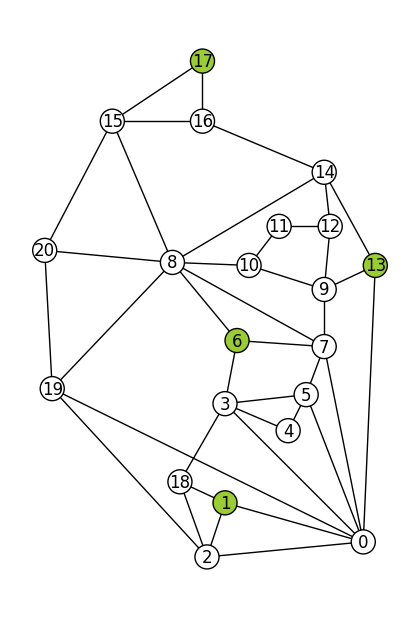

In [22]:
# UK network
nodes_labels = [i for i in range(21)]
edges_labels = [   
                (0,1),(0,2),(0,3),(0,5),(0,7),(0,13),(0,19),
                (1,2),(1,18),
                (2,18),(2,19),
                (3,4),(3,5),(3,6),(3,18),
                (4,5),
                (5,7),
                (6,7),(6,8),
                (7,8),(7,9),
                (8,10),(8,14),(8,15),(8,19),(8,20),
                (9,10),(9,12),(9,13),
                (10,11),
                (11,12),
                (12,14),
                (13,14),
                (14,16),
                (15,16),(15,17),(15,20),
                (16,17),
                (19,20)
                ]


uk = nx.Graph()
uk.add_nodes_from(nodes_labels)
uk.add_edges_from(edges_labels)

uk_users = set([6,1,13,17])

pos = {
    0: (10.6,0.5),
    1: (6,1.8), 
    2: (5.4,0), 
    3: (6,5.1), 
    4: (8.1,4.2), 
    5: (8.7,5.4), 
    6: (6.4,7.2), 
    7: (9.3,7), 
    8: (4.25,9.8), 
    9: (9.3,8.9), 
    10: (6.8,9.7), 
    11: (7.8,11), 
    12: (9.5,11), 
    13: (11,9.7), 
    14: (9.3,12.8), 
    15: (2.25,14.5), 
    16: (5.25,14.5), 
    17: (5.25,16.5),  
    18: (4.5,2.5), 
    19: (0.25,5.6), 
    20: (0,10.2), 
}

UK_colors = node_colors(uk,uk_users)

plt.figure(figsize=(4,6)) 
nx.draw(uk,pos, node_color=UK_colors, with_labels=True, edgecolors='black')
plt.show()

## Real Topologies

### Reading data

In [23]:
def sort_key(s):
    s_list = s.split('_')
    return int(s_list[1])

def network_name(s):
    s_list = s.split('_')
    return s_list[-1][:-5]

nodes_pd = [] 
edges_pd = []

file_names = []

for file in sorted(os.listdir('real_topologies'), key=sort_key): # sorted so that they are accessed in order
    fp = 'real_topologies\\' + file
    xl = pd.ExcelFile(fp)
    df_nodes = pd.read_excel(xl, 'Nodes_' + network_name(file))
    df_edges = pd.read_excel(xl, 'Edges_' + network_name(file))
    nodes_pd.append(df_nodes)
    edges_pd.append(df_edges)
    file_names.append(network_name(file))

In [296]:
topo_no = 105 # some numbers are missing e.g. 41 45 56 69 73 91
real_topo = {}
pos = [{} for _ in range(topo_no)]

for i in range(len(nodes_pd)):
    # initialise graph
    real_topo[i] = nx.Graph()
    
    node_labels = nodes_pd[i]['Node_ID'].tolist()
    node_labels.sort()
    real_topo[i].add_nodes_from(node_labels)

    edge_source = edges_pd[i]['Source'].tolist()
    edge_destin = edges_pd[i]['Destination'].tolist()

    edge_weight = edges_pd[i]['Computed Length (km)'].tolist() # "weight" is length/distance of optical cable
    #print(edge_weight)

    # scale longest edge to...
    scale_factor = 100
    edge_weight_scaled = [w/max(edge_weight)*scale_factor for w in edge_weight]
    #print(edge_weight_scaled)
    edge_labels = [(edge_source[j],edge_destin[j],edge_weight_scaled[j]) for j in range(len(edge_source))]
    edge_labels.sort()

    real_topo[i].add_weighted_edges_from(edge_labels)

    # Positions
    pos_x = nodes_pd[i]['Longitude'].tolist()
    pos_y = nodes_pd[i]['Latitude'].tolist()
    for k,node in enumerate(node_labels):
        pos[i][node] = (pos_x[k],pos_y[k])

    # assigning probability
    for u, v in real_topo[i].edges():
        L = real_topo[i][u][v]['weight']
        p_op = 1 # operation probability
        p_ph = 10**(-0.2*L/10) # transmission probability, assuming attenuaion of 0.2 dB/km
        real_topo[i][u][v]['p'] = p_op * p_ph
        
    draw_graphs = False
    save_graphs = False
    if draw_graphs:
        nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color='white', font_size=5, node_size = 70)
        weights = nx.get_edge_attributes(real_topo[i],'weight')
        plt.title(file_names[i])
        if save_graphs:
            plt.savefig('real_topo_img\\' + f'{i}_{file_names[i]}.png', bbox_inches='tight')
        plt.show()

### Attributes

In [25]:
topo_attributes_dict = [{} for _ in range(topo_no)]

for i in range(len(real_topo)):
    # in general, unweighed is in terms of hops, weighed is in terms of distance

    topo_attributes_dict[i]['name'] = file_names[i]
    
    topo_attributes_dict[i]['nodes'] = real_topo[i].number_of_nodes()
    topo_attributes_dict[i]['edges'] = real_topo[i].number_of_edges()
    topo_attributes_dict[i]['density'] = nx.density(real_topo[i]) # existing edges / potential edges

    topo_attributes_dict[i]['diameter_hops'] = nx.diameter(real_topo[i]) # max eccentricity
    topo_attributes_dict[i]['diameter_km'] = nx.diameter(real_topo[i], weight='weight') # max eccentricity
    
    topo_attributes_dict[i]['radius_hops'] = nx.radius(real_topo[i]) # min eccentricity
    topo_attributes_dict[i]['radius_km'] = nx.radius(real_topo[i], weight='weight') # min eccentricity
    
    topo_attributes_dict[i]['alg_conn'] = nx.algebraic_connectivity(real_topo[i]) # weight doesnt change value
    # topo_attributes_dict[i]['alg_conn_norm'] = nx.algebraic_connectivity(real_topo[i])/real_topo[i].number_of_nodes()

    topo_attributes_dict[i]['avg_node_deg'] = np.mean([real_topo[i].degree(node) for node in real_topo[i].nodes()])
    topo_attributes_dict[i]['avg_node_deg_norm'] = np.mean([real_topo[i].degree(node) for node in real_topo[i].nodes()])/real_topo[i].number_of_nodes()
    
    topo_attributes_dict[i]['avg_edge_len'] = np.mean(list(nx.get_edge_attributes(real_topo[i], 'weight').values()))

    node_betw_centrality_list = list(nx.betweenness_centrality(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['max_node_betw_centr_km'] = max(node_betw_centrality_list)
    topo_attributes_dict[i]['avg_node_betw_centr_km'] = np.mean(node_betw_centrality_list)
    
    edge_betw_centrality_list = list(nx.edge_betweenness_centrality(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['max_edge_betw_centr_km'] = max(edge_betw_centrality_list)
    topo_attributes_dict[i]['avg_edge_betw_centr_km'] = np.mean(edge_betw_centrality_list)
    
    unw_cluster_coeff_list = list(nx.clustering(real_topo[i]).values())
    topo_attributes_dict[i]['avg_cluster_coeff_hops'] = np.mean(unw_cluster_coeff_list)

    w_cluster_coeff_list = list(nx.clustering(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['avg_cluster_coeff_km'] = np.mean(w_cluster_coeff_list)
    
    topo_attributes_dict[i]['global_eff'] = nx.global_efficiency(real_topo[i])

    topo_attributes_dict[i]['avg_shortest_path_len_hops'] = nx.average_shortest_path_length(real_topo[i])
    topo_attributes_dict[i]['avg_shortest_path_len_km'] = nx.average_shortest_path_length(real_topo[i], weight='weight')

    shortest_pairs_nest = dict(nx.all_pairs_dijkstra_path_length(real_topo[i], weight='weight'))
    shortest_pairs_combine = {}
    for d in shortest_pairs_nest:
        for v in shortest_pairs_nest[d]:
            shortest_pairs_combine[(d,v)] = shortest_pairs_nest[d][v]
    topo_attributes_dict[i]['std_shortest_path_len_km'] = np.std(list(shortest_pairs_combine.values()))

    
topo_attributes_df = pd.DataFrame(topo_attributes_dict)

pd.set_option('expand_frame_repr', False) # stay on same line
#print(topo_attributes_df)


stat_list = []
for column in topo_attributes_df:
    if column != 'name':
        stats = topo_attributes_df[column].agg(['mean', 'std', 'min', 'max'])
        stats_df = pd.DataFrame(stats)
        stat_list.append(stats_df.transpose())
stats_df_all = pd.concat(stat_list)
print(stats_df_all)

                                  mean         std         min          max
nodes                        26.076190   20.274413    6.000000   142.000000
edges                        34.276190   29.241204    6.000000   180.000000
density                       0.151384    0.099041    0.017980     0.476190
diameter_hops                 8.047619    4.105299    2.000000    28.000000
diameter_km                 306.533235  162.162022  106.482513  1063.200245
radius_hops                   4.619048    2.113969    2.000000    14.000000
radius_km                   179.005599   90.135973   78.502315   585.744475
alg_conn                      7.361329    8.485549    0.058044    42.916240
avg_node_deg                  2.546451    0.431415    1.750000     3.894737
avg_node_deg_norm             0.139312    0.082850    0.017854     0.408163
avg_edge_len                 37.406239   13.626766    8.660578    75.919497
max_node_betw_centr_km        0.442239    0.133536    0.200000     0.897233
avg_node_bet

### Test data

### Protocol execution

In [26]:
# these graphs are problematic
bad_indices = []
for index, row in topo_attributes_df.iterrows():  #FILENAME NUMBERS
    if row['name'] in ['FUNET', #9
                        'SAGO', #15
                        'NEXTGEN', #18
                        'ATMNET', #20
                        'GTSCZECHREPUBLIC', #23
                        'SANREN', #24
                        'EPOCH', #25 
                        'HOSTWAYINTERNATIONAL', #31
                        'HIBERNIANIRELAND', #32
                        'BREN', #44 
                        'UNIC', #46 
                        'ABILENE', #53
                        'MARWAN', #56
                        'BBNPLANET', #59
                        'JGN2PLUS', #60
                        'HIBERNIAIRELAND', #66
                        'NEWNET', #69 
                        'SAVVIS', #73
                        'ISTAR', #74
                        'HIBERNIAUK', #75
                        'TELECOMSERBIA', #78
                        'PSINET', #80 (?)
                        'LAMBDARAIL', #85
                        'RNPBRAZIL', #87
                        'HIBERNIACANADA', #91
                        'DARKSTRAND', #99
                        'GBLNET' #103
                        ]:
        bad_indices.append(index)

# temporarily ignore these graphs
temp_filter = []
for index, row in topo_attributes_df.iterrows():
    if row['name'] in ['HIBERNIAGLOBAL', #52
                       'OPTUNETSWEDEN', #67
                       'MEMOREX', #68
                       'METRONA', #77
                       'PACKETEXCHANGE' #90
                        ]:
        temp_filter.append(index)



running 0: SANET


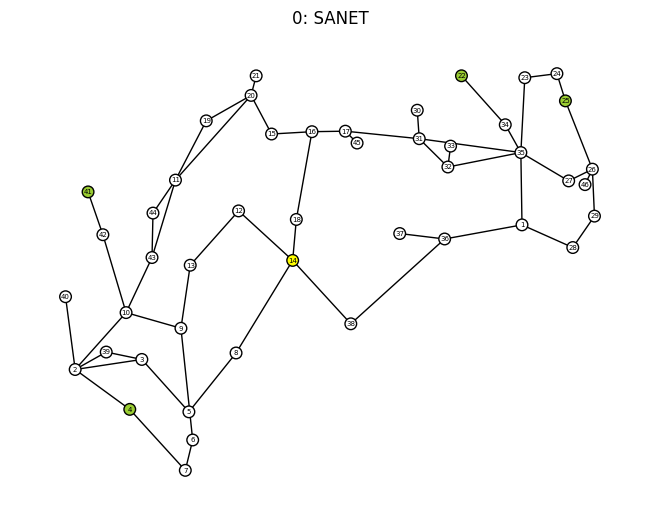

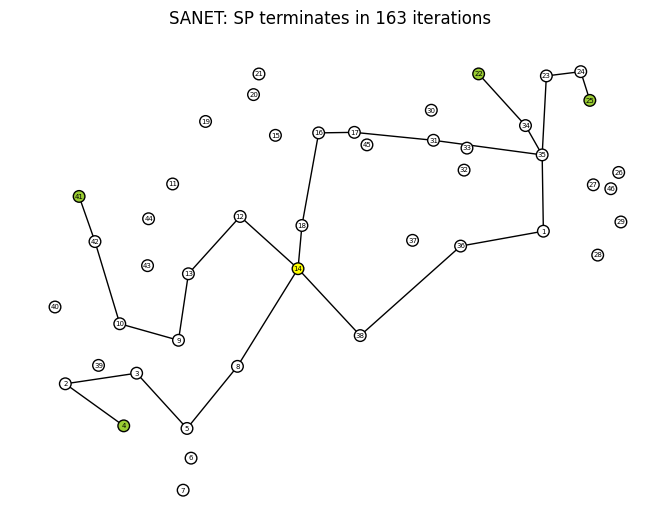

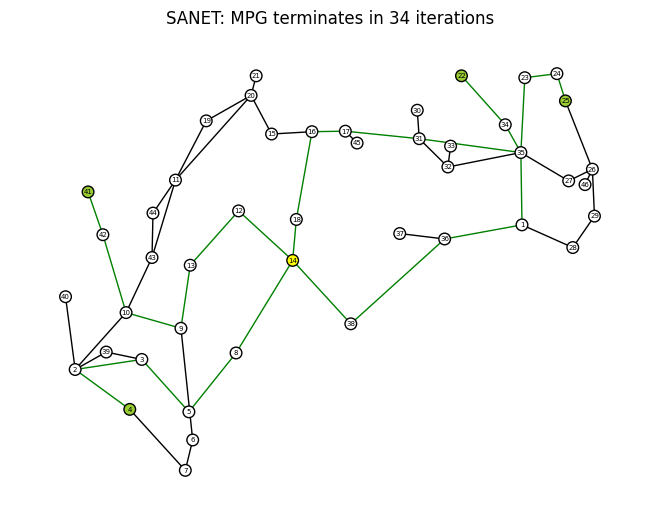



running 1: LAYER42


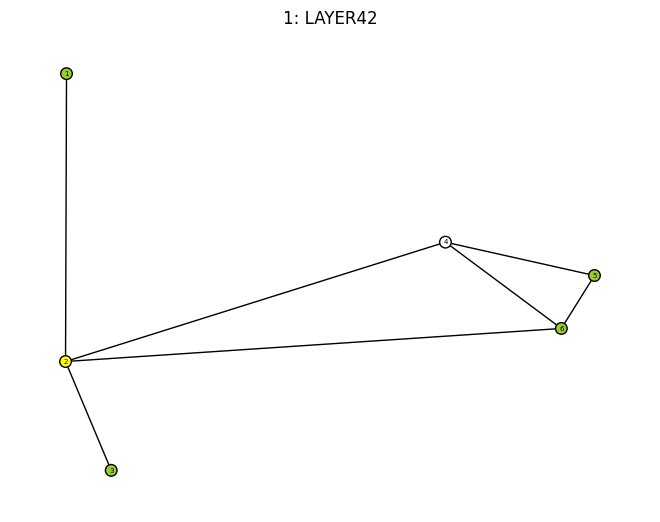

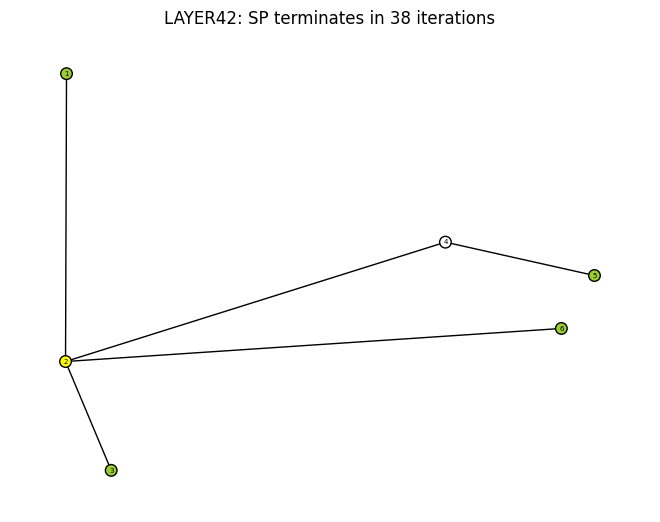

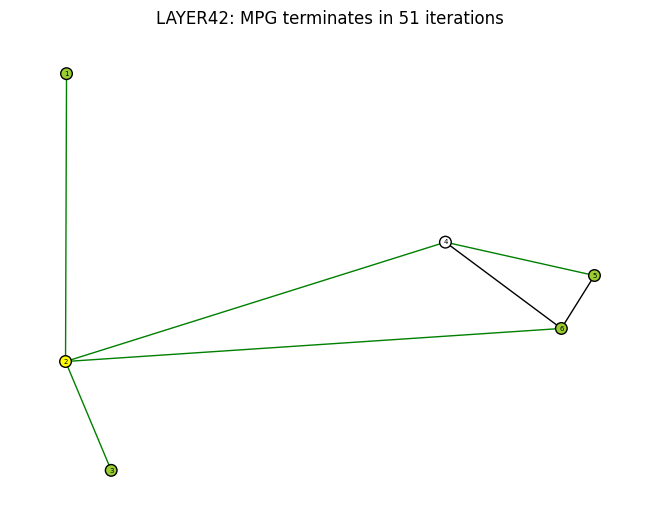



running 2: BEYONDTHENETWORK


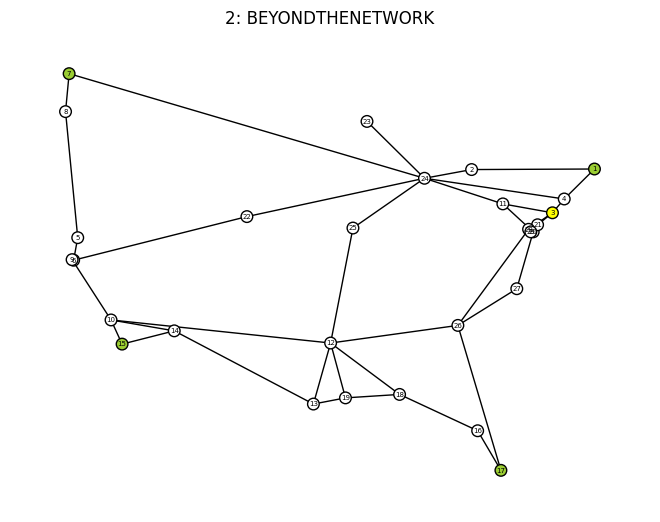

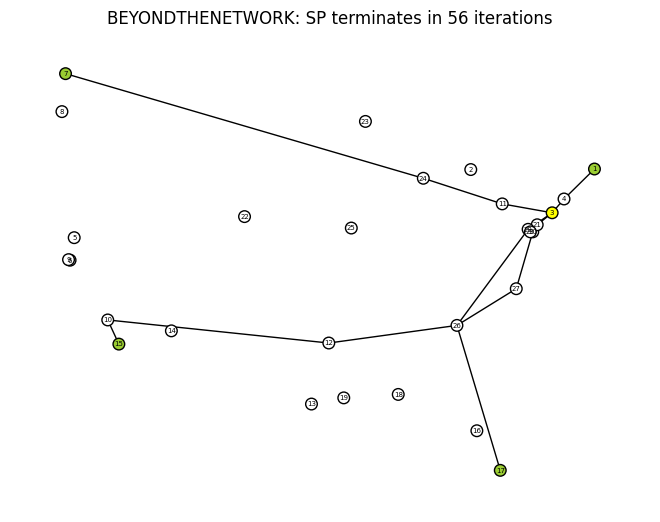

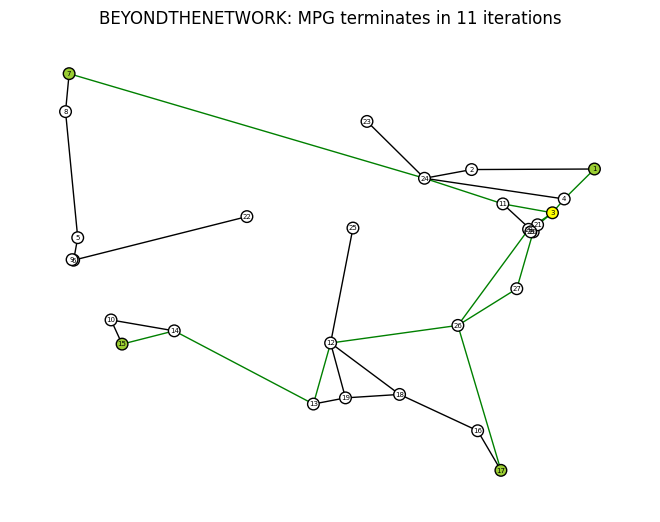



running 3: NSFNET13


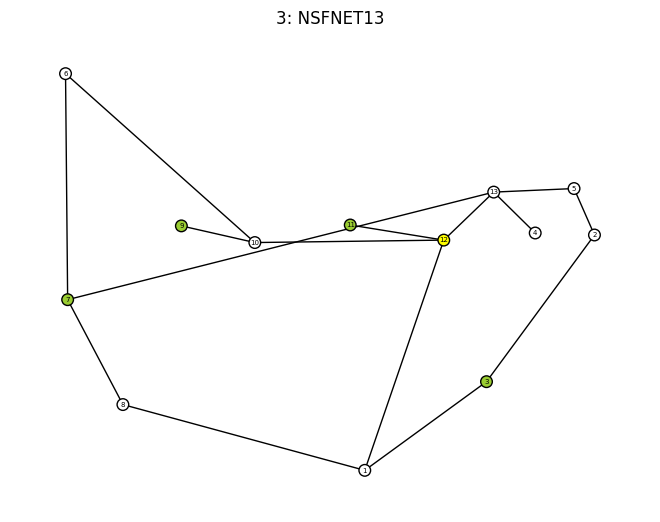

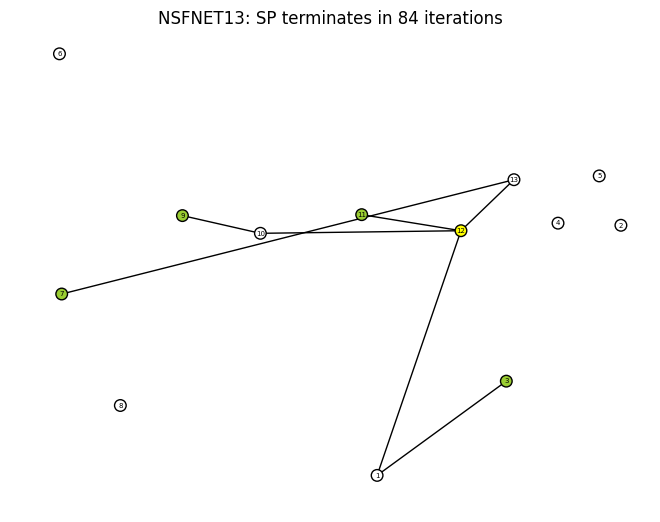

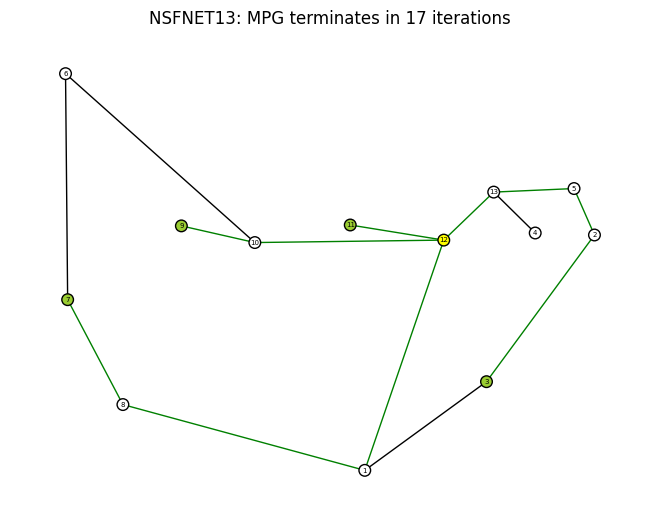



running 4: CANARIE


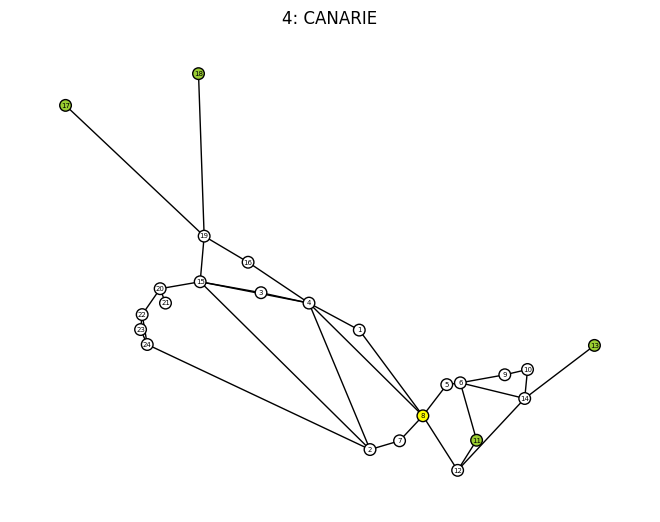

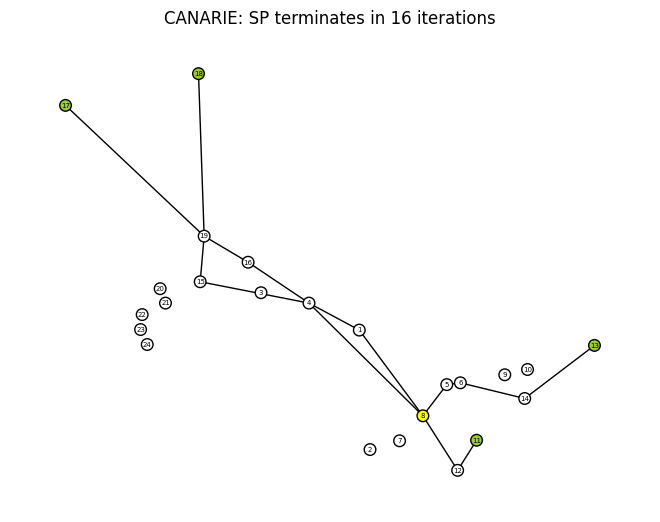

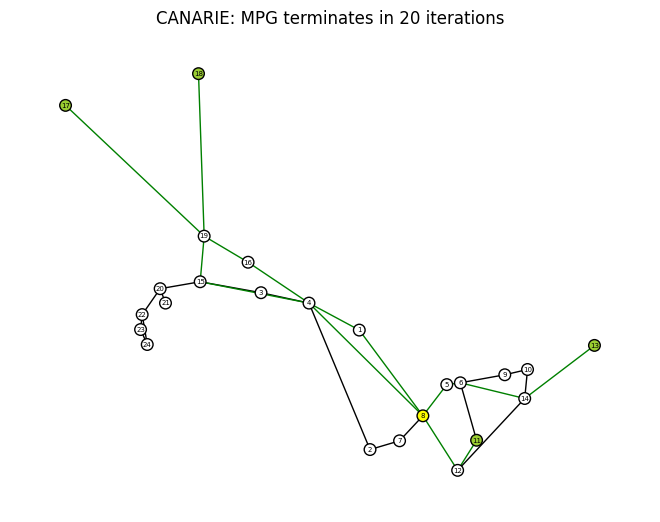



running 5: DT17


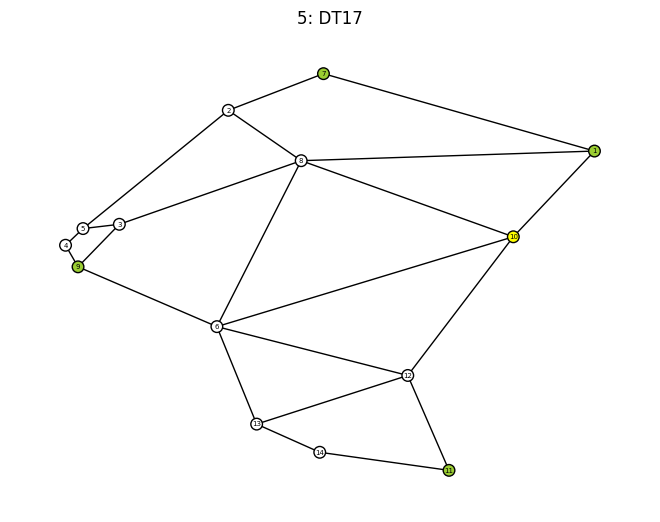

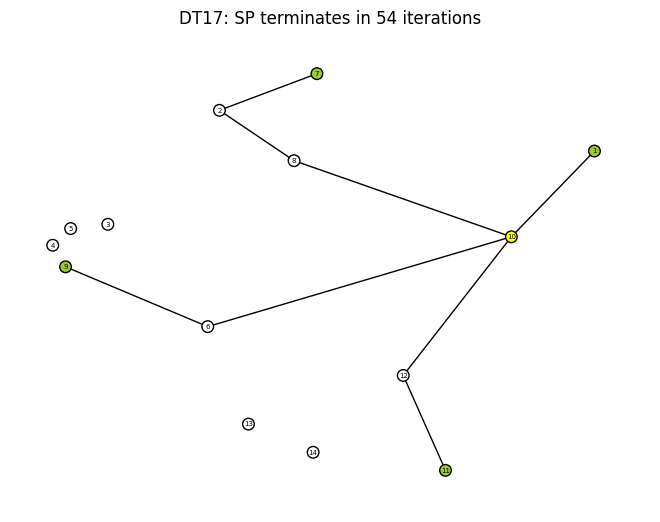

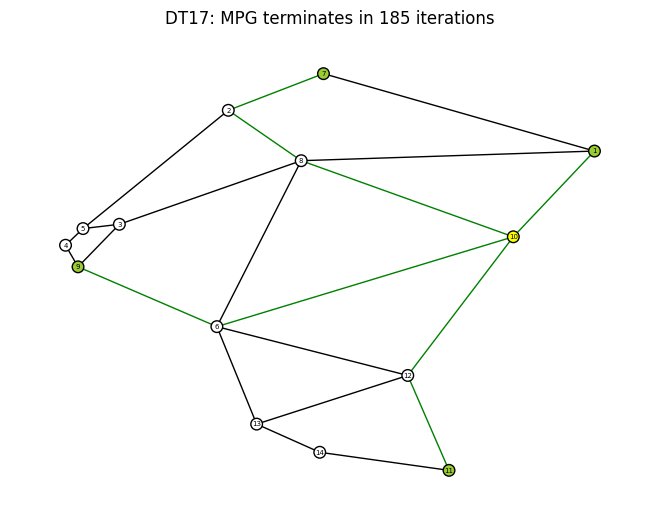



running 6: ERNET


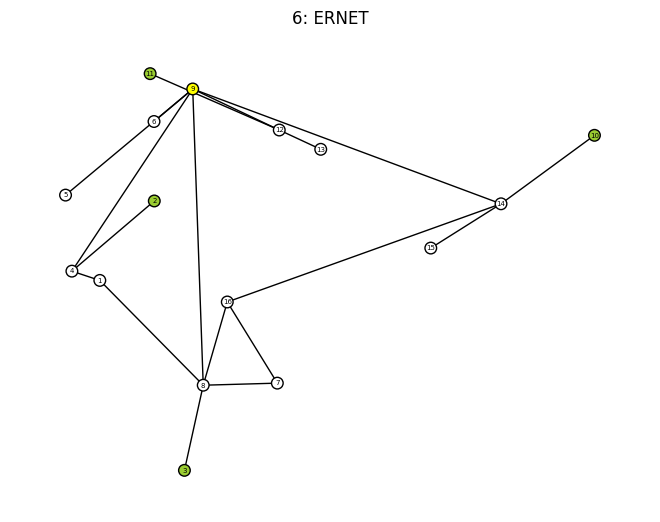

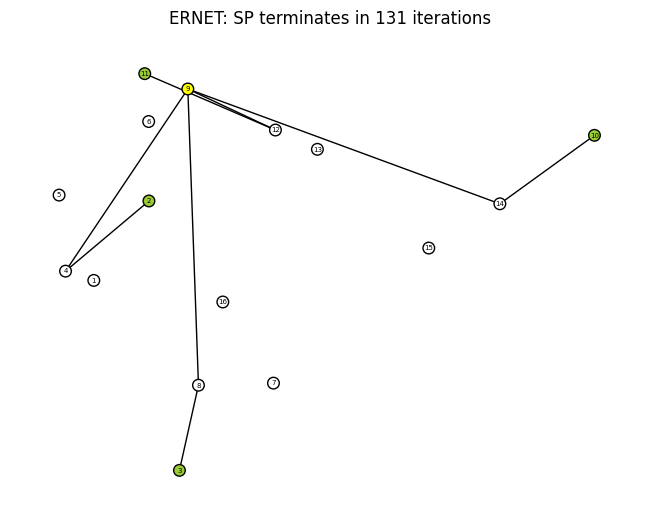

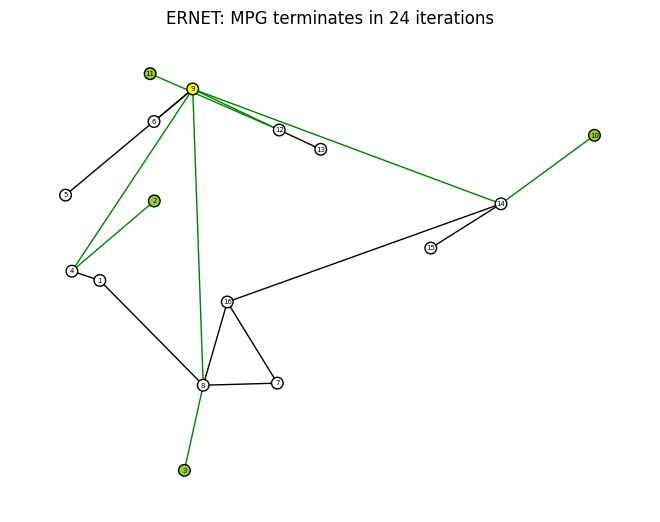



running 7: CANARIE


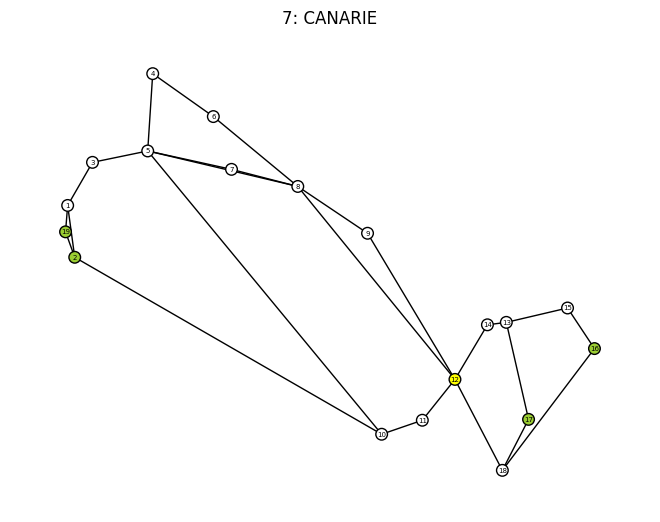

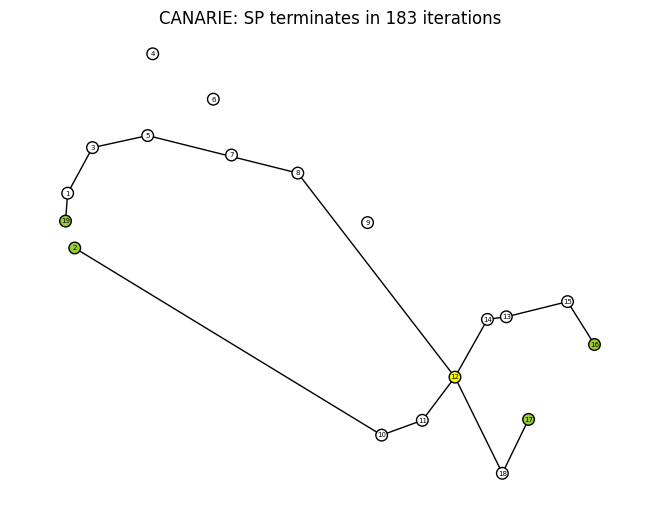

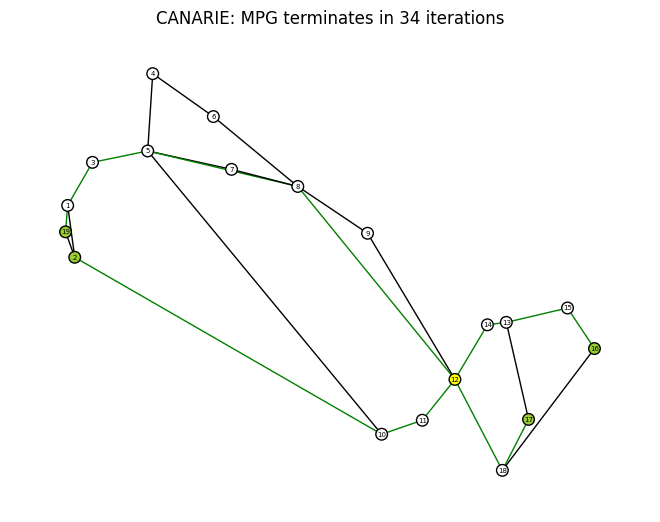



running 8: JPN12


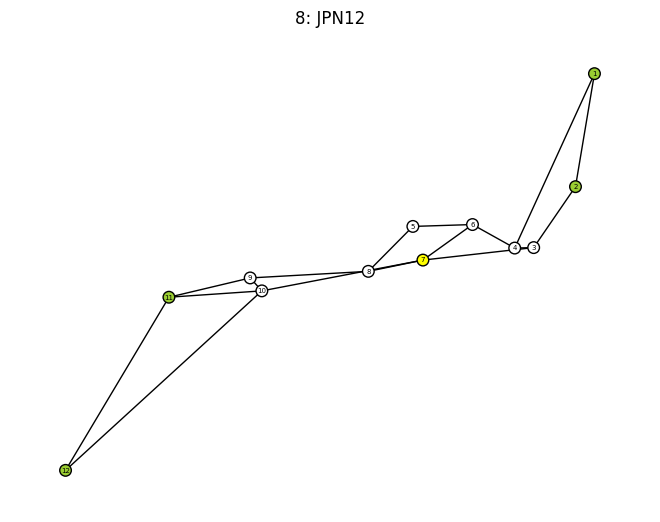

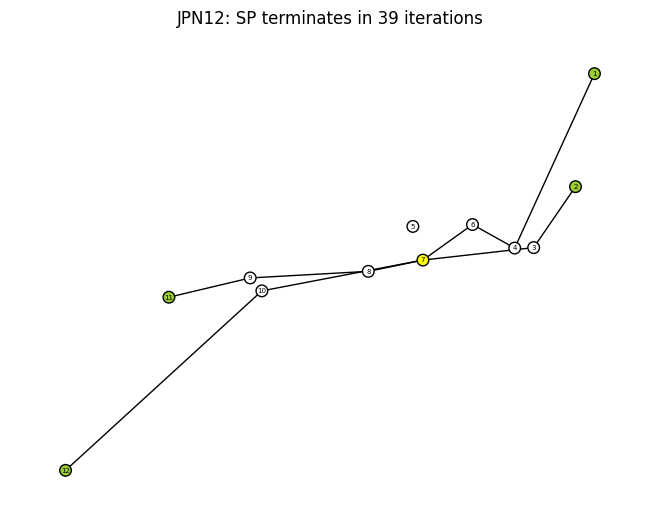

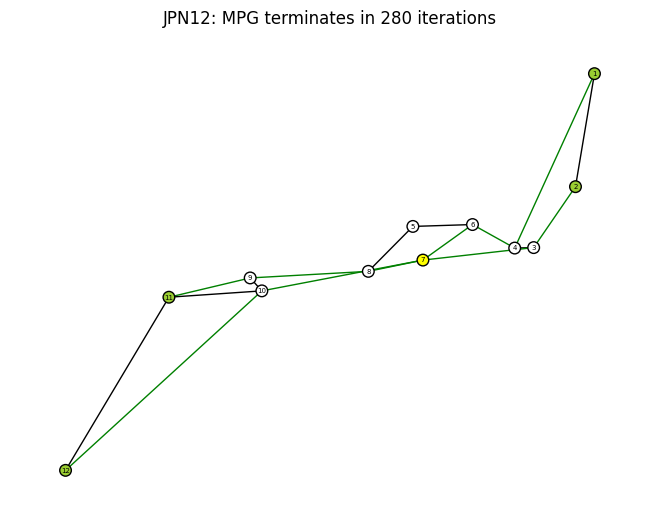



running 9: FUNET
Graph FUNET is problematic.


running 10: ARNES


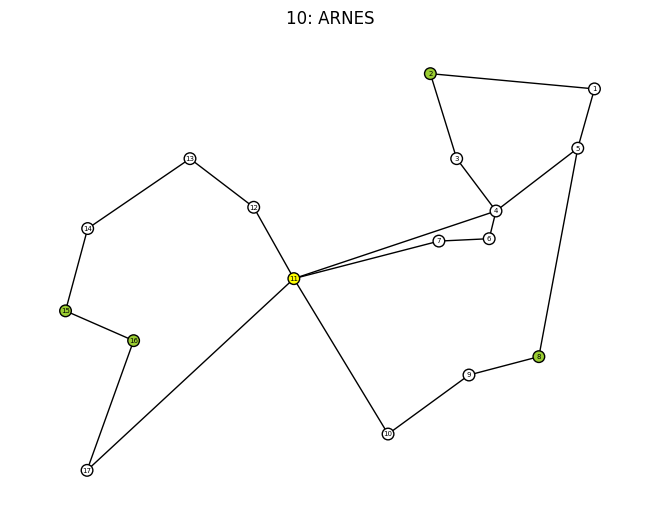

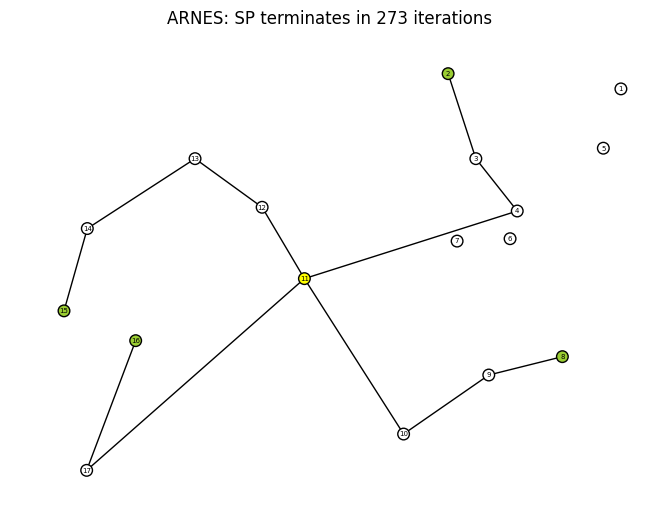

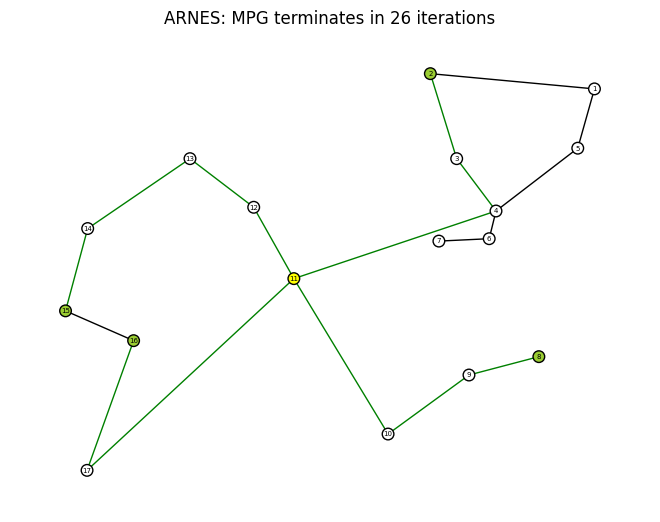



running 11: TATANID


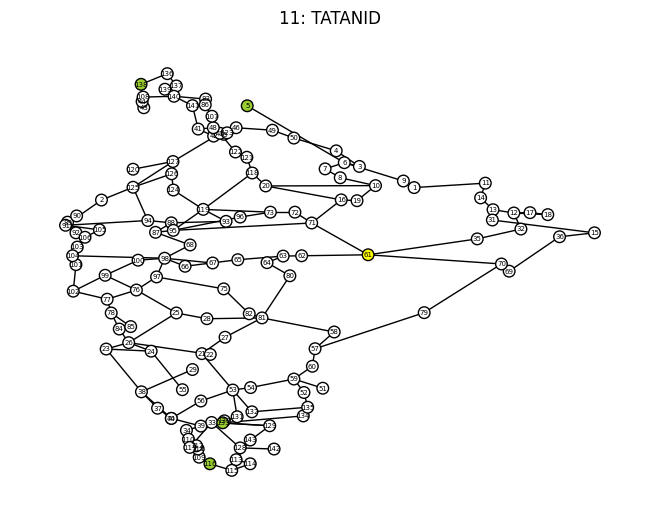

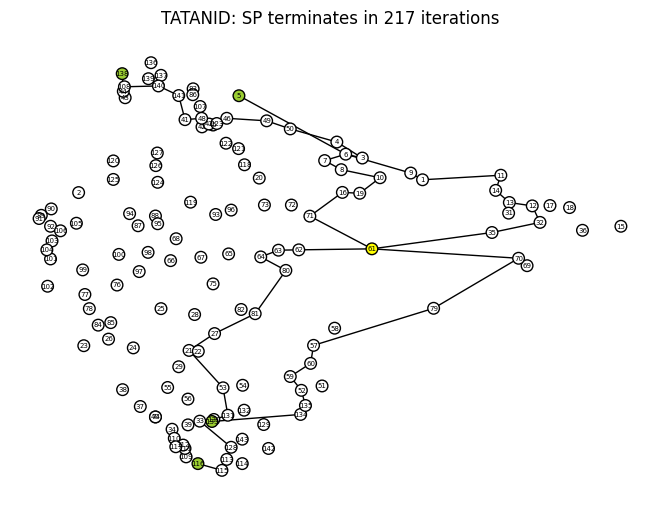

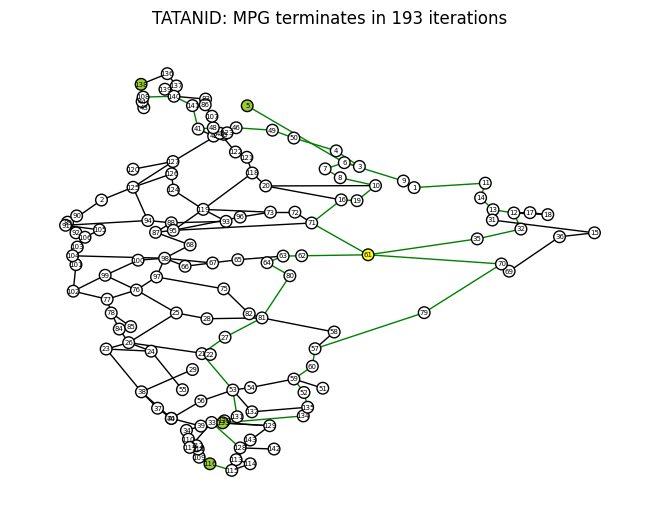



running 12: RENATER2004


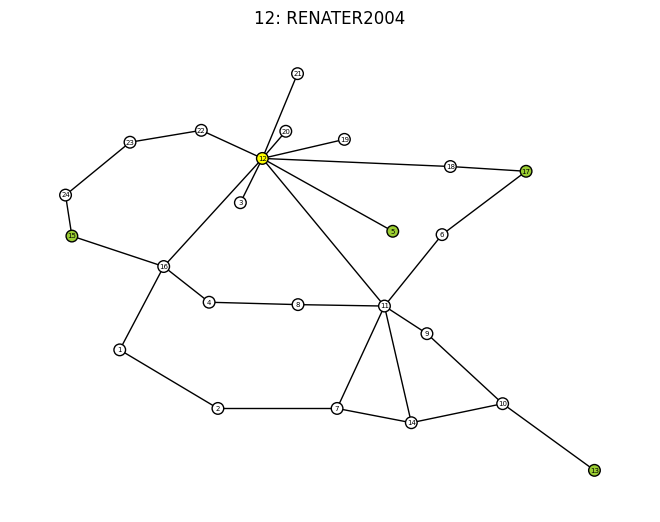

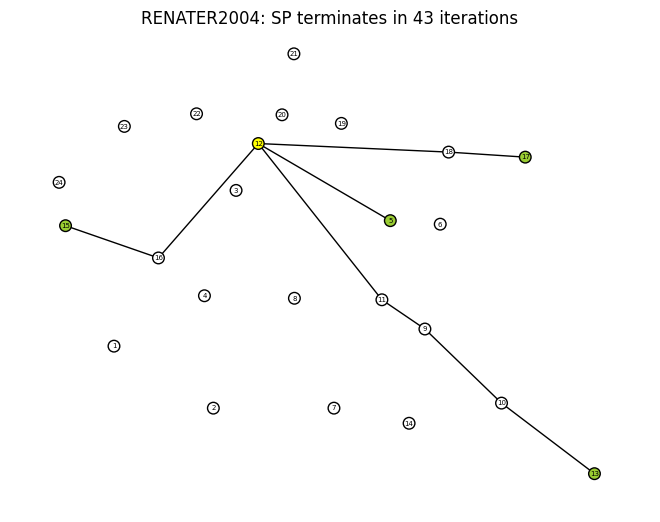

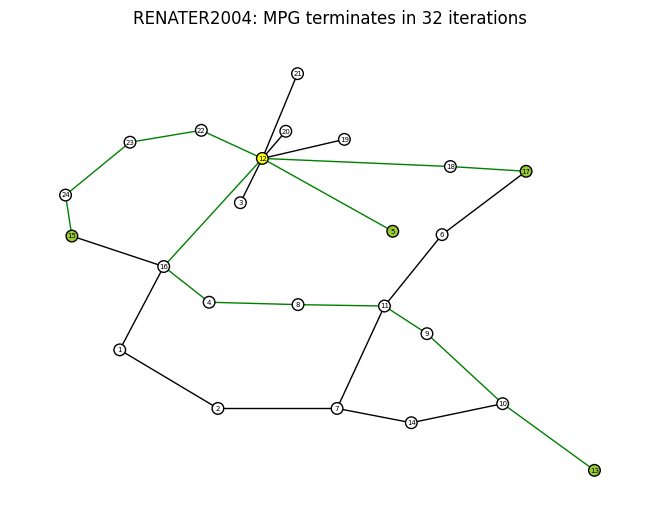



running 13: RENATER2001


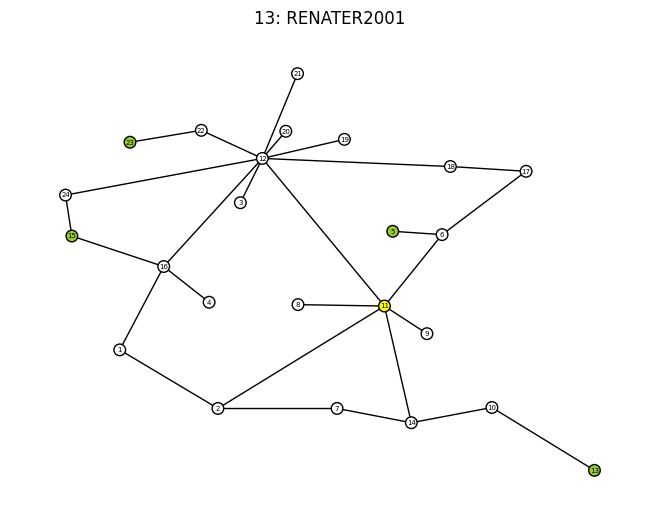

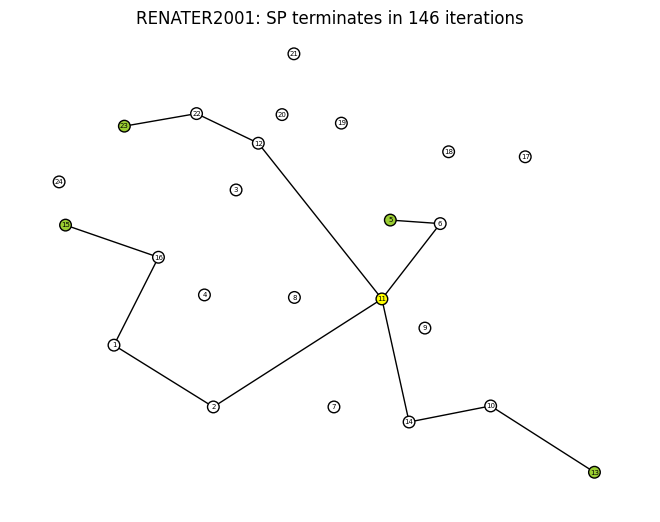

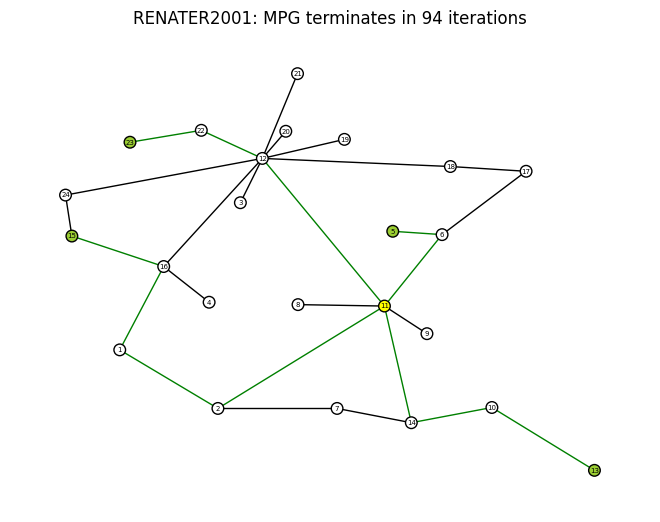



running 14: CWIX


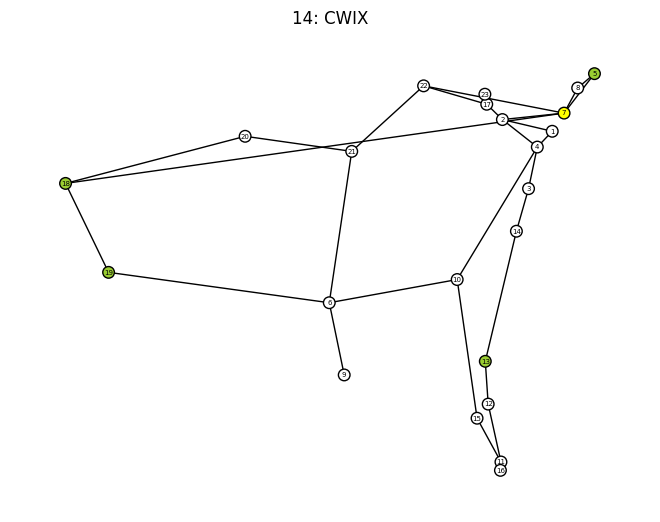

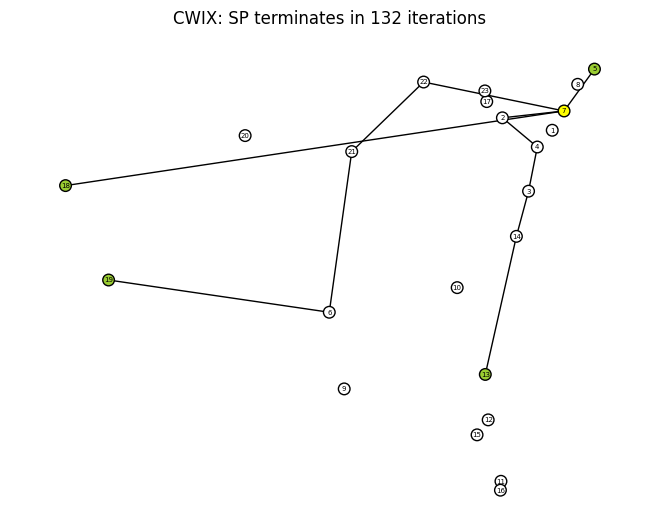

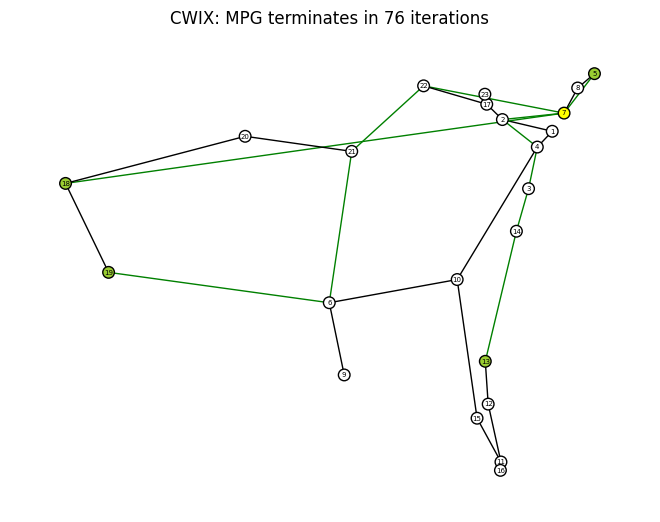



running 15: SAGO
Graph SAGO is problematic.


running 16: CESNET


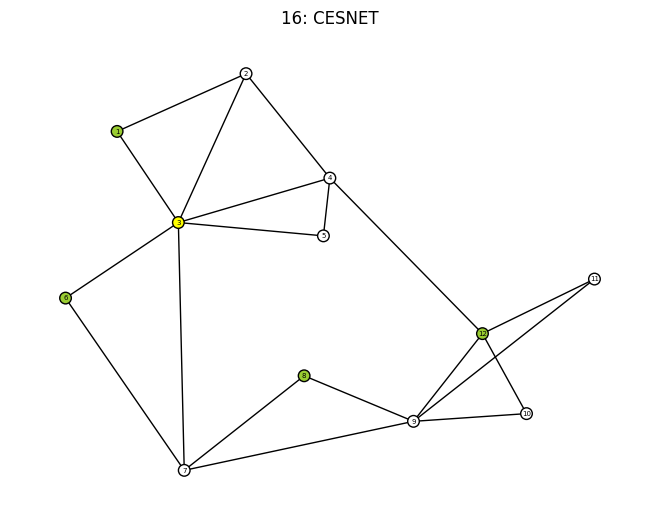

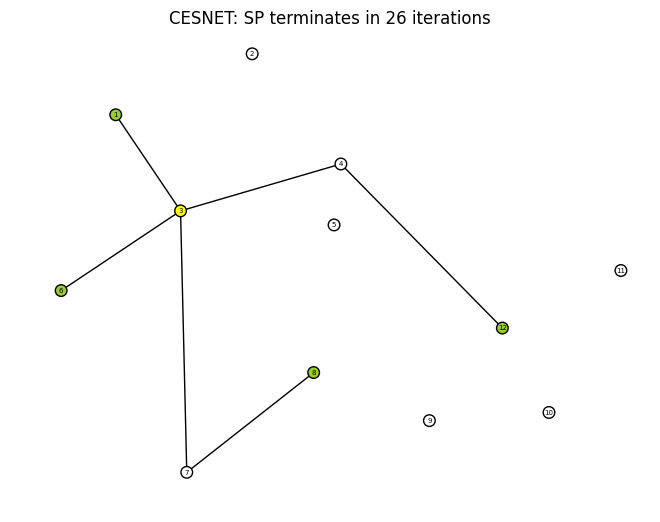

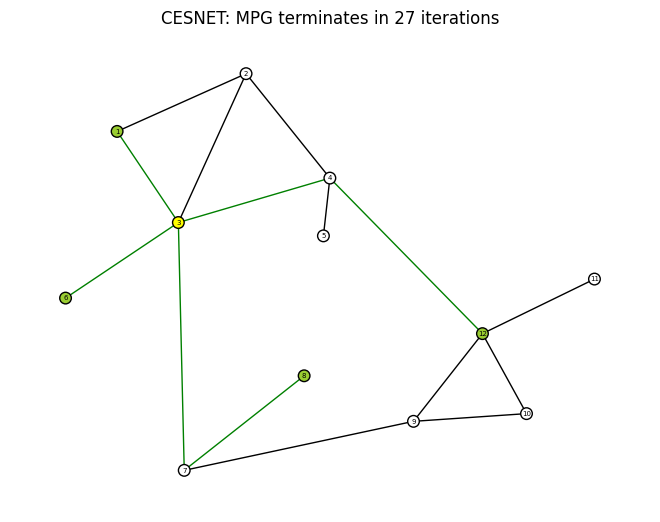



running 17: GERMANY50


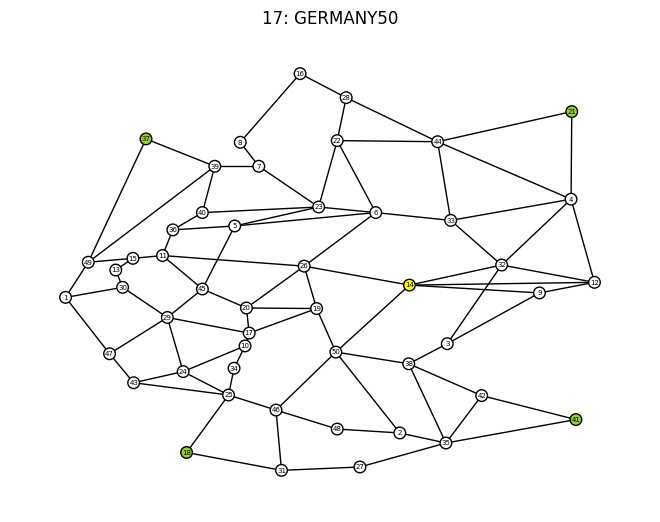

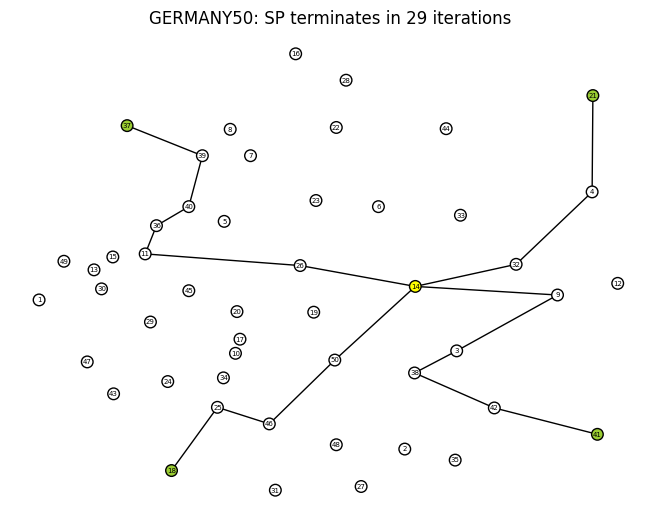

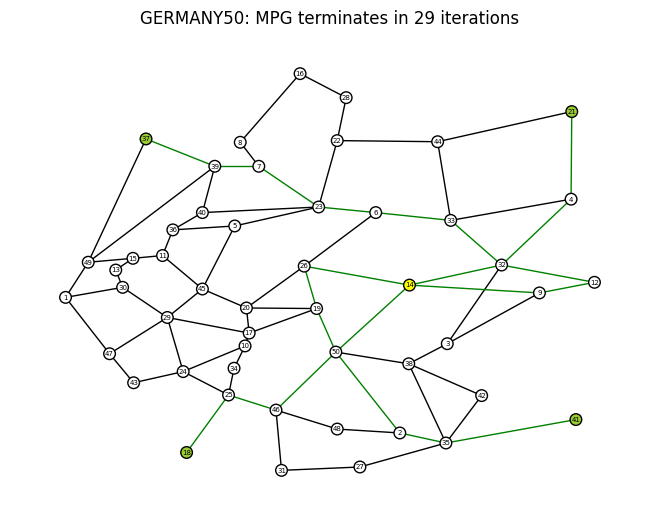



running 18: NEXTGEN
Graph NEXTGEN is problematic.


running 19: NETRAIL


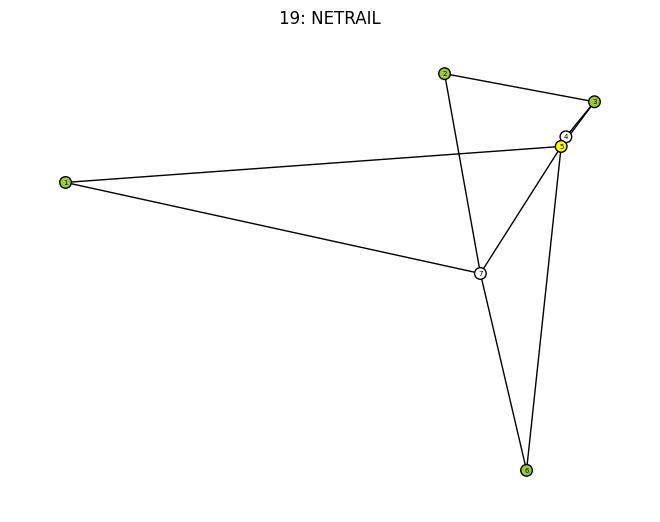

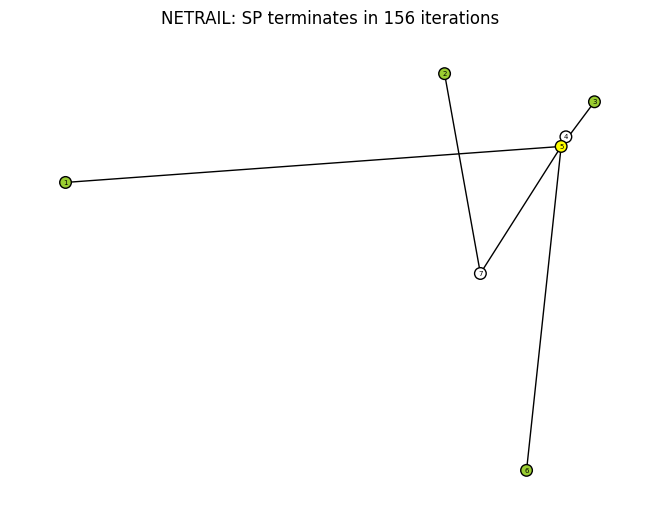

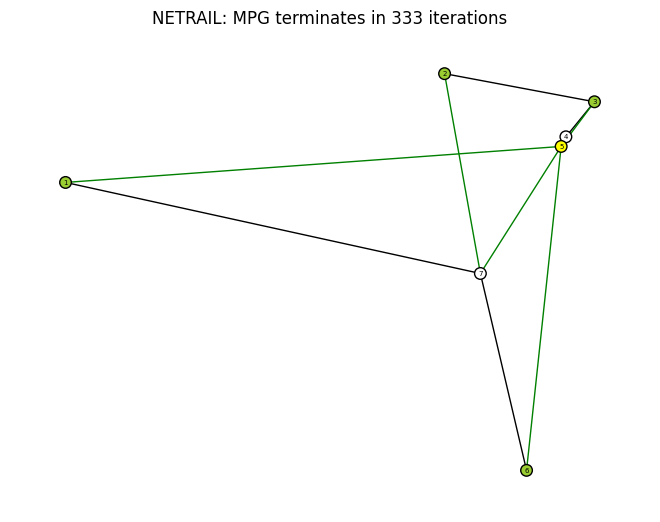



running 20: ATMNET
Graph ATMNET is problematic.


running 21: GEANT2


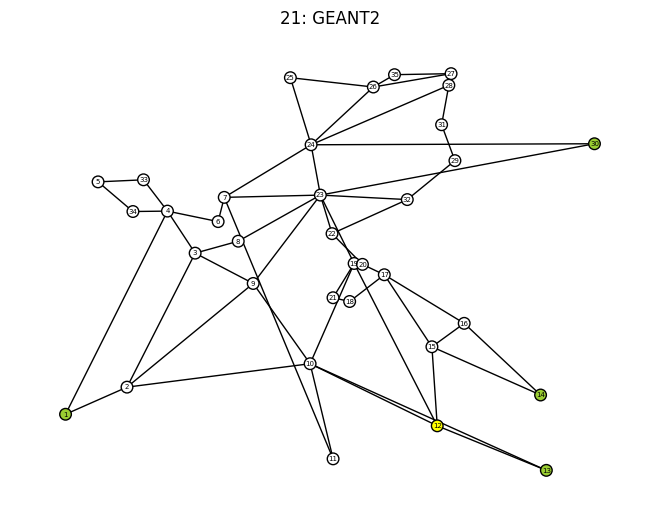

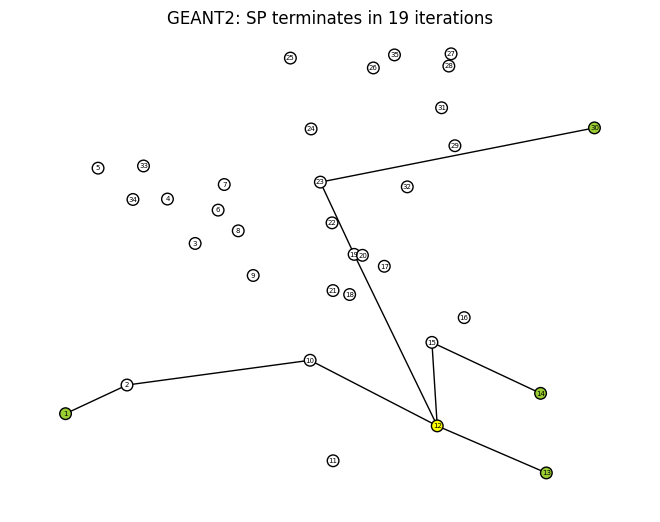

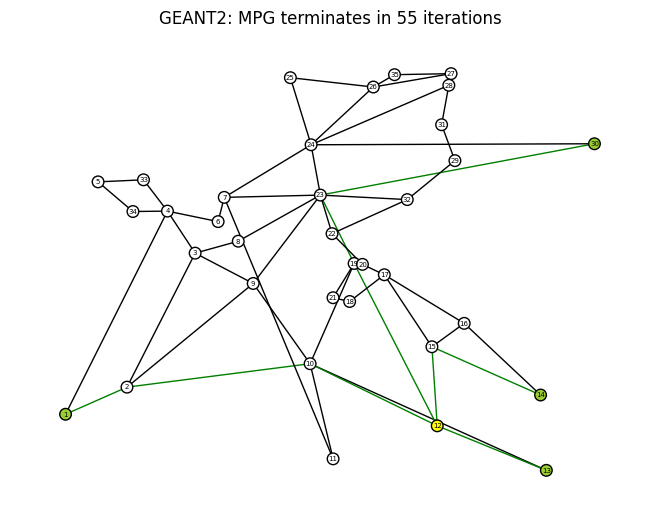



running 22: RENATER


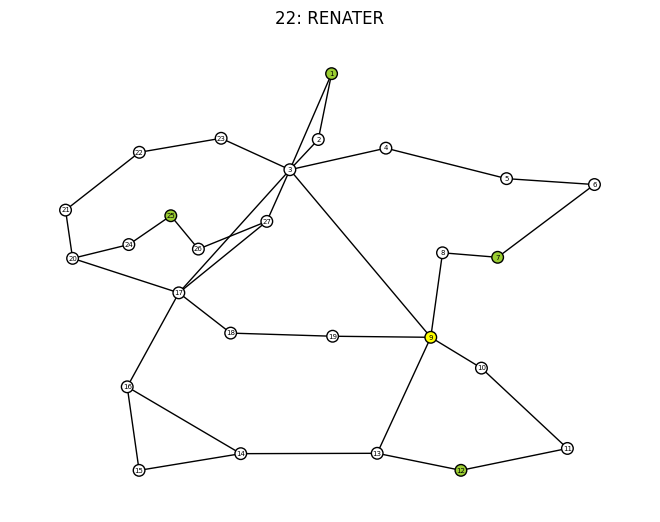

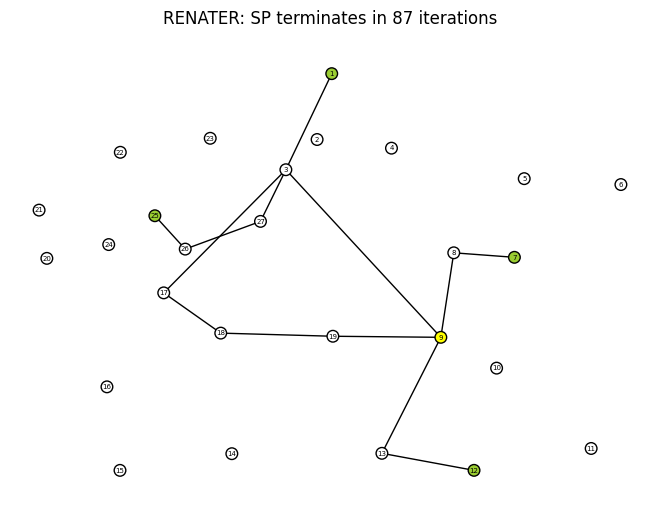

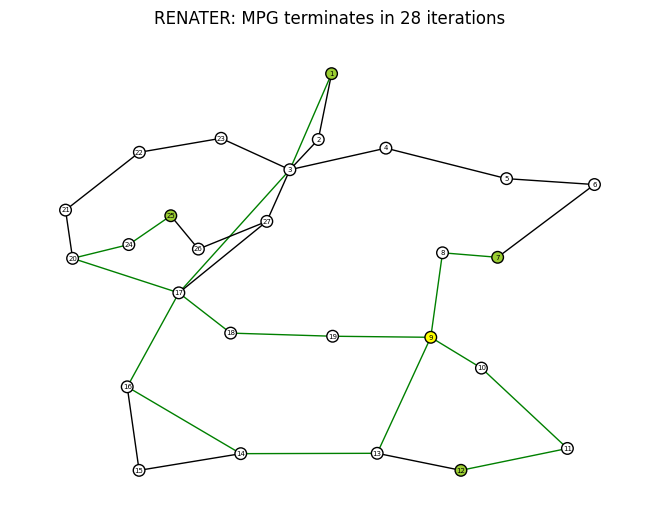



running 23: GTSCZECHREPUBLIC
Graph GTSCZECHREPUBLIC is problematic.


running 24: SANREN
Graph SANREN is problematic.


running 25: EPOCH
Graph EPOCH is problematic.


running 26: RENATER2008


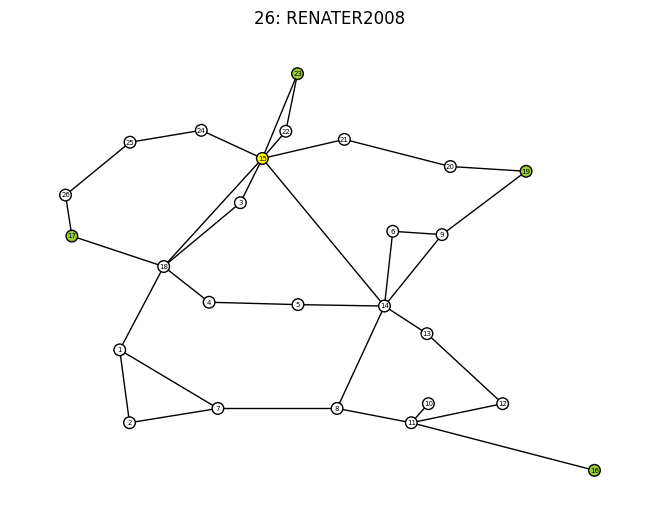

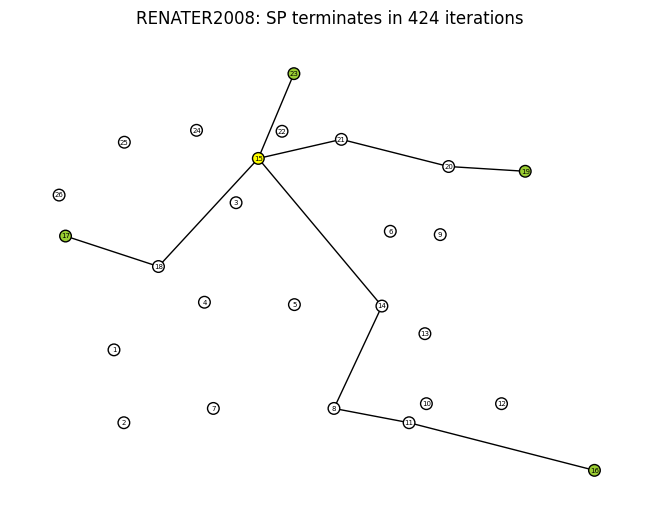

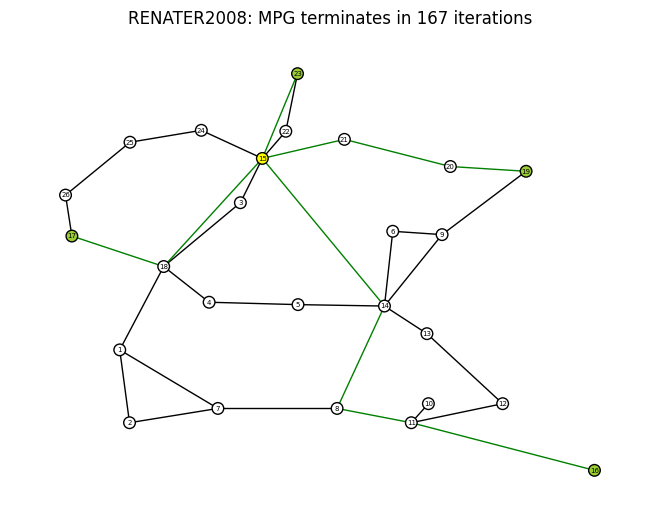



running 27: CONUS6079


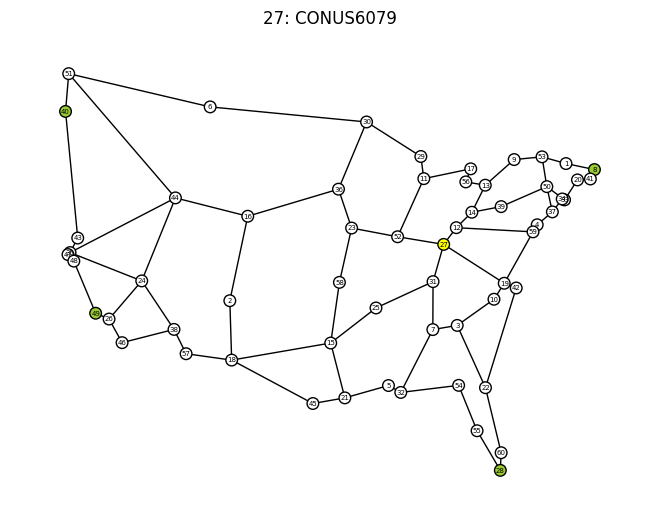

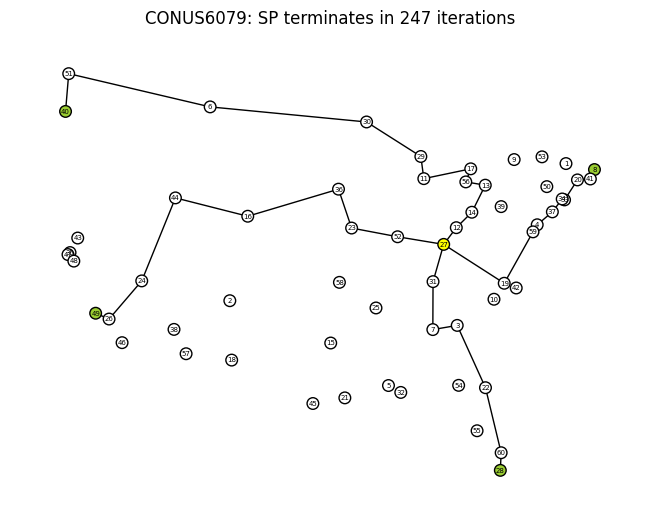

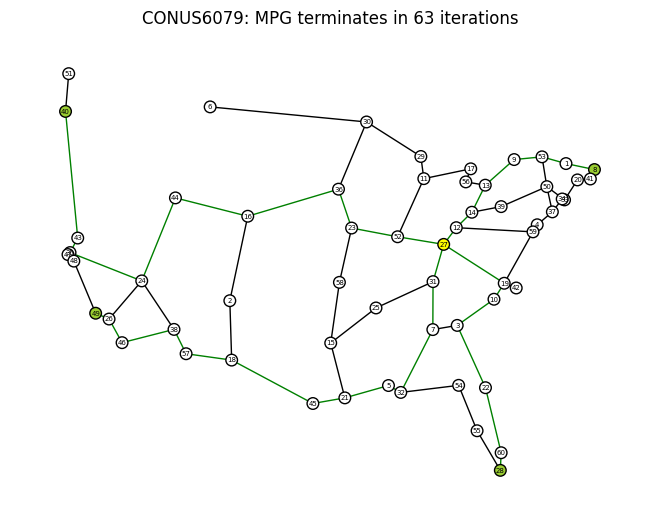



running 28: GTSPOLAND


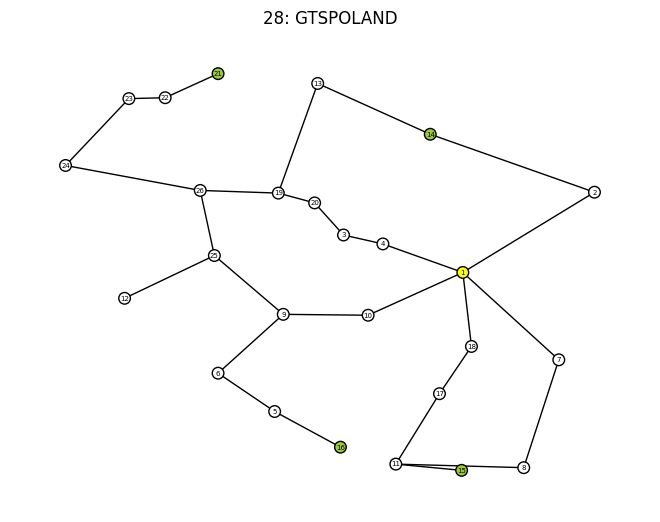

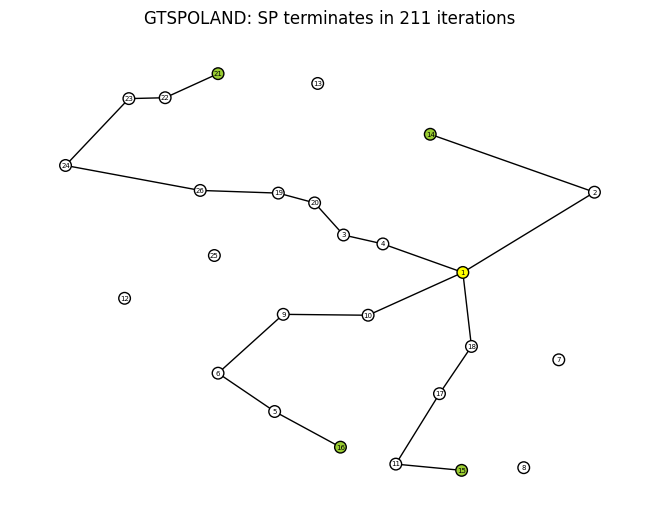

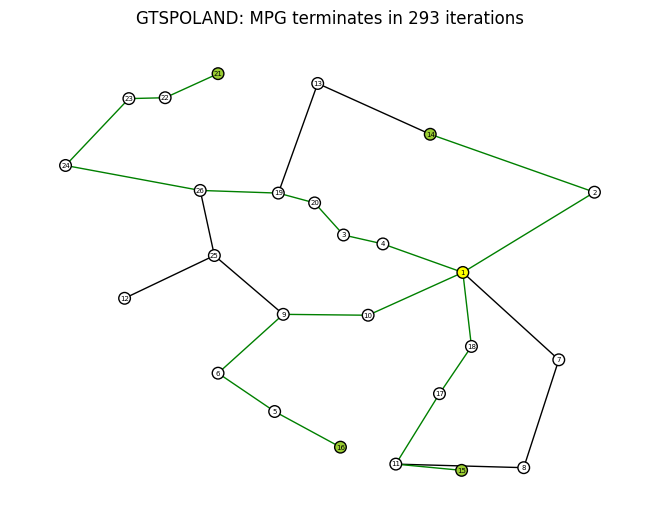



running 29: CONUS75


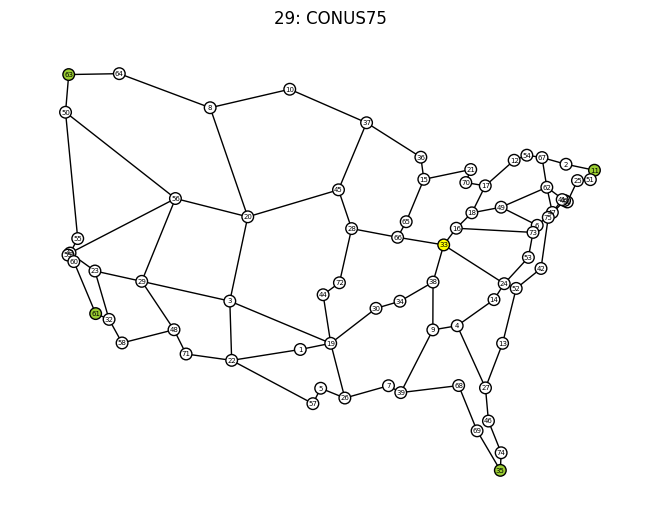

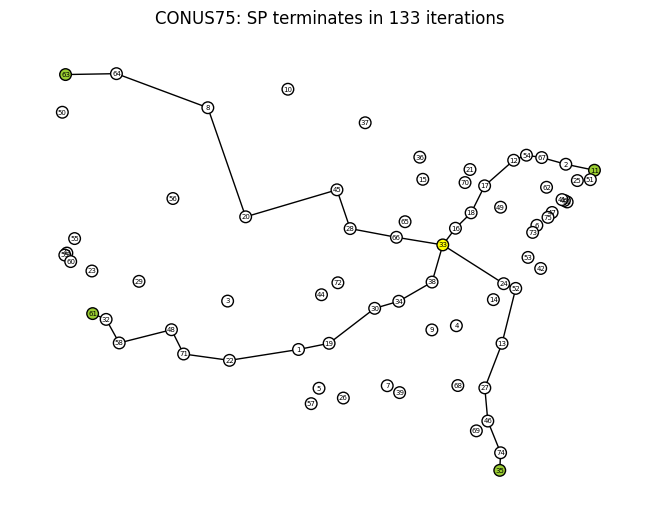

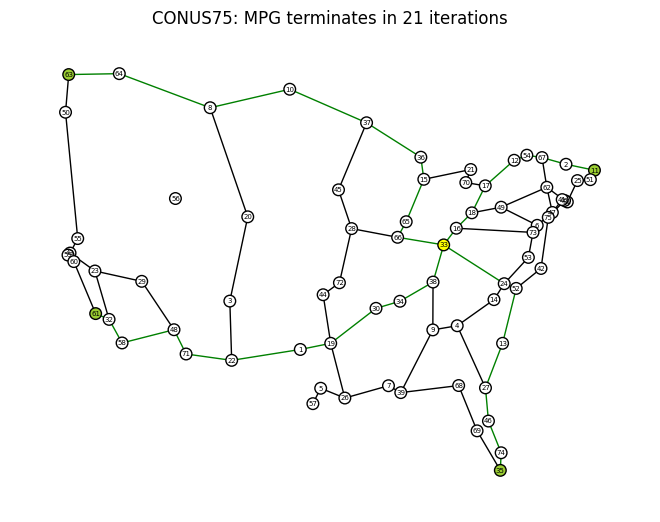



running 30: USA100


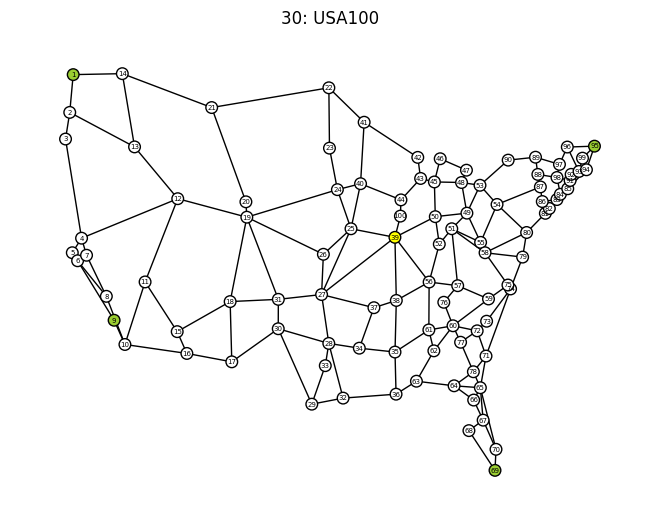

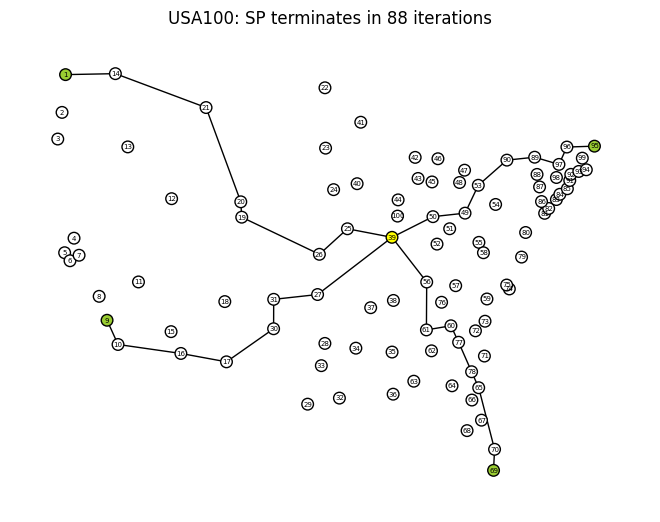

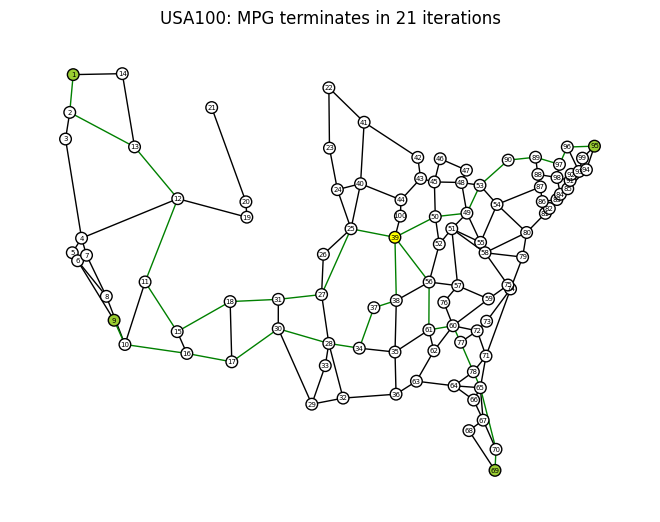



running 31: HOSTWAYINTERNATIONAL
Graph HOSTWAYINTERNATIONAL is problematic.


running 32: HIBERNIANIRELAND
Graph HIBERNIANIRELAND is problematic.


running 33: RENATER1999


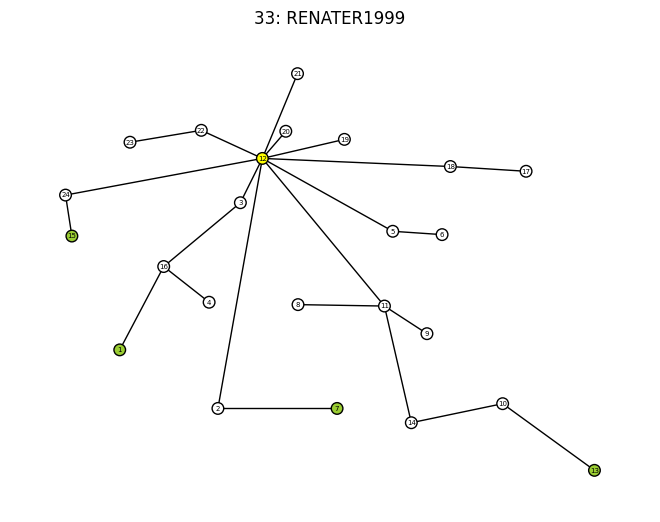

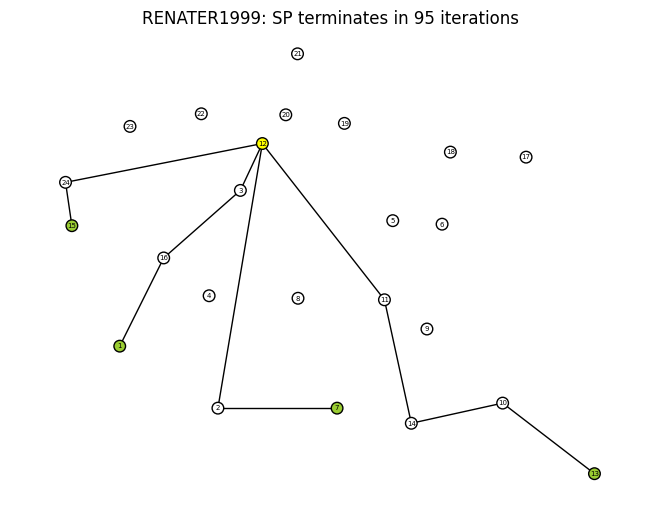

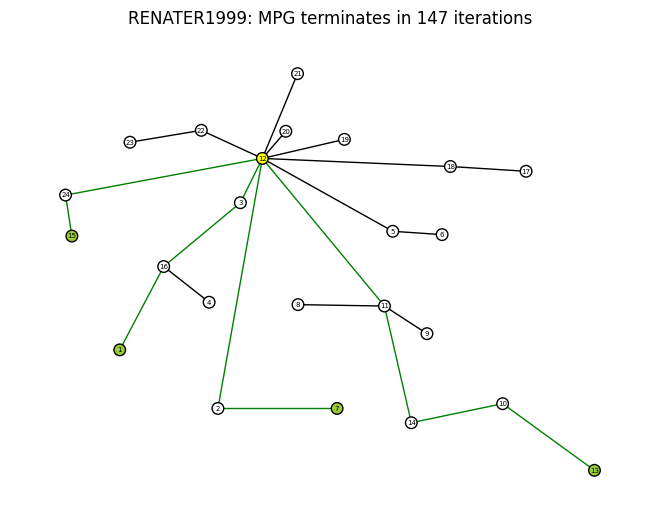



running 34: JPN48


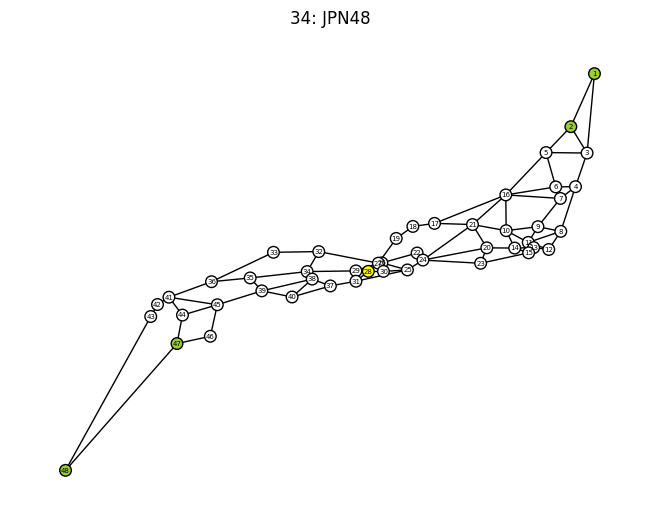

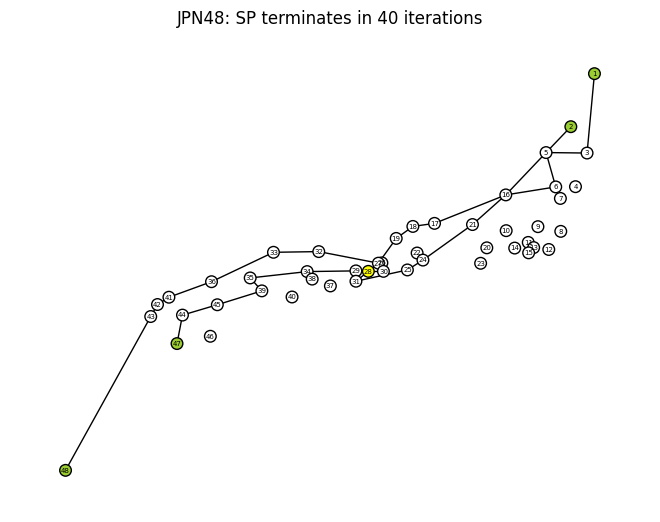

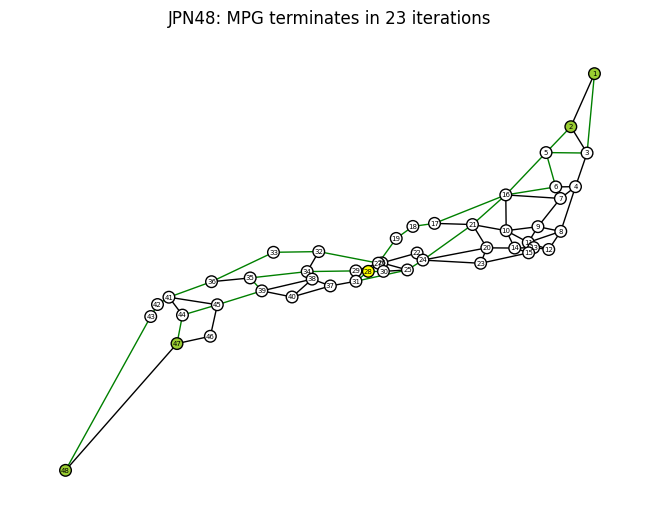



running 35: PORTUGAL


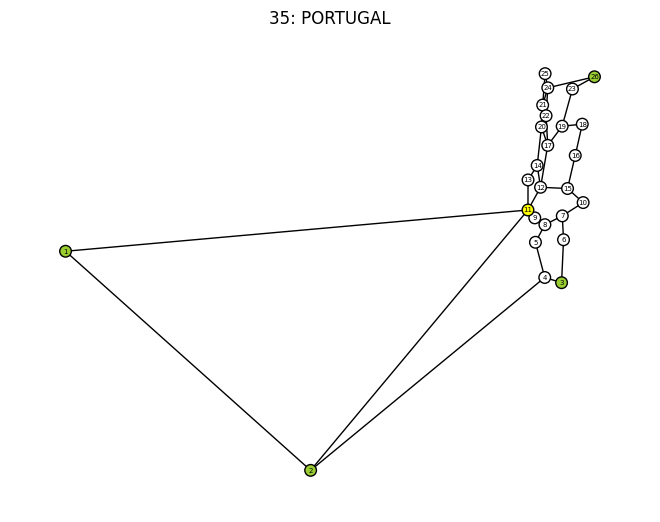

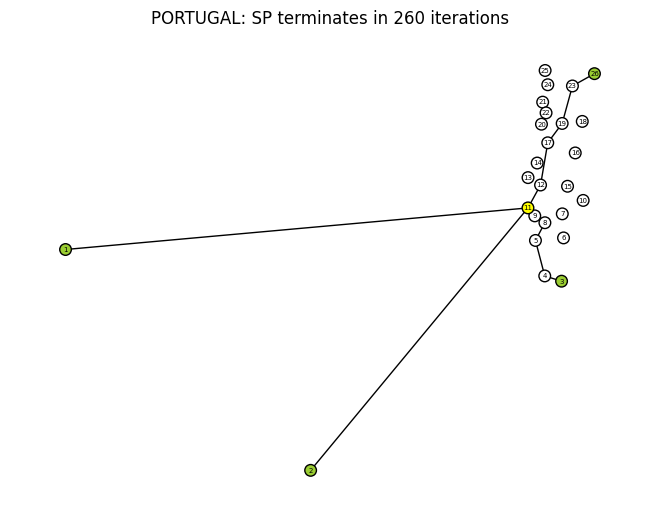

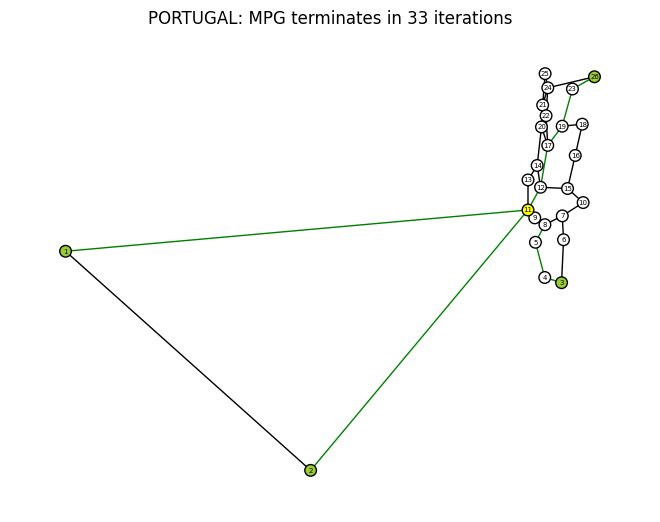



running 36: DIGEX


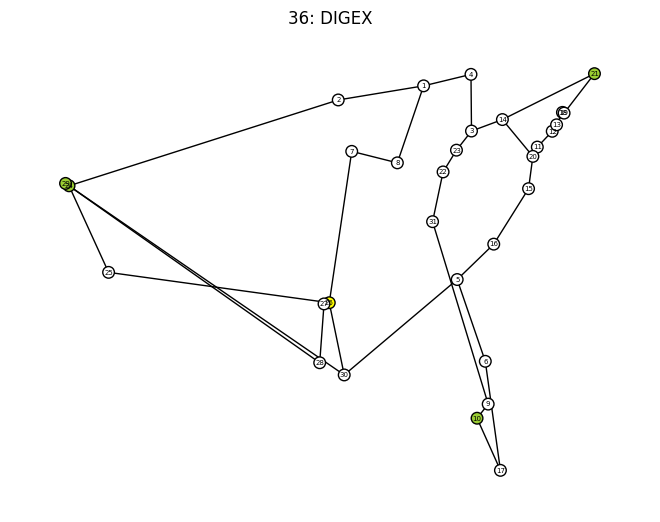

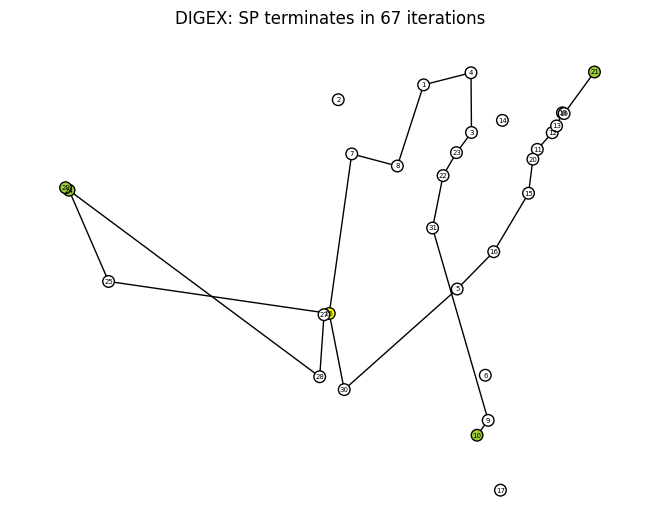

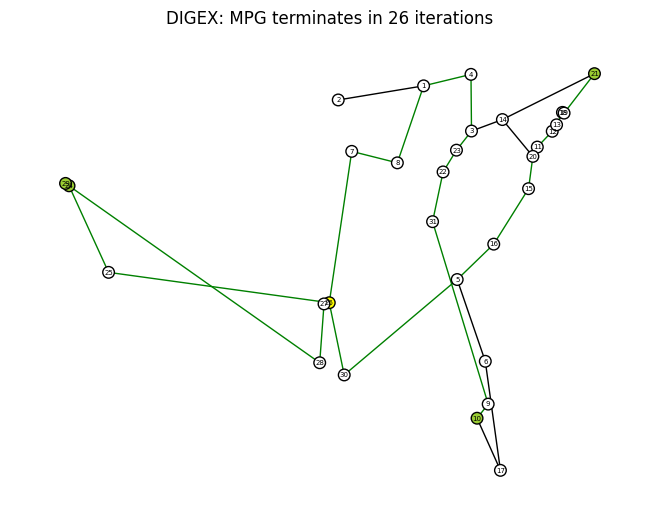



running 37: ITALY


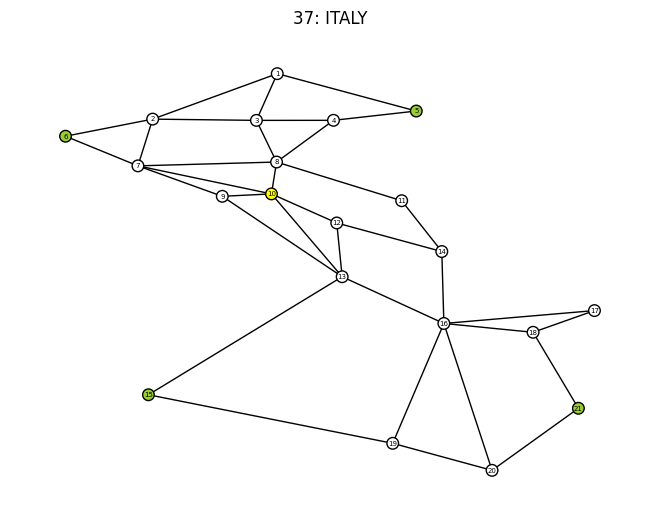

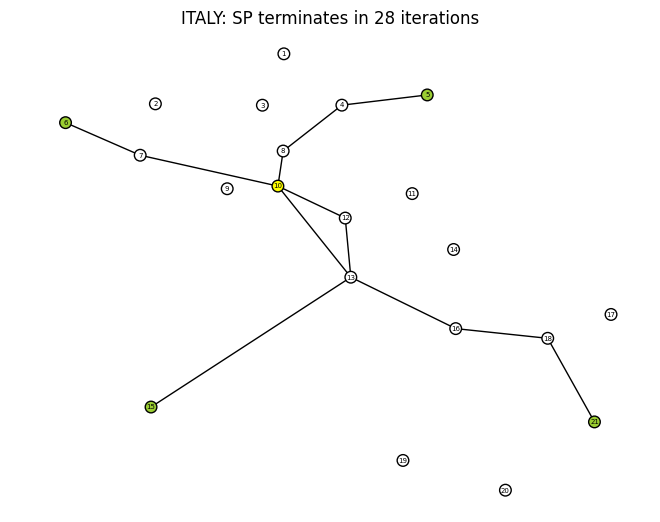

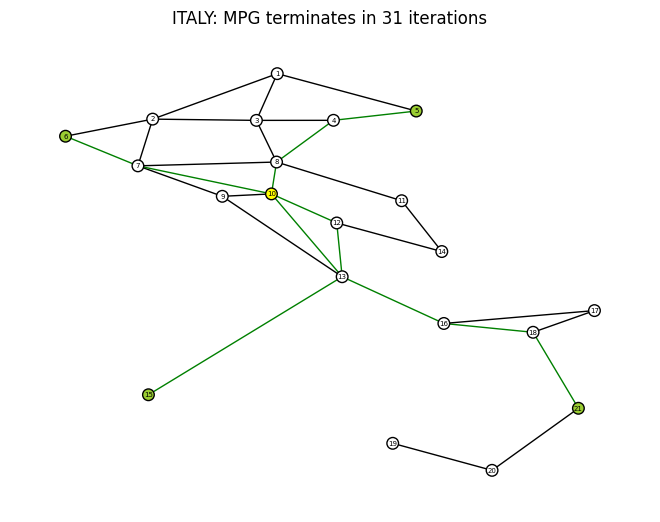



running 38: VIA


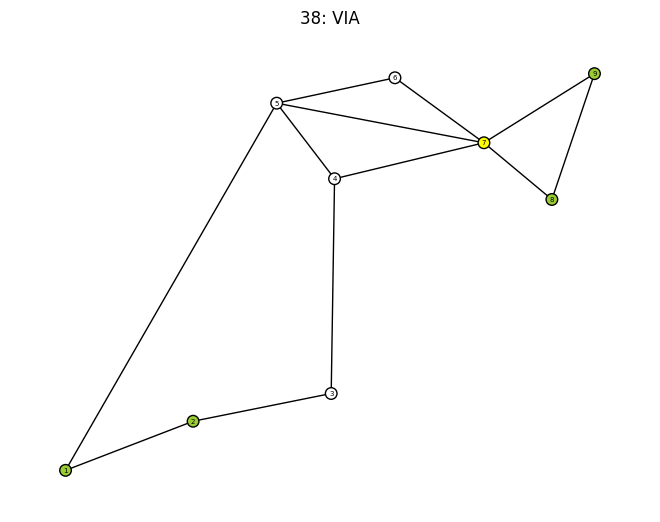

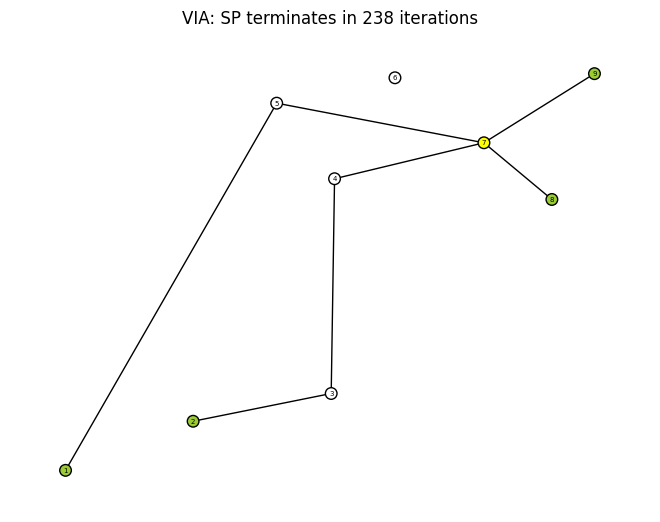

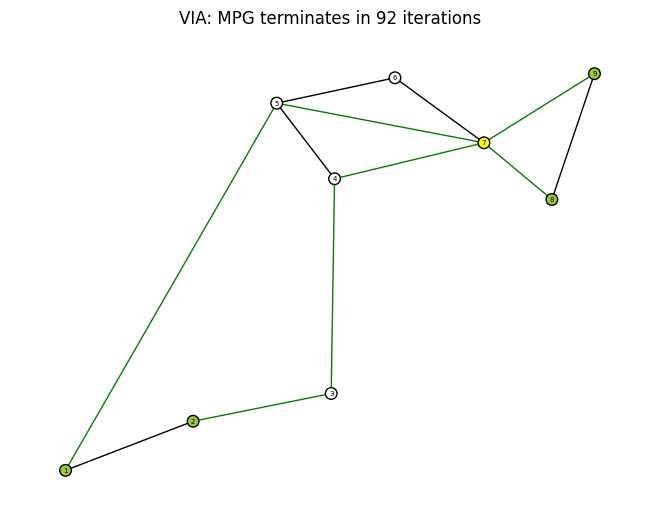



running 39: REDCLARA


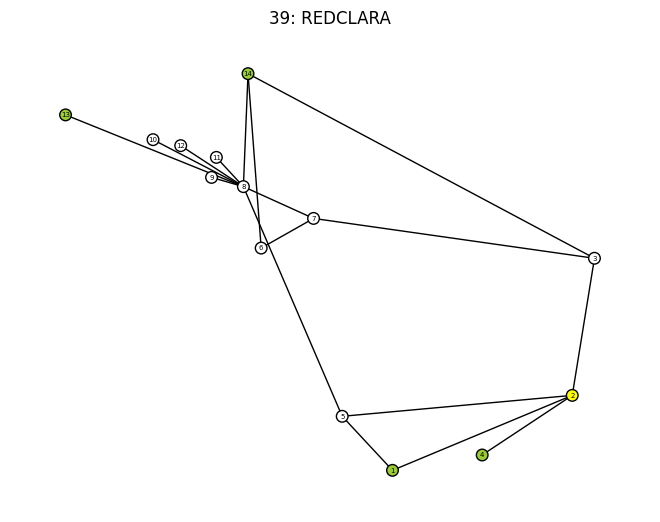

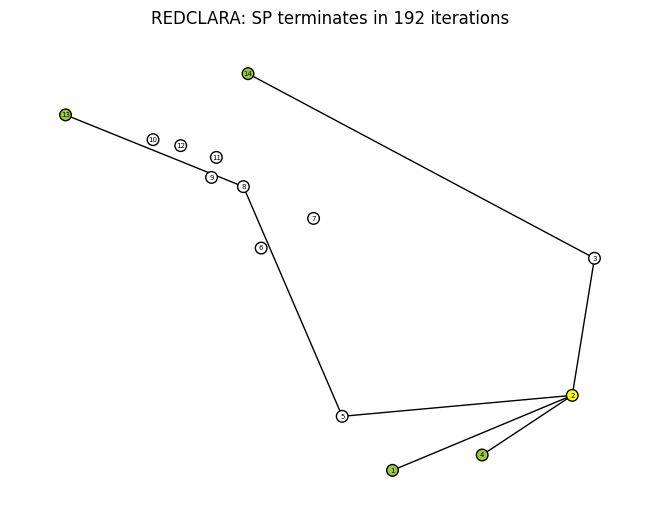

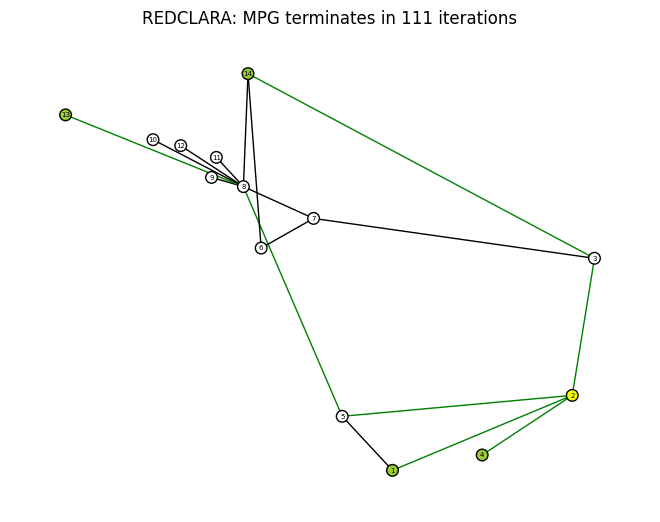



running 40: ANS


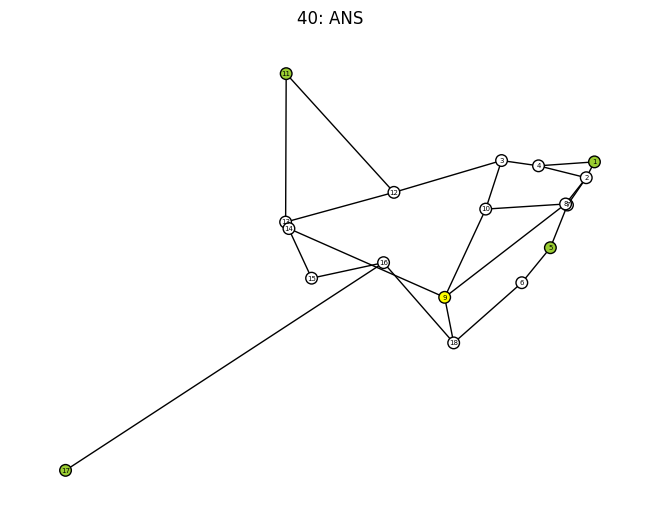

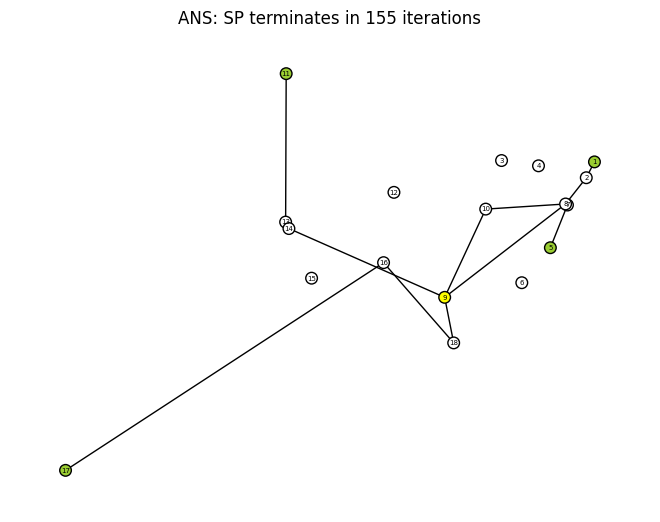

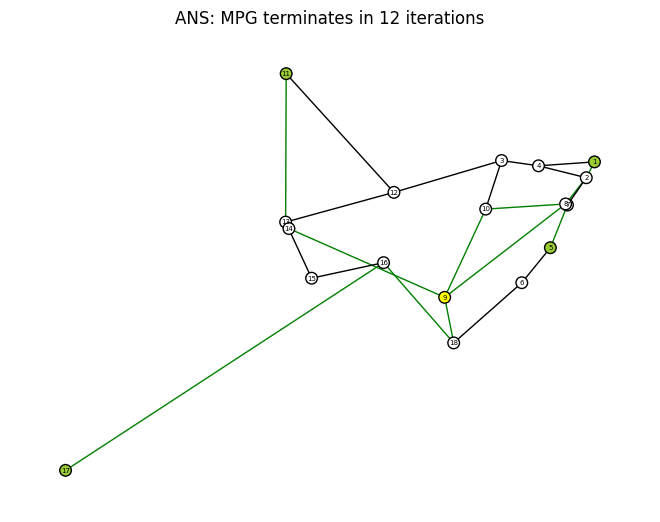



running 41: RENATER2006


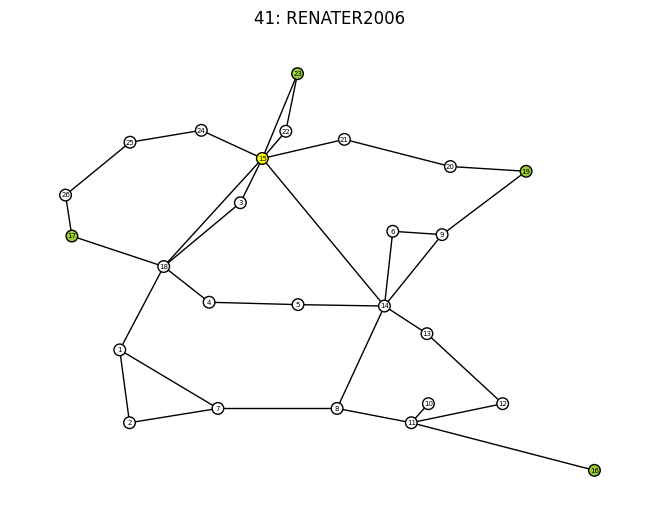

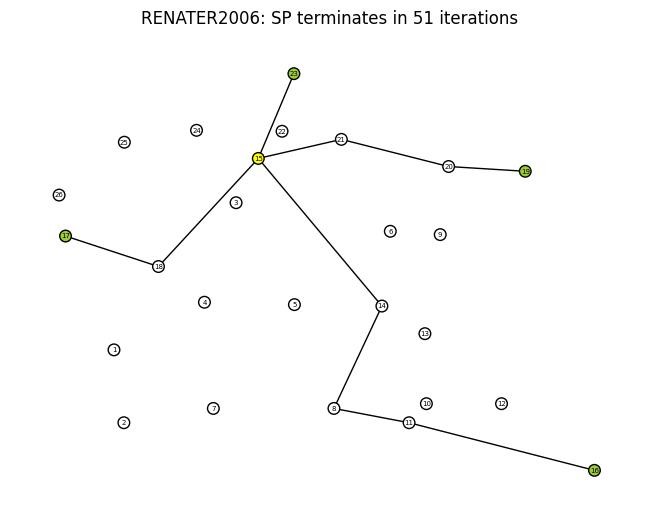

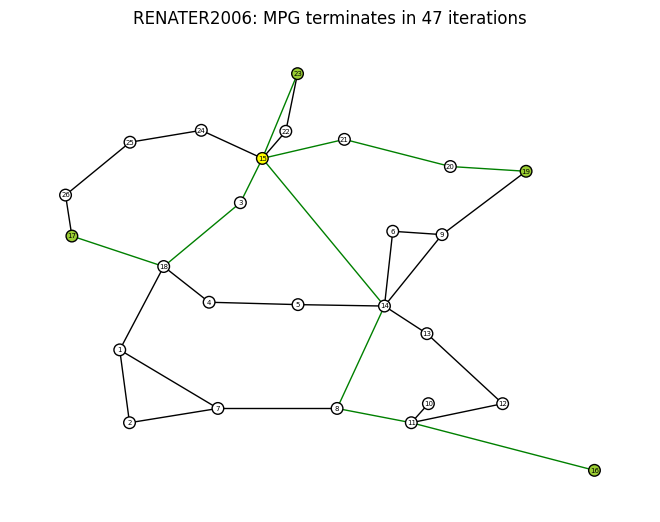



running 42: REDIRIS


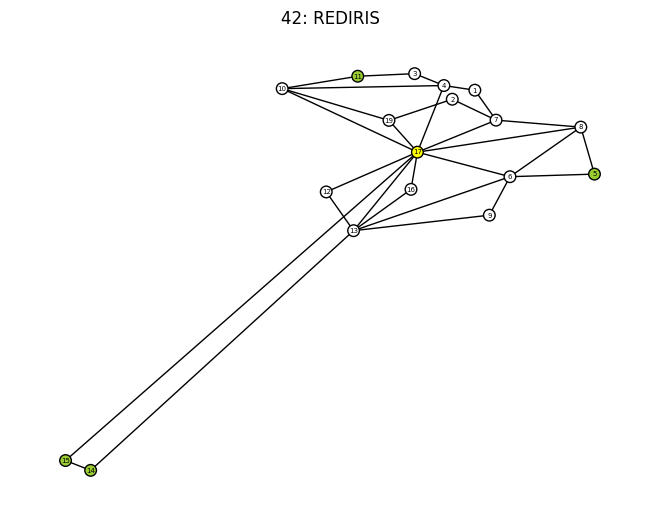

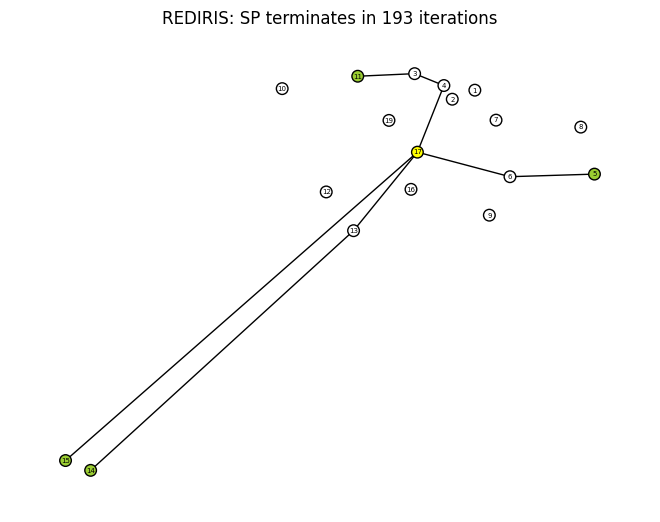

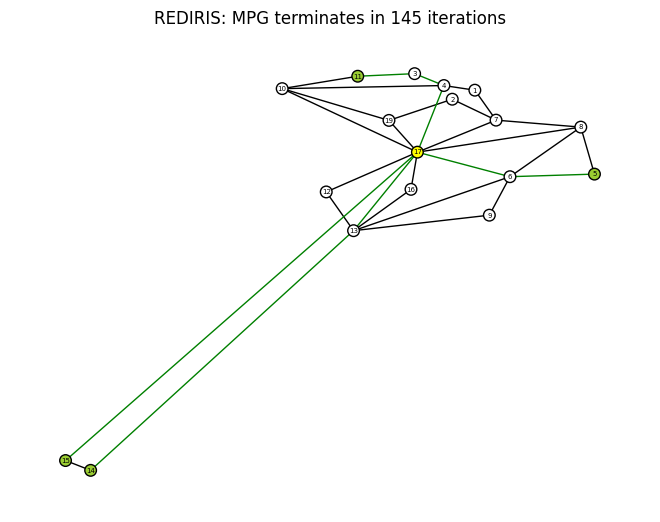



running 43: BICS


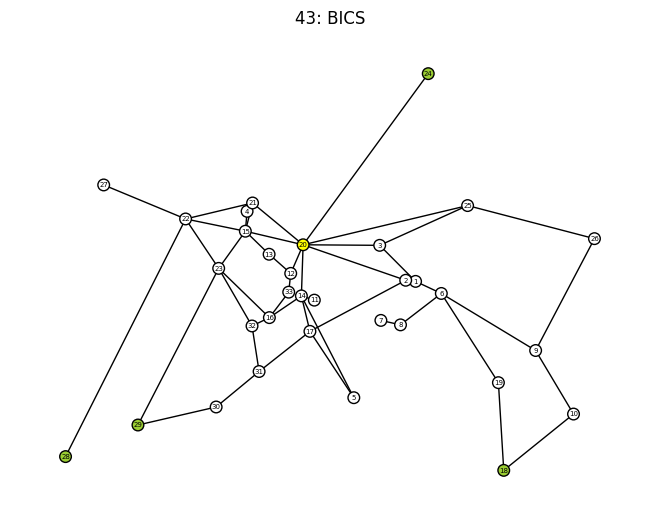

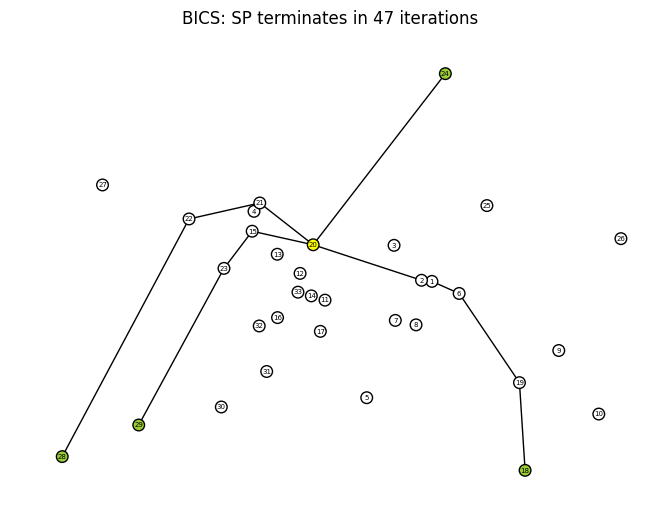

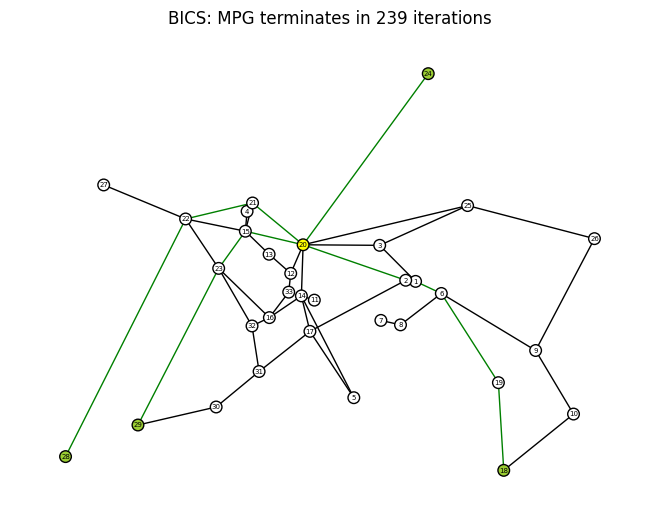



running 44: BREN
Graph BREN is problematic.


running 45: INTEGRA


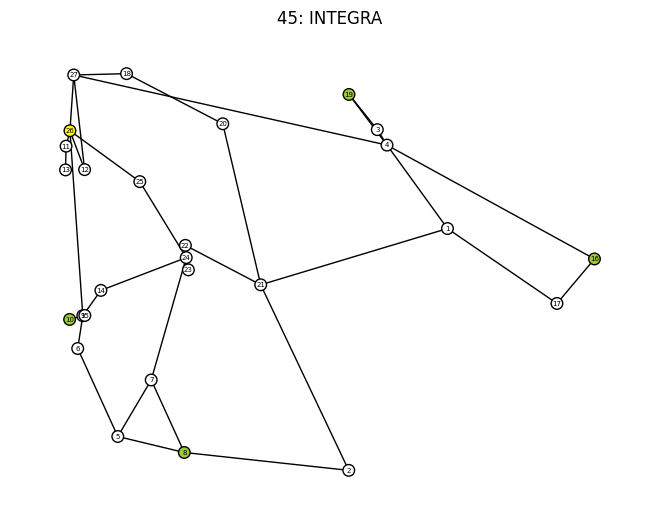

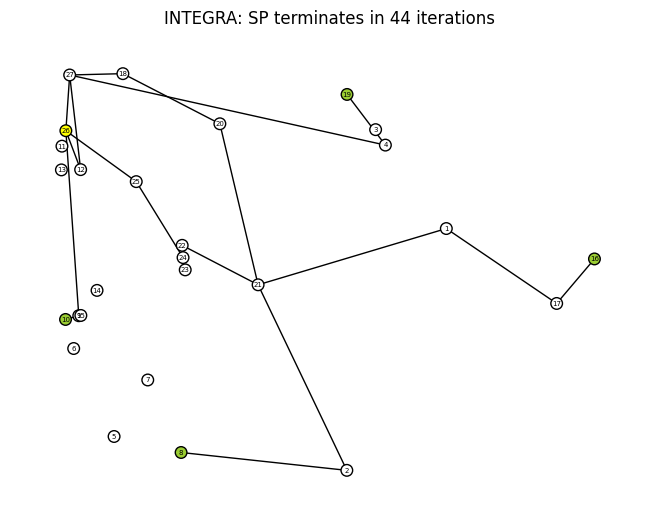

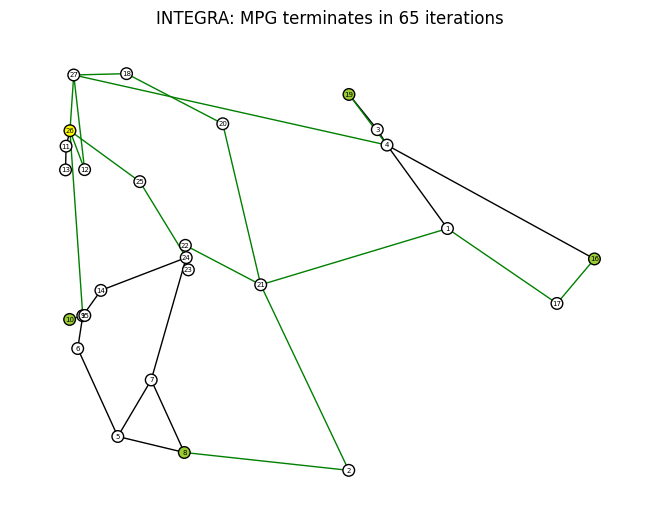



running 46: UNIC
Graph UNIC is problematic.


running 47: COST


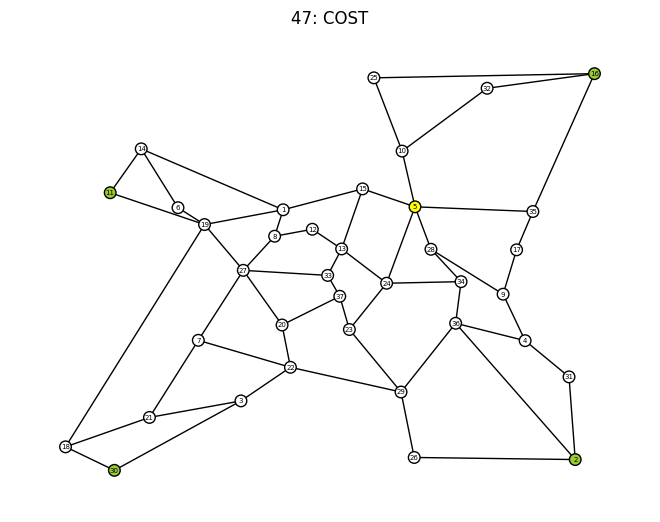

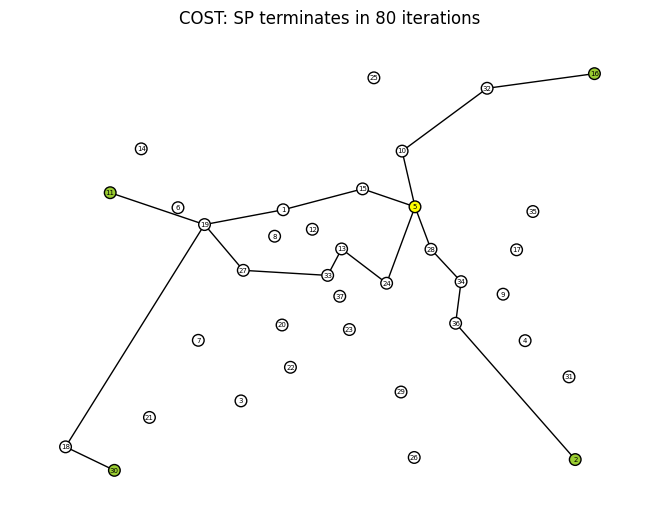

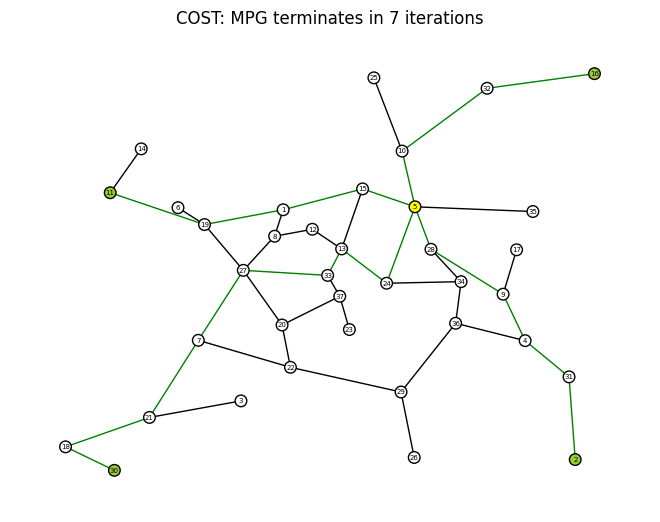



running 48: OXFORD


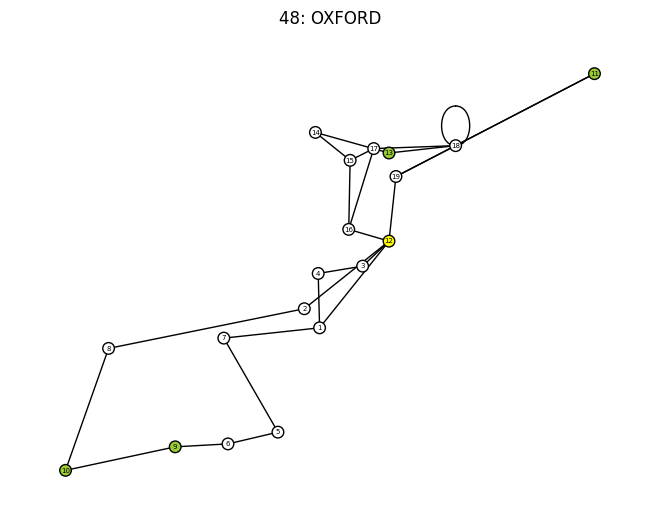

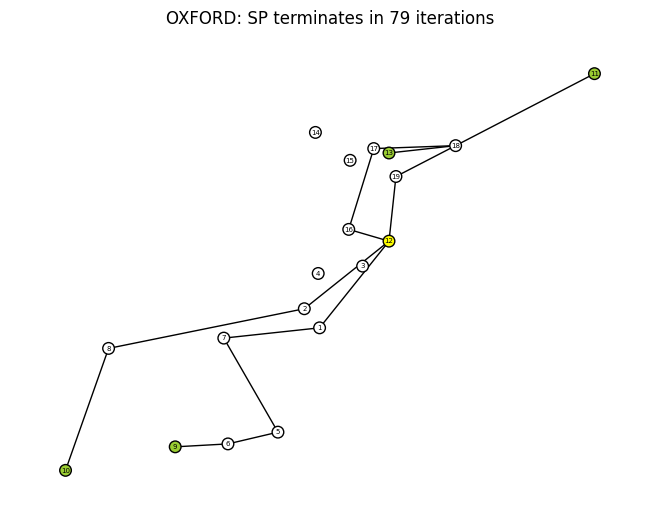

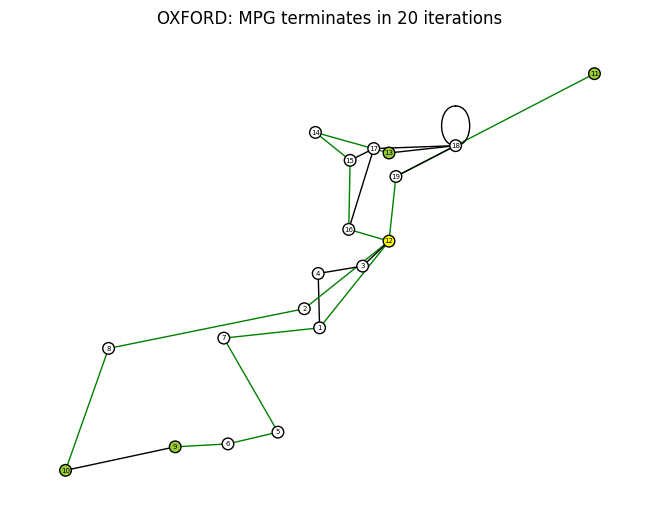



running 49: CONUS100


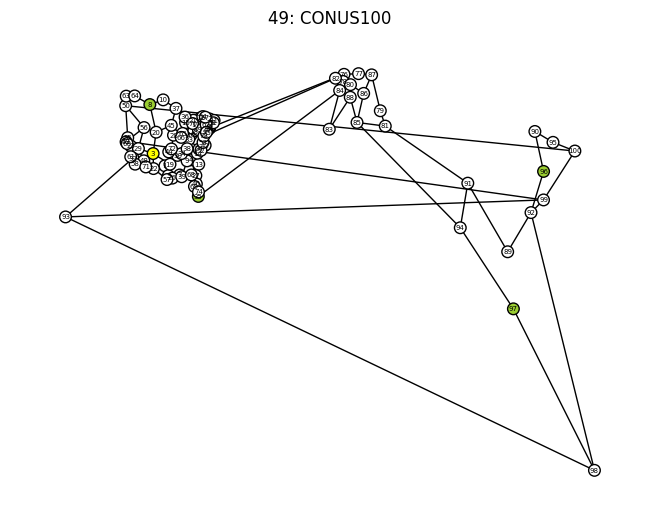

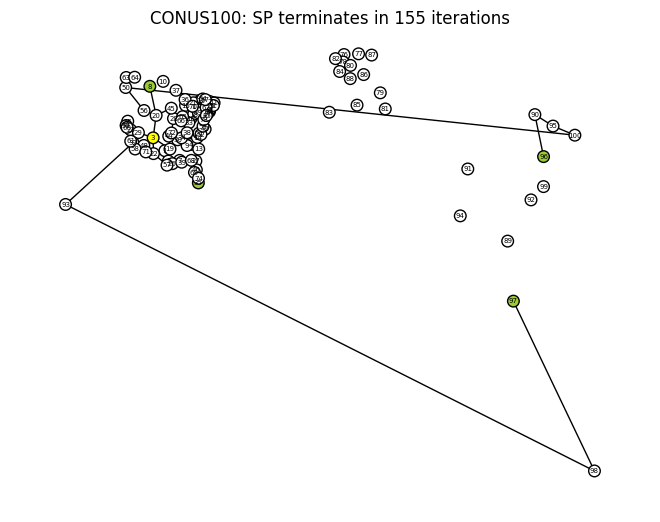

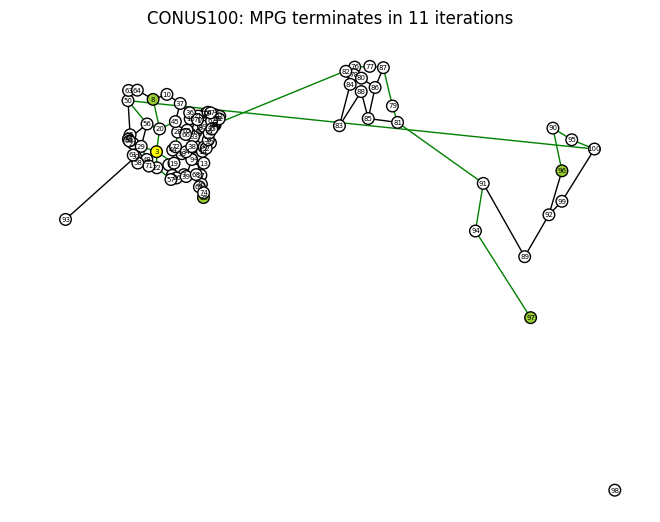



running 50: CRLNETWORKSERVICES


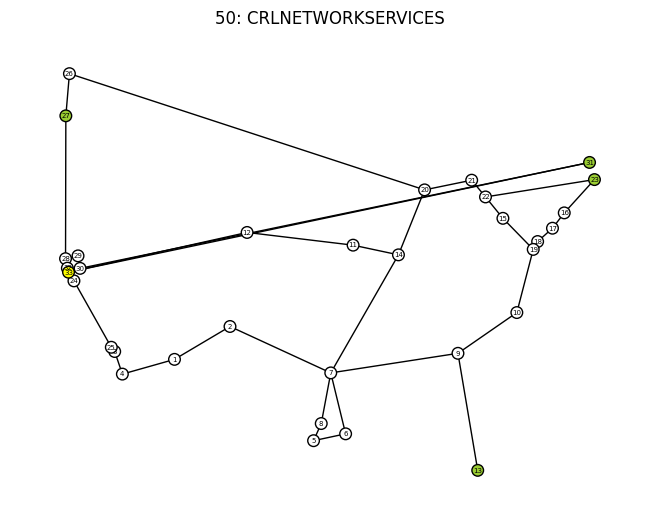

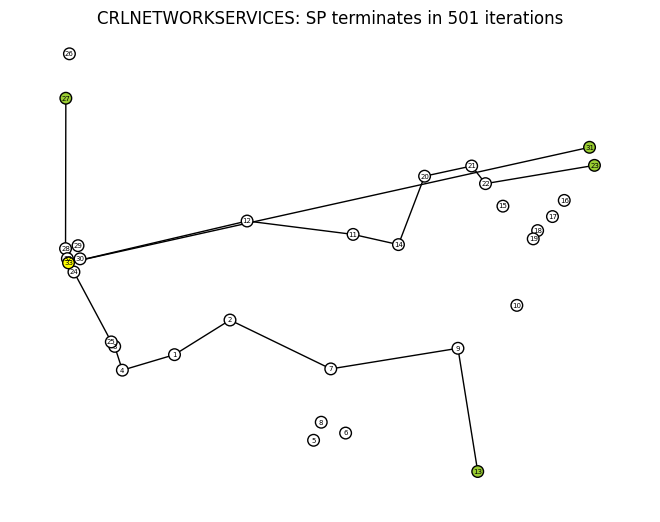

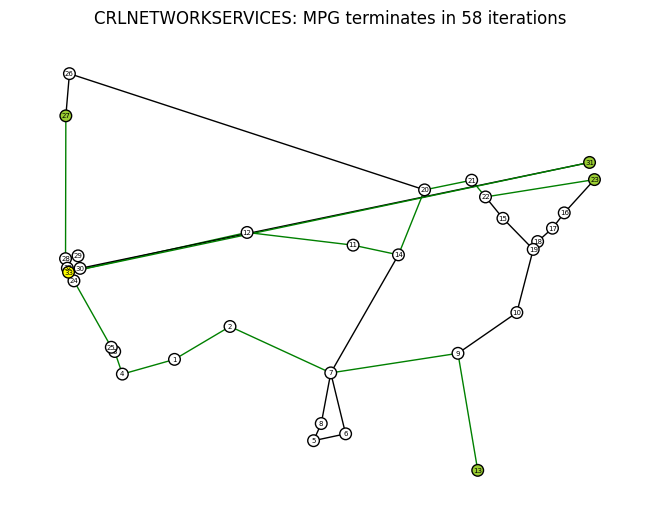



running 51: ARPANET


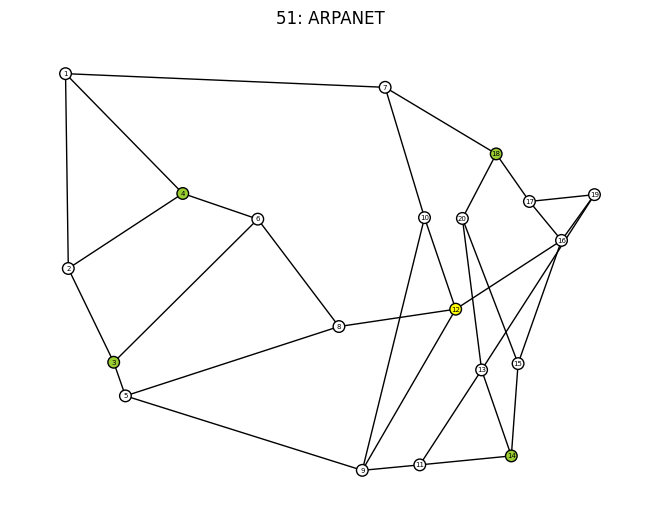

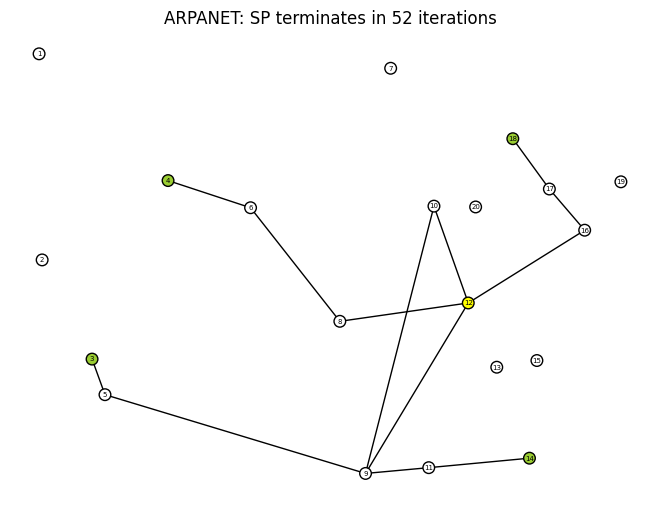

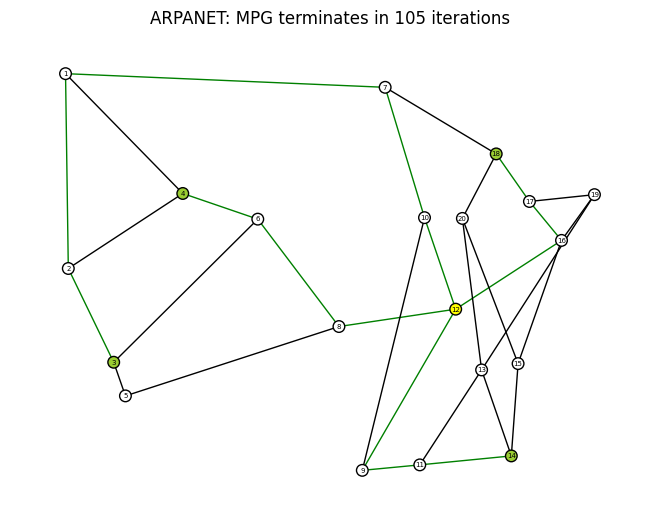



running 52: HIBERNIAGLOBAL
skip HIBERNIAGLOBAL for now


running 53: ABILENE
Graph ABILENE is problematic.


running 54: LONI


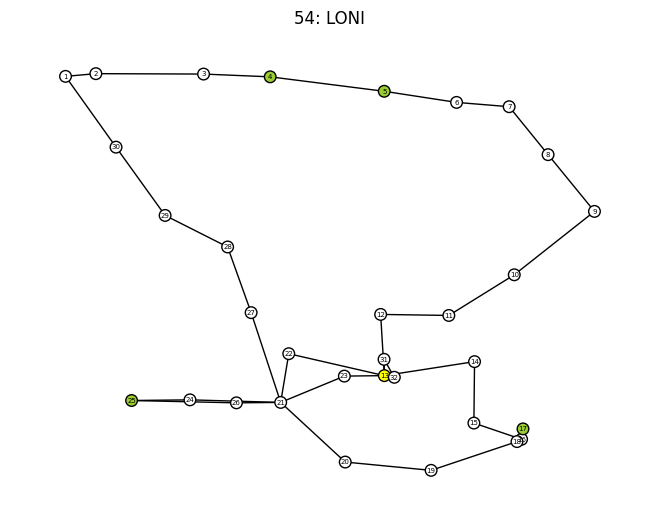

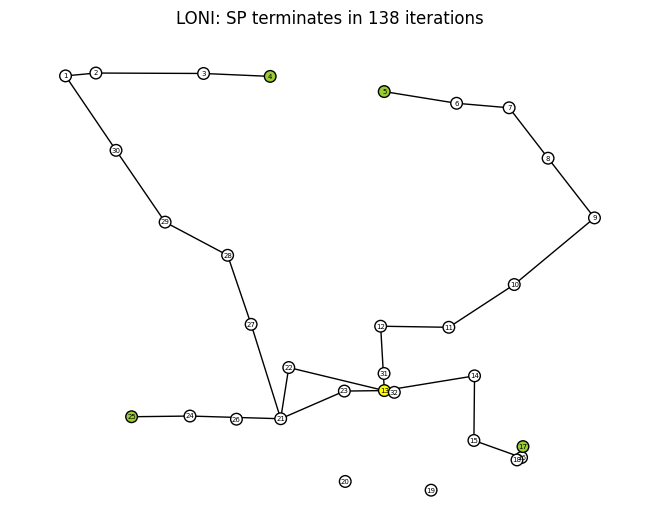

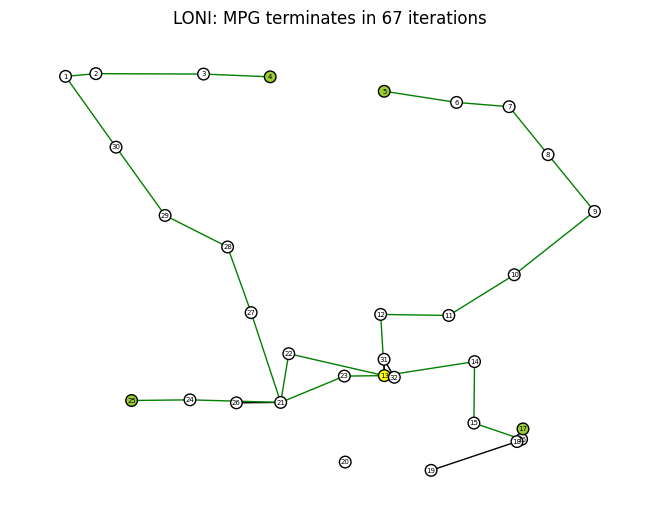



running 55: PALMETTO


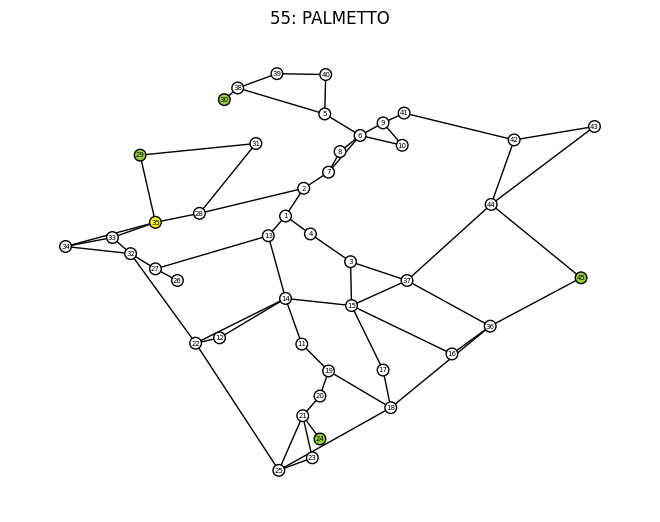

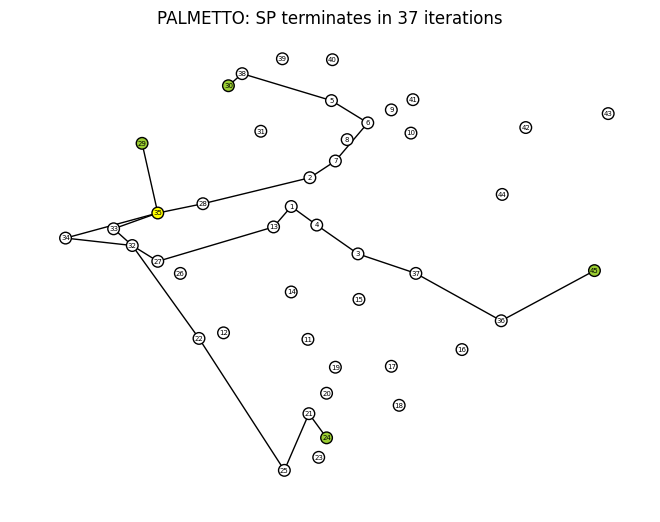

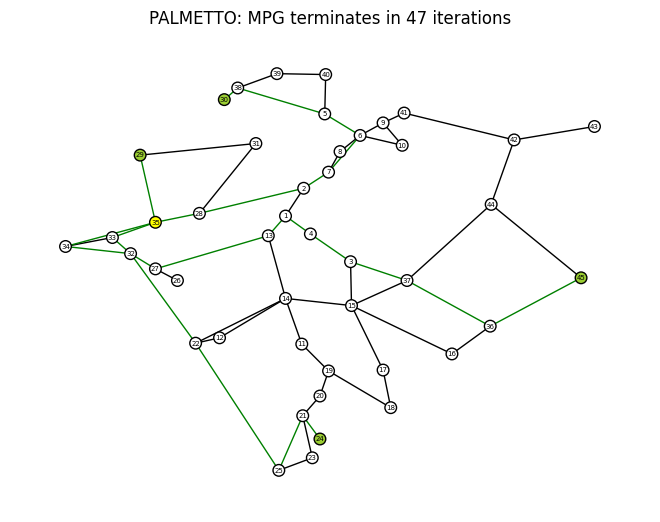



running 56: MARWAN
Graph MARWAN is problematic.


running 57: NETWORKUSA


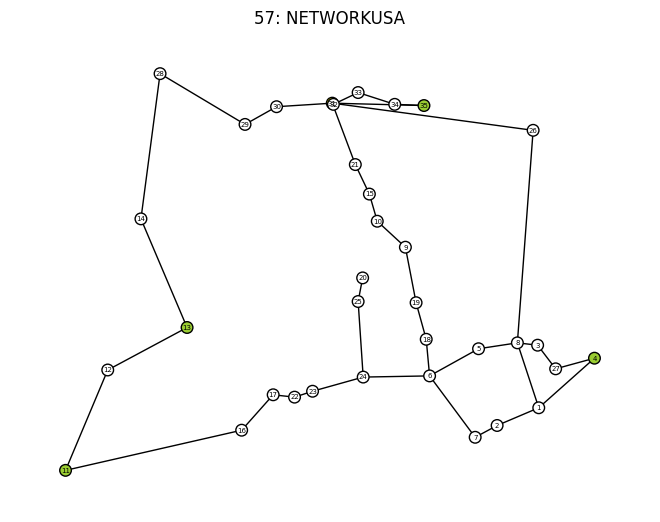

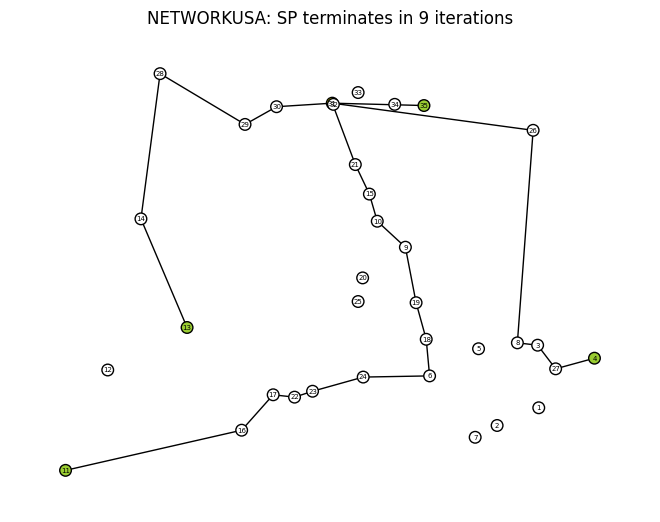

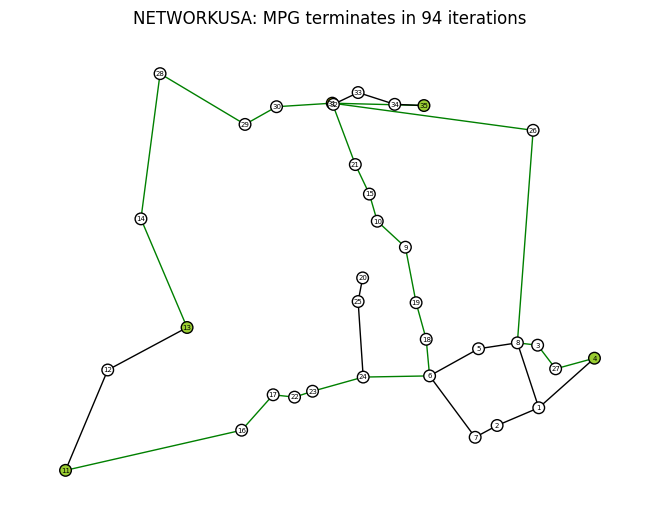



running 58: BIZNET


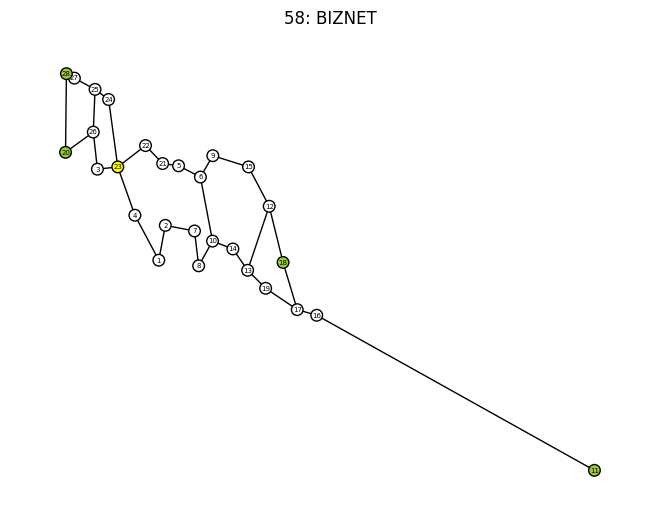

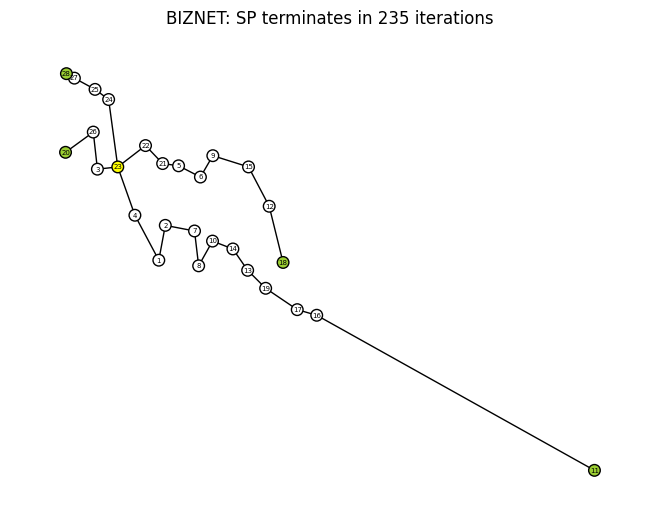

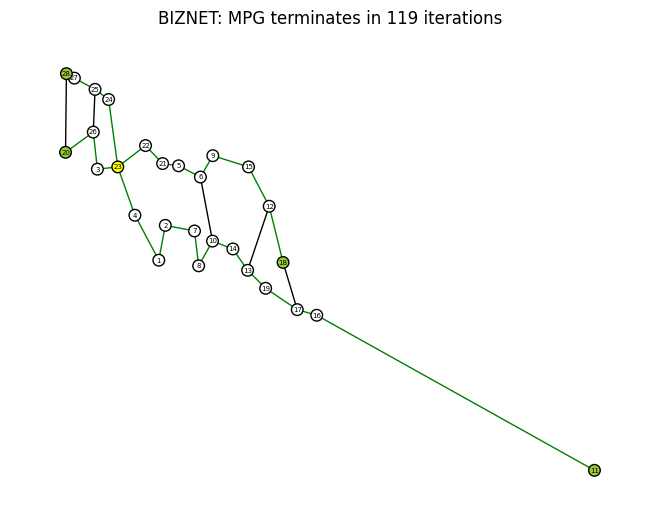



running 59: BBNPLANET
Graph BBNPLANET is problematic.


running 60: JGN2PLUS
Graph JGN2PLUS is problematic.


running 61: JANOSUS


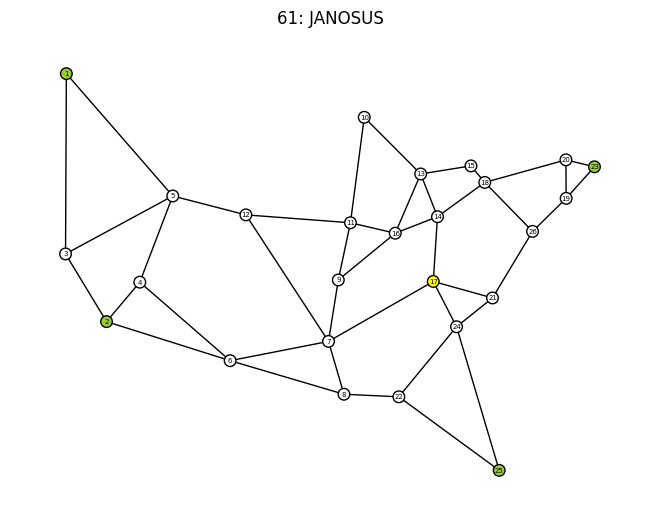

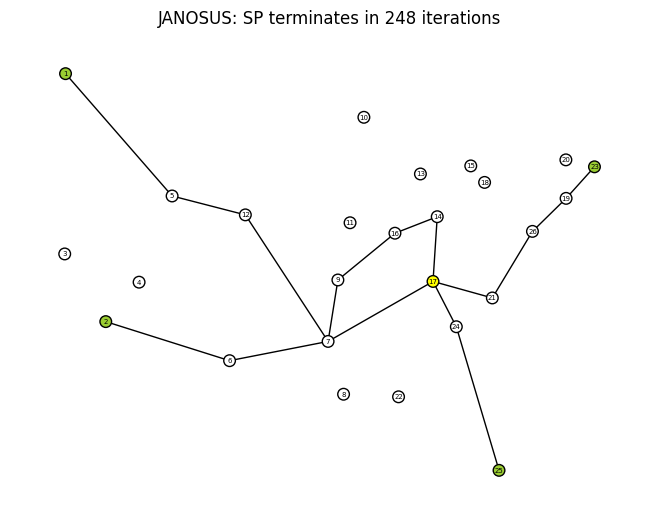

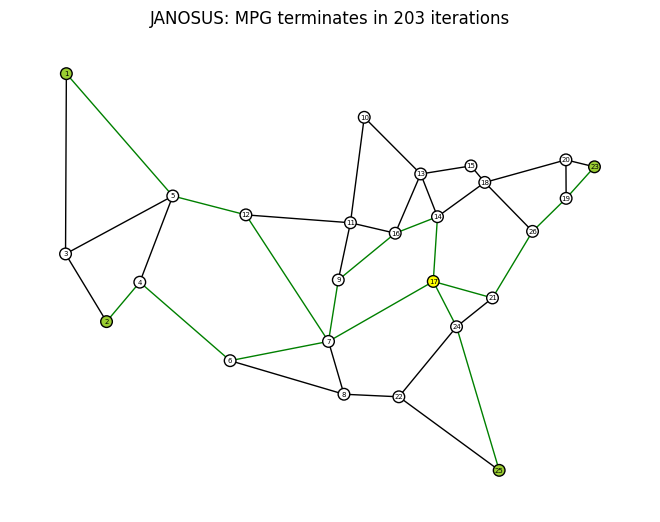



running 62: CLARANET


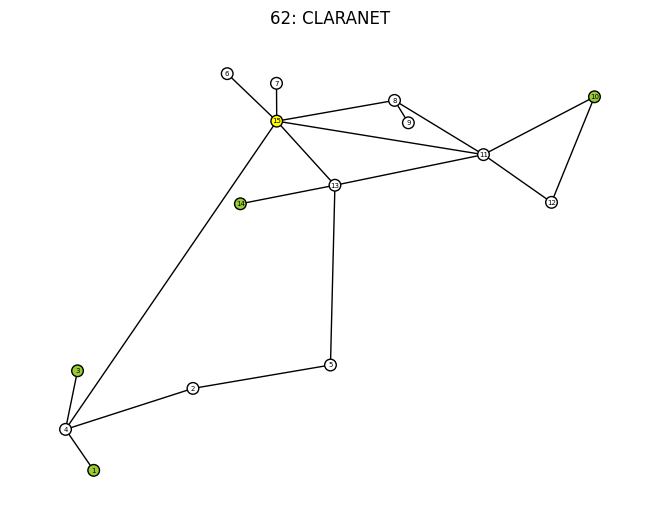

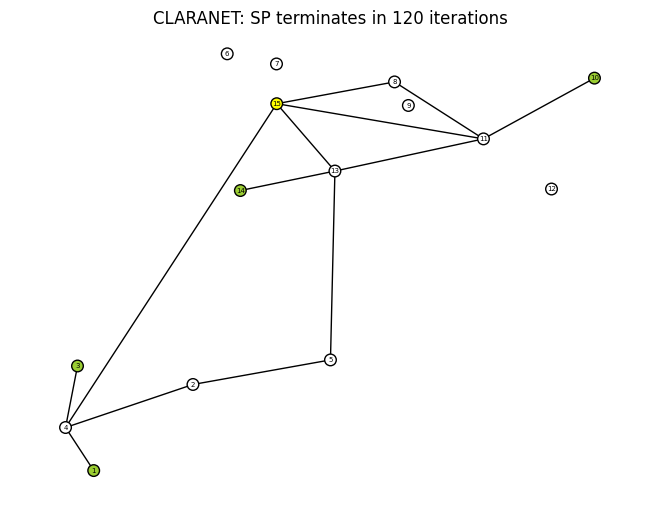

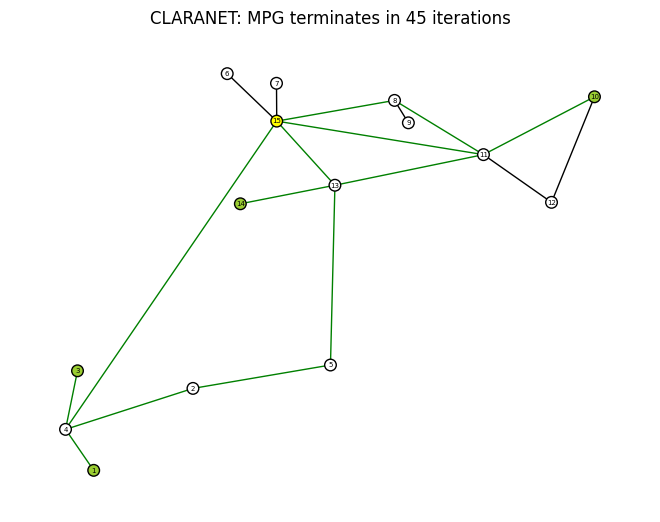



running 63: IRIS


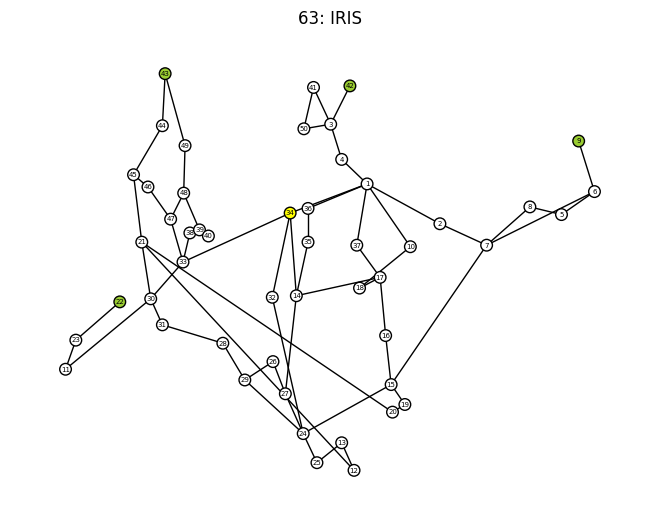

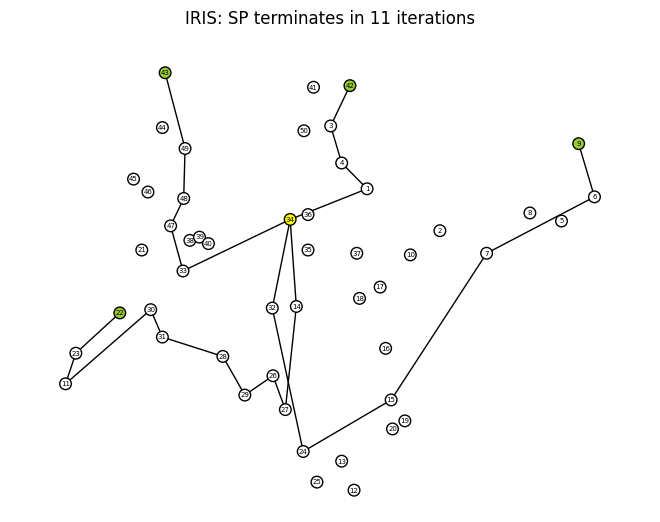

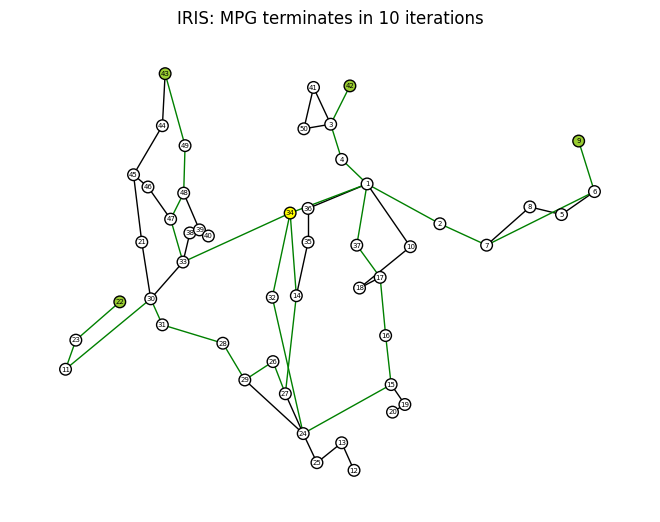



running 64: EON


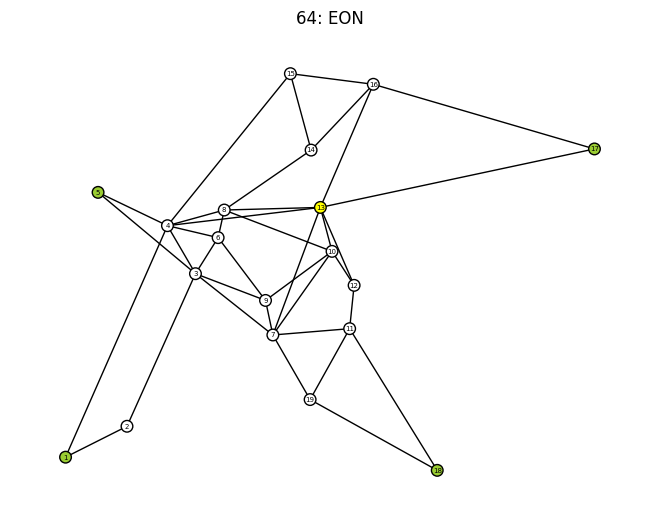

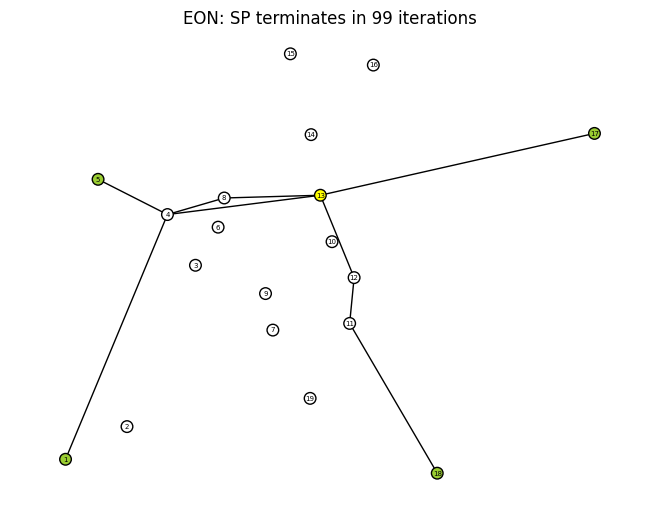

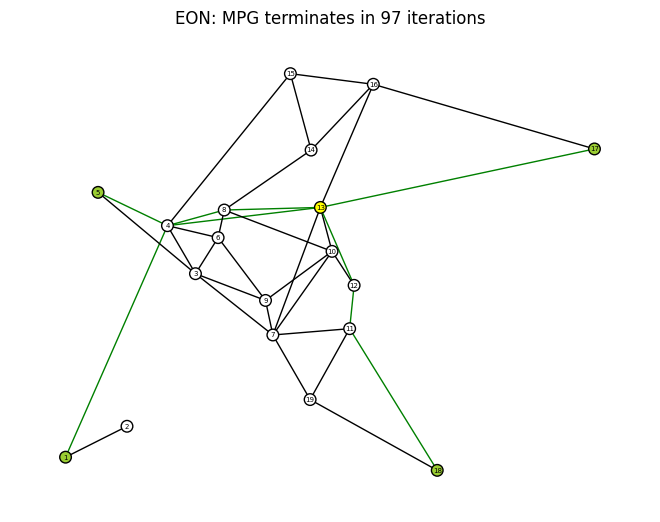



running 65: MZIMA


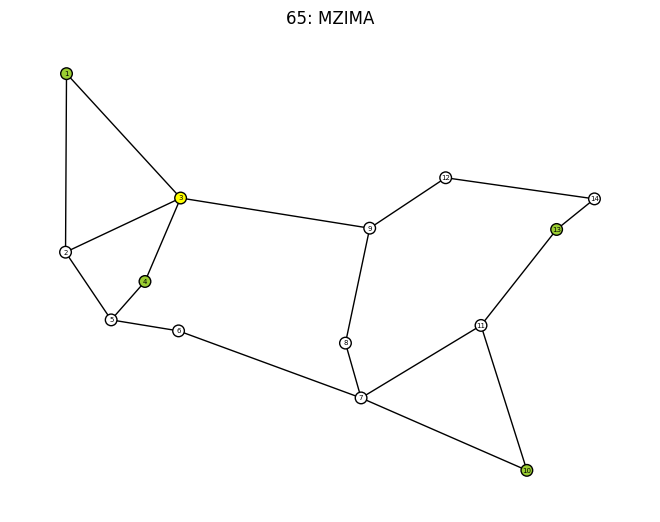

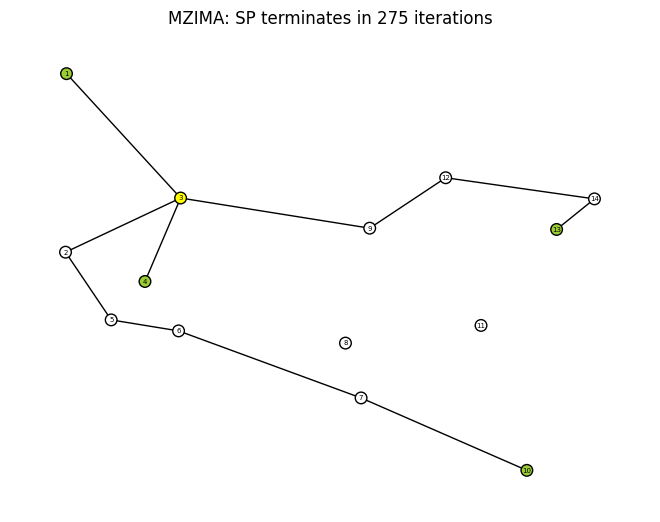

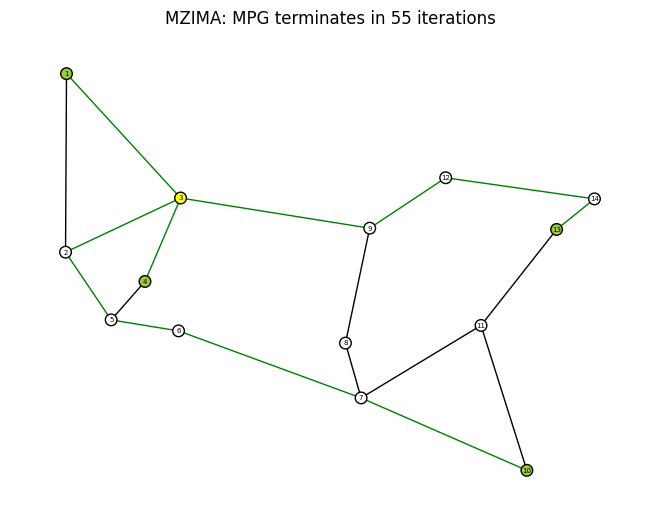



running 66: HIBERNIAIRELAND
Graph HIBERNIAIRELAND is problematic.


running 67: OPTUNETSWEDEN
skip OPTUNETSWEDEN for now


running 68: MEMOREX
skip MEMOREX for now


running 69: NEWNET
Graph NEWNET is problematic.


running 70: RENATER2010


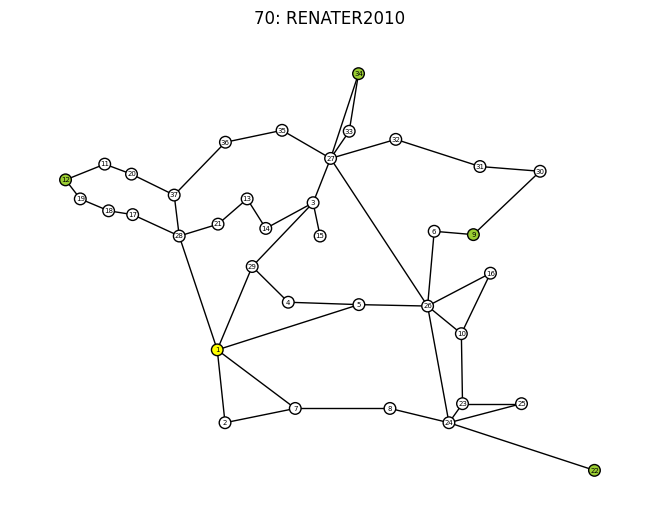

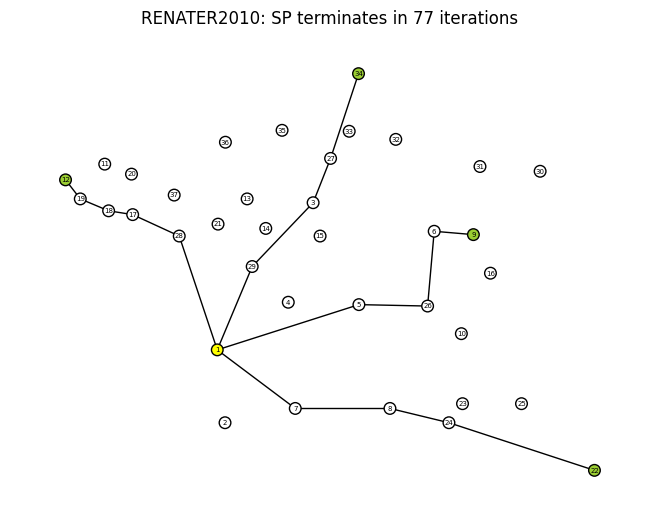

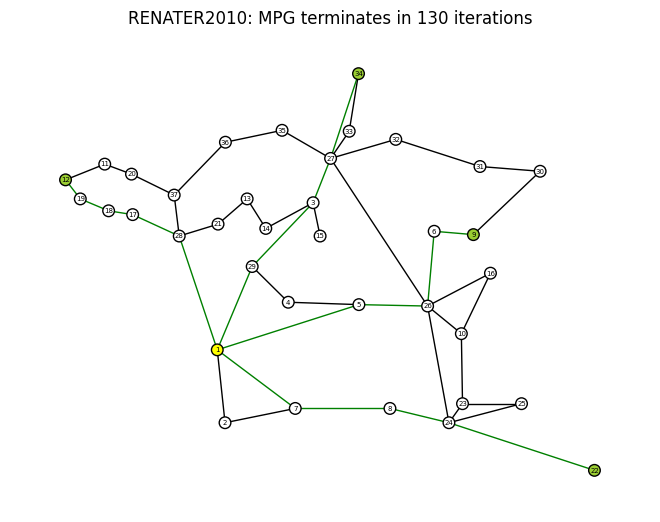



running 71: CONUS6077


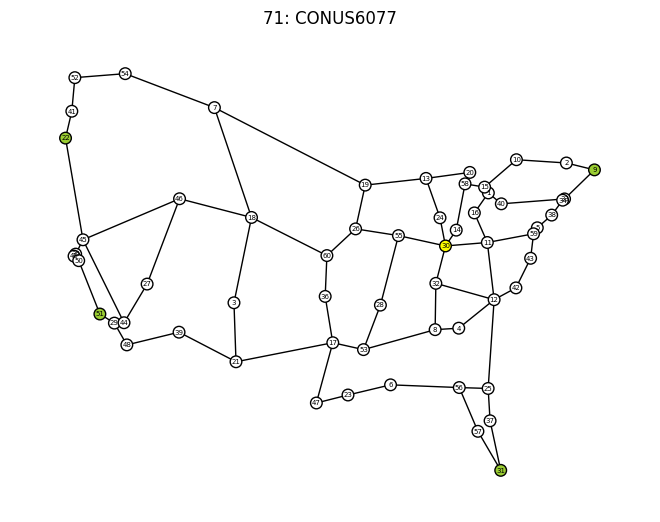

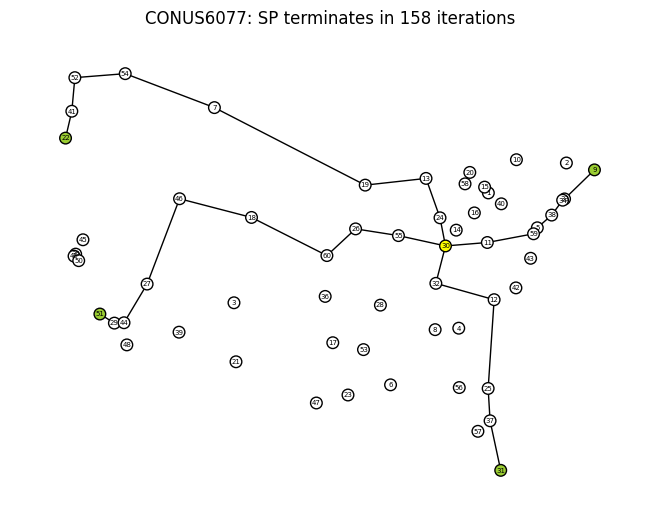

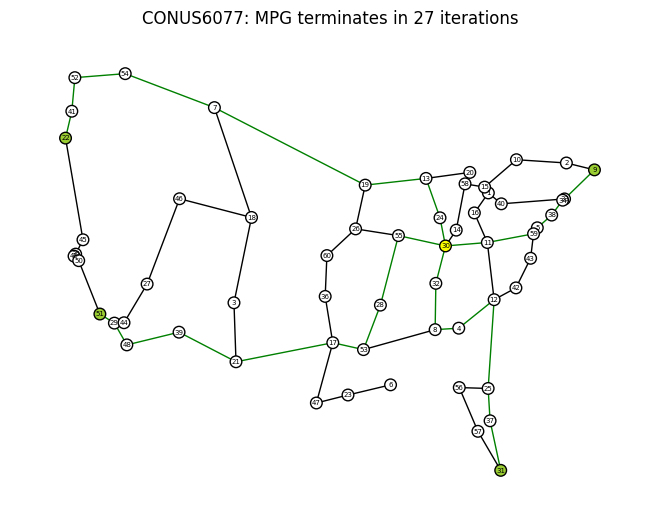



running 72: HIBERNIAUS


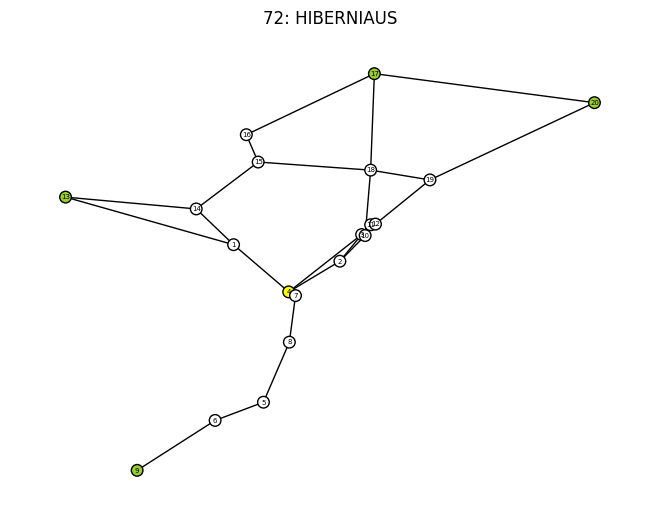

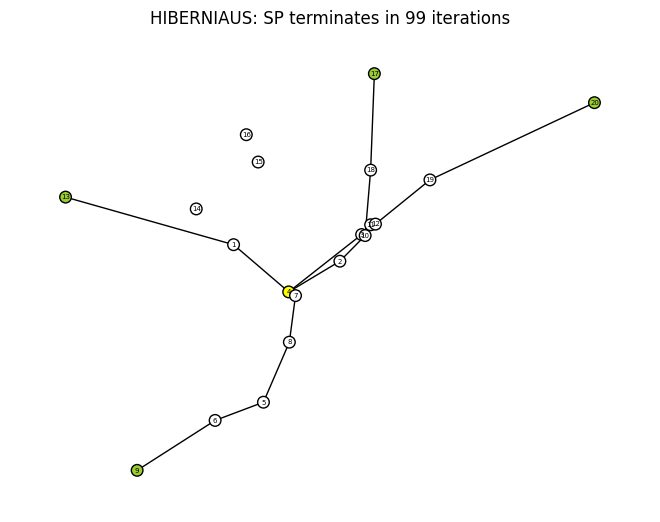

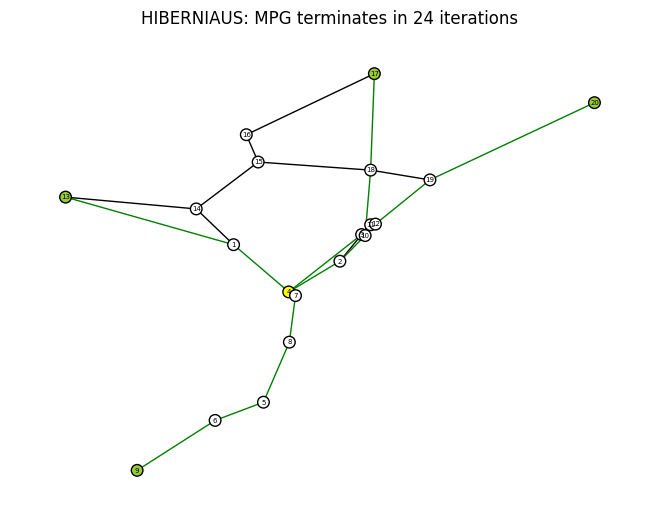



running 73: SAVVIS
Graph SAVVIS is problematic.


running 74: ISTAR
Graph ISTAR is problematic.


running 75: HIBERNIAUK
Graph HIBERNIAUK is problematic.


running 76: KAREN


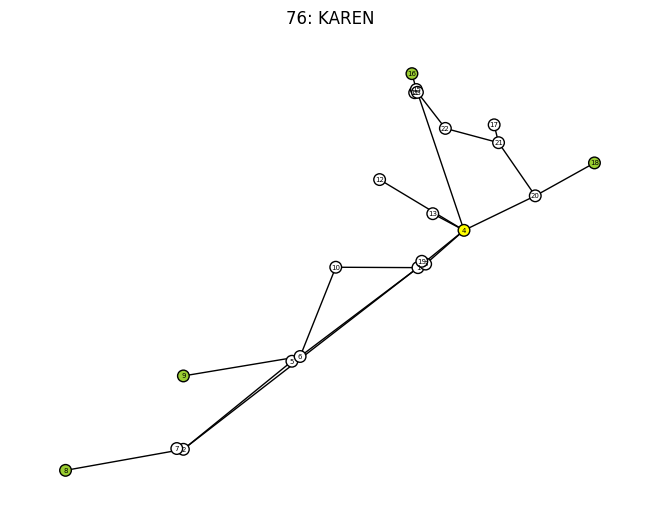

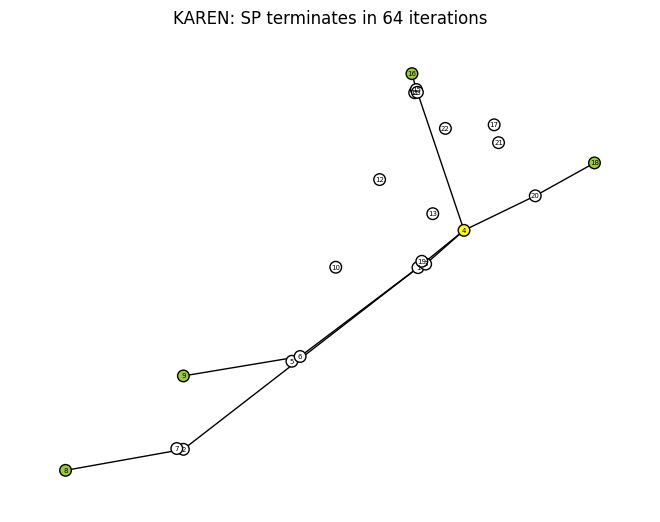

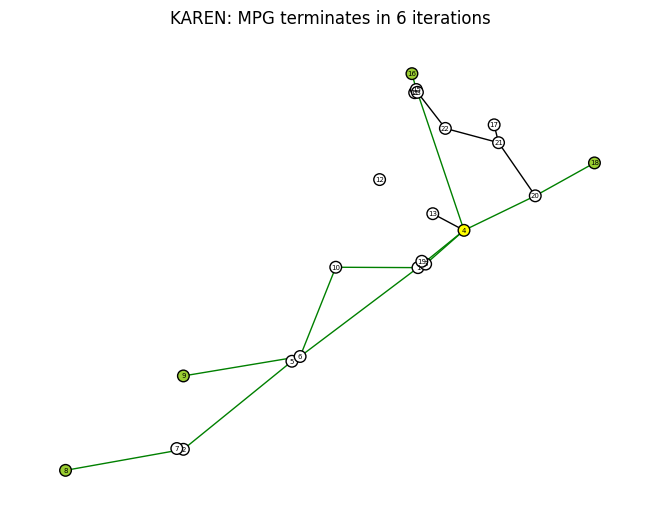



running 77: METRONA
skip METRONA for now


running 78: TELECOMSERBIA
Graph TELECOMSERBIA is problematic.


running 79: JPN25


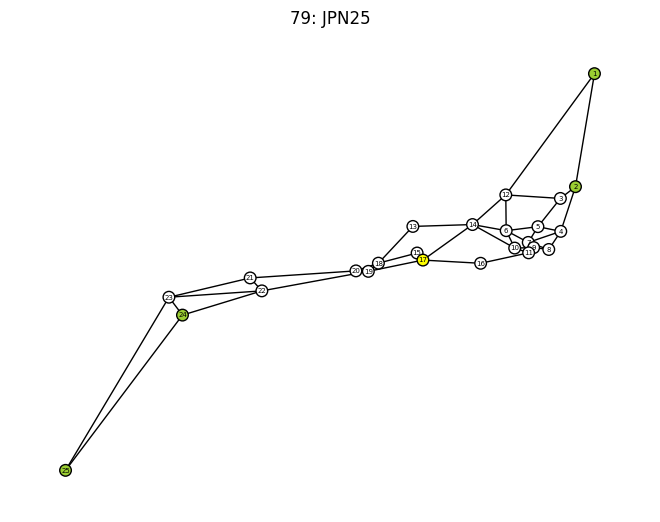

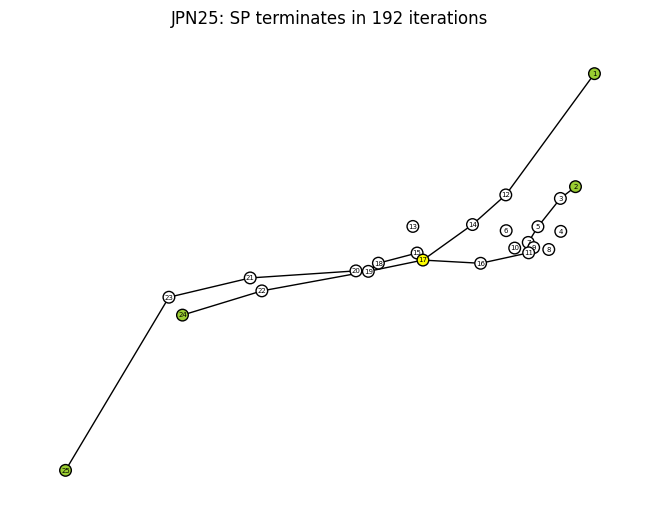

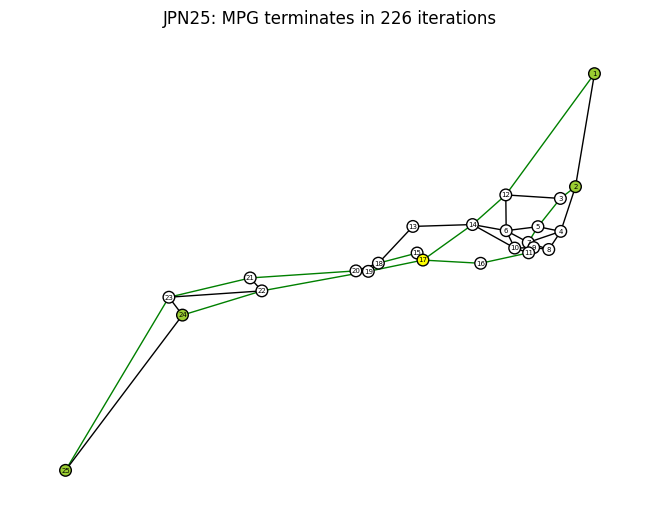



running 80: PSINET
Graph PSINET is problematic.


running 81: CONUS30


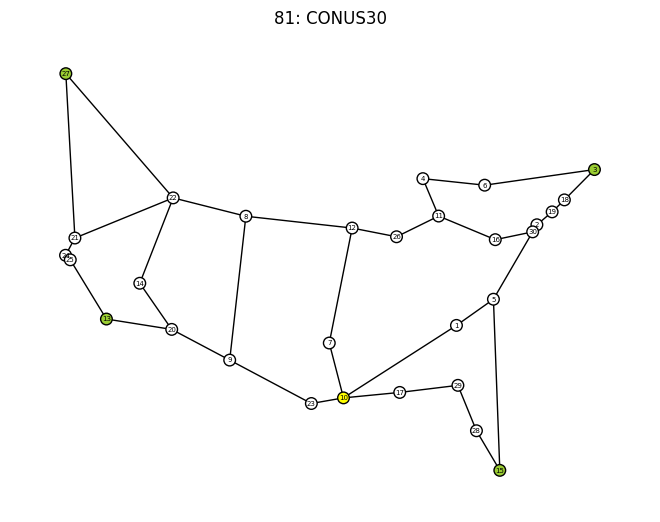

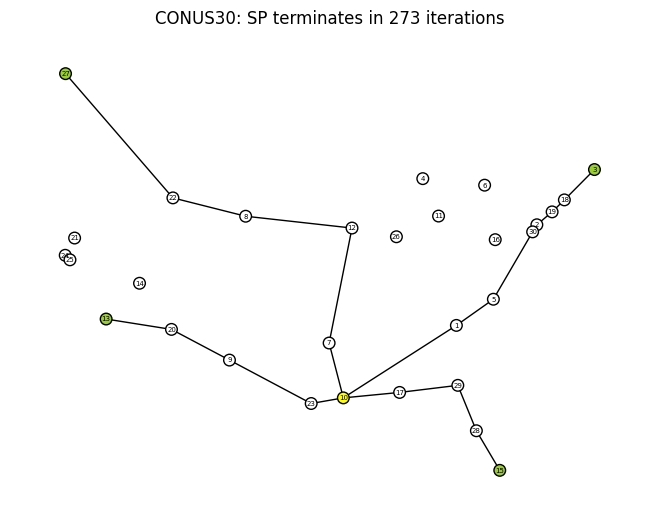

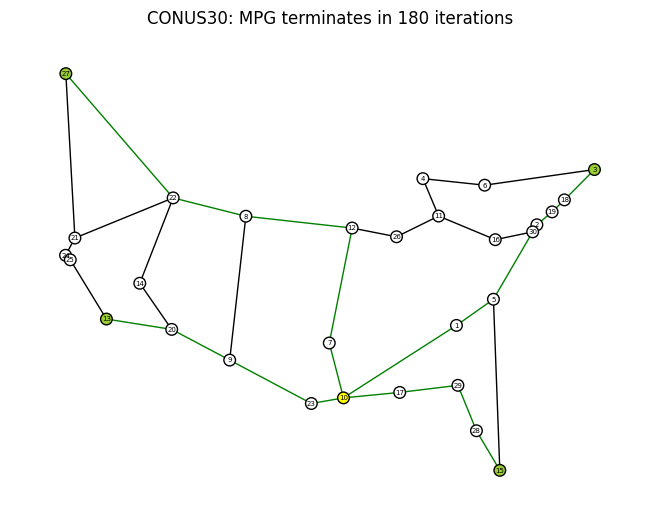



running 82: NOBELGERMANY


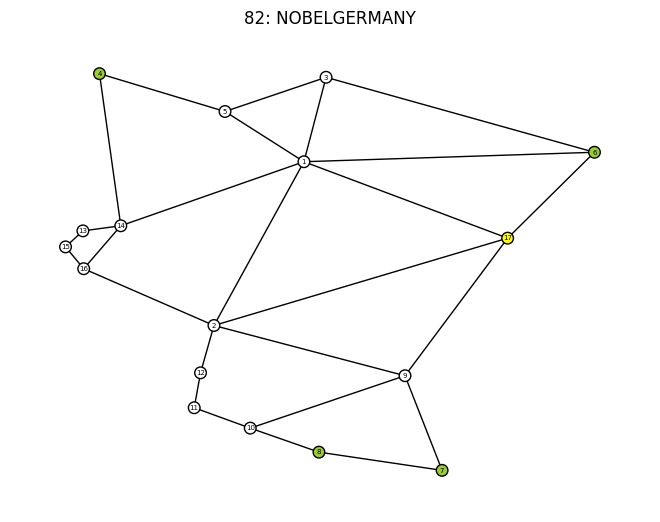

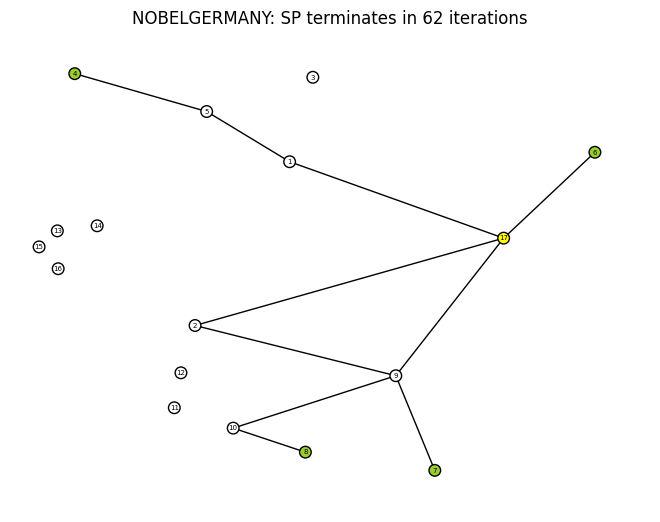

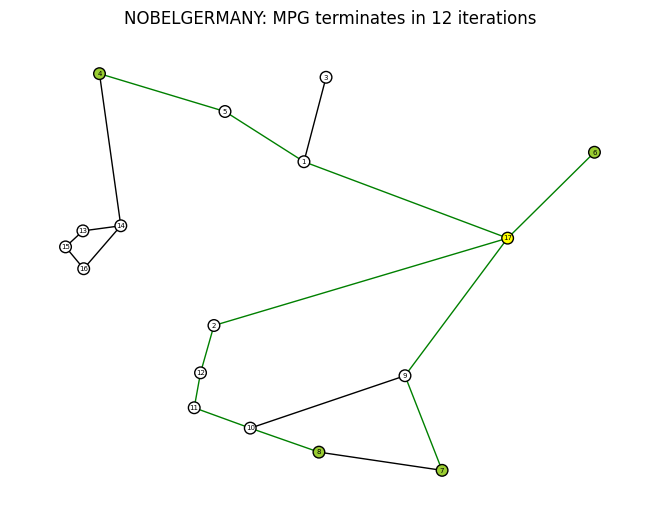



running 83: GAMBIA


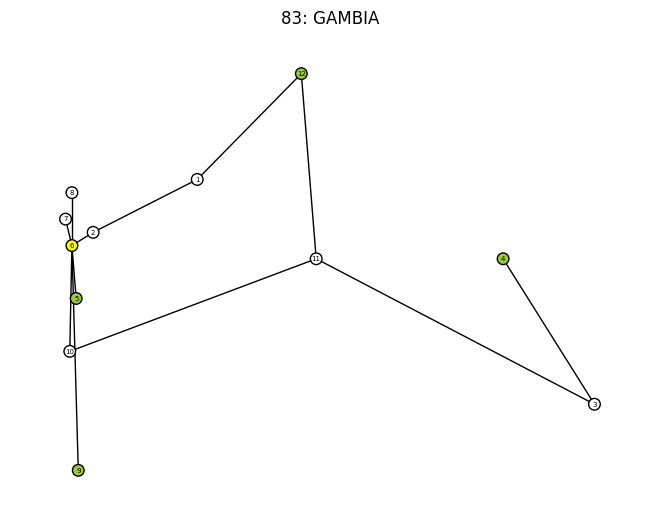

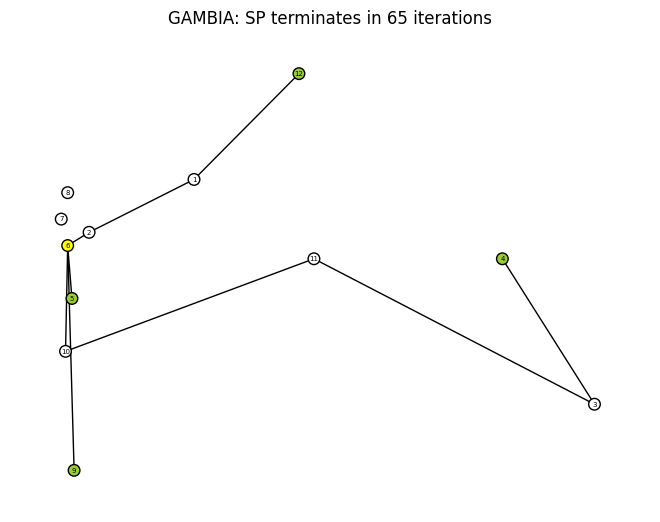

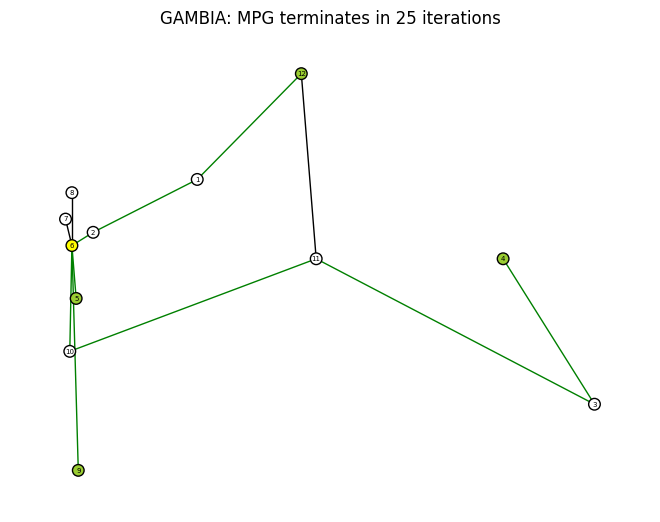



running 84: NOBELUS


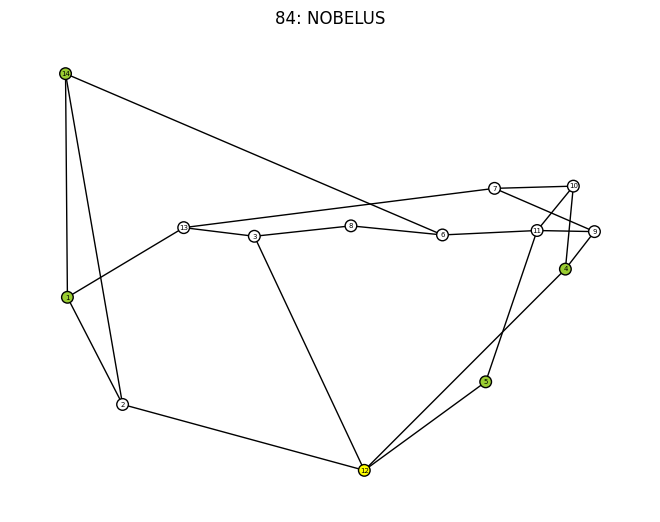

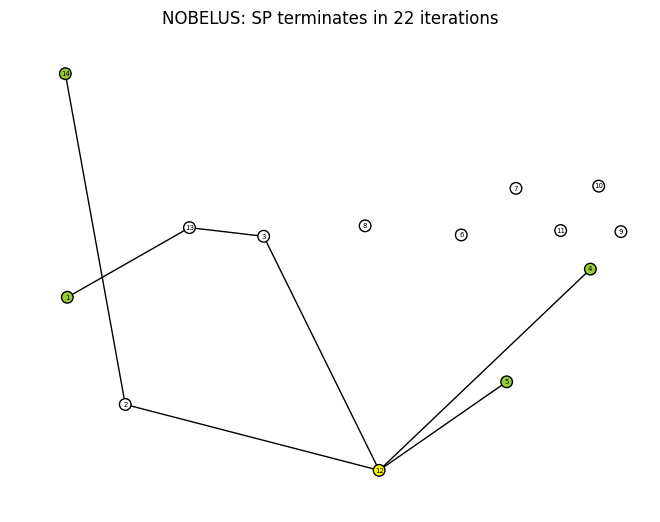

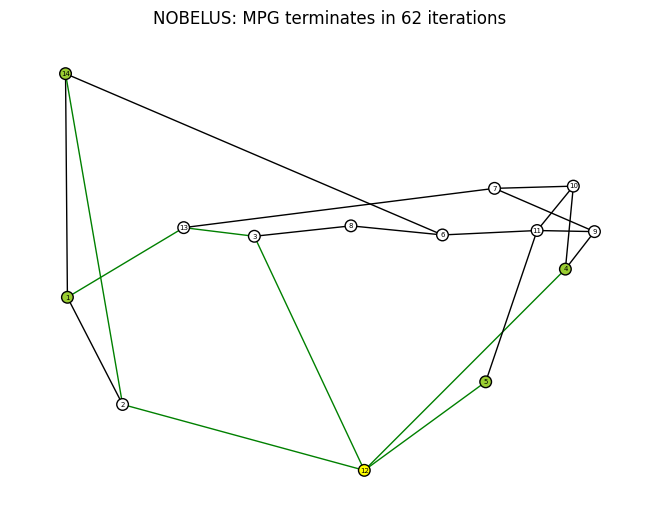



running 85: LAMBDARAIL
Graph LAMBDARAIL is problematic.


running 86: SPIRALIGHT


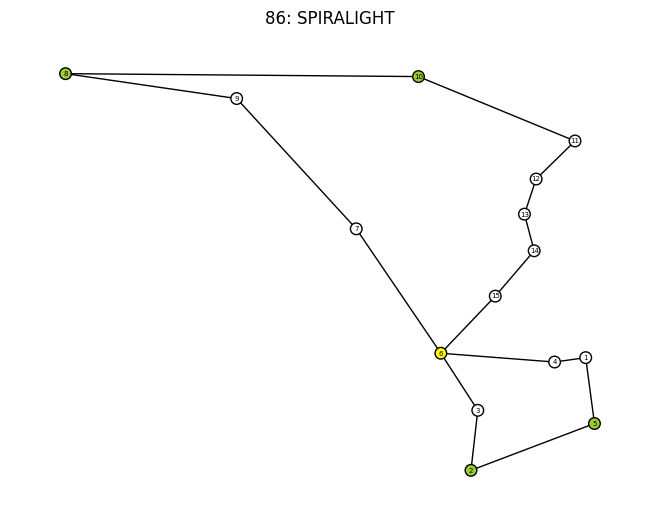

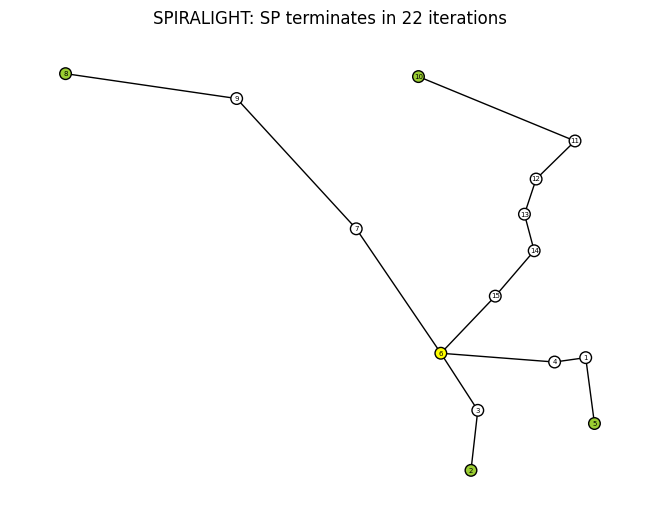

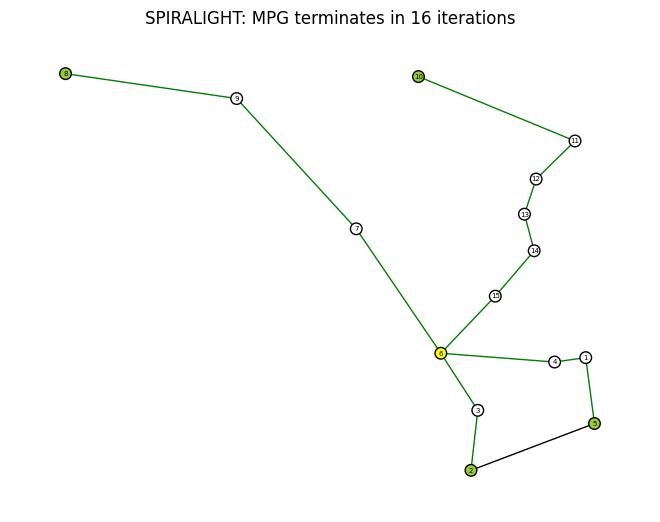



running 87: RNPBRAZIL
Graph RNPBRAZIL is problematic.


running 88: GRNET


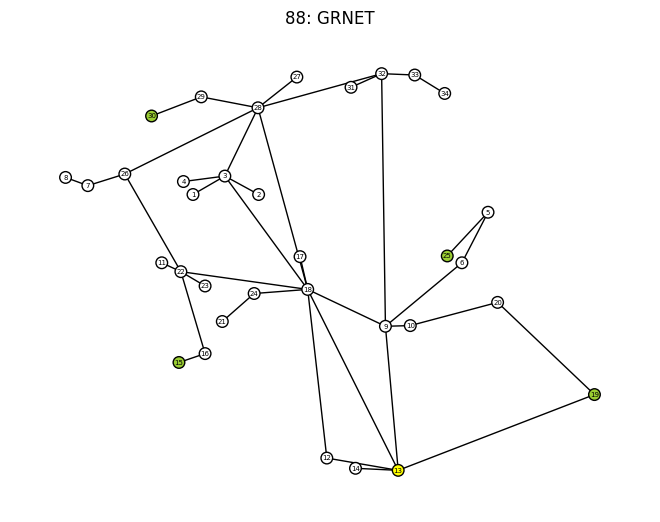

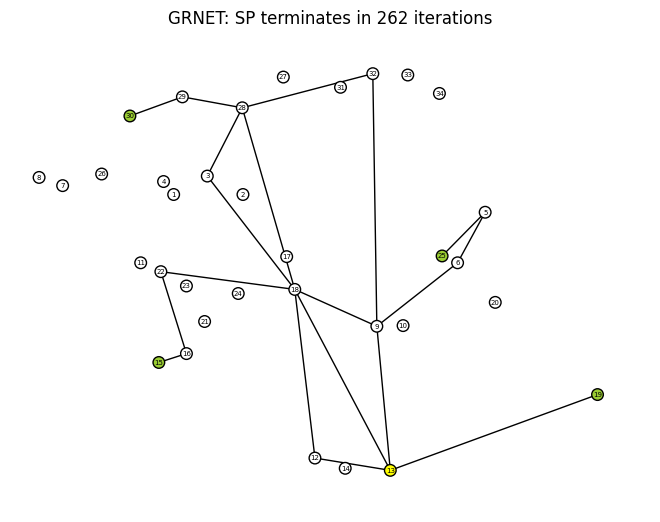

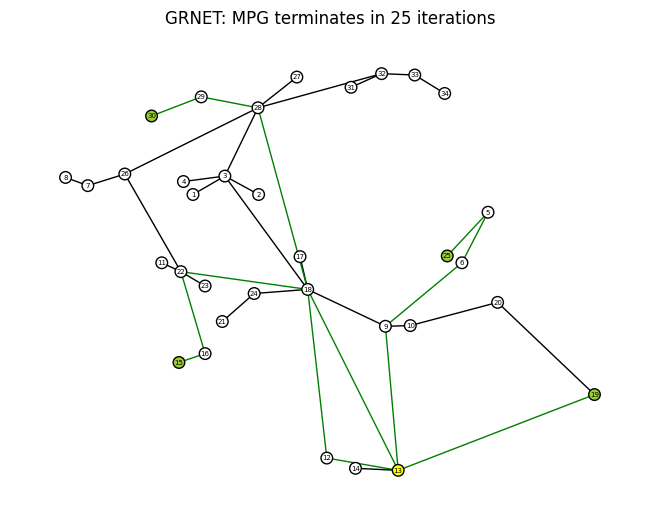



running 89: IBM


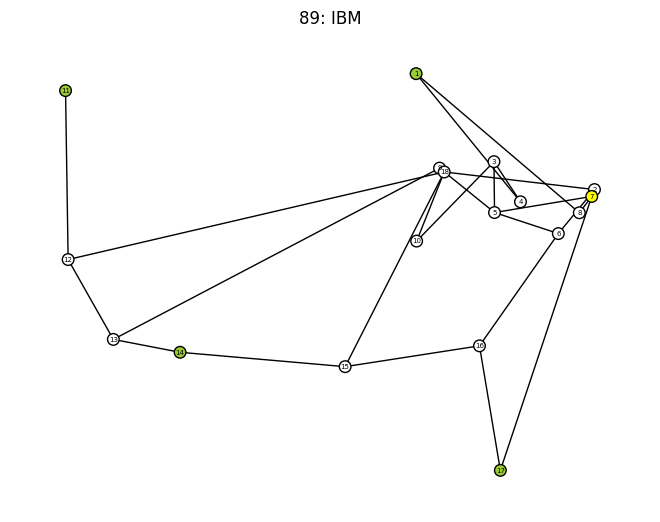

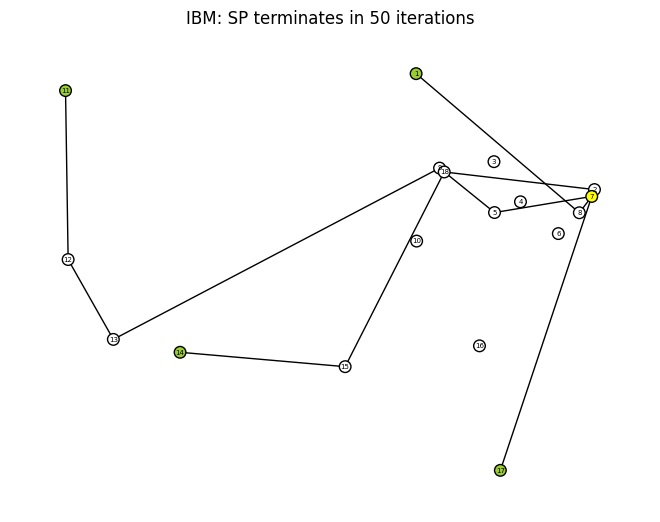

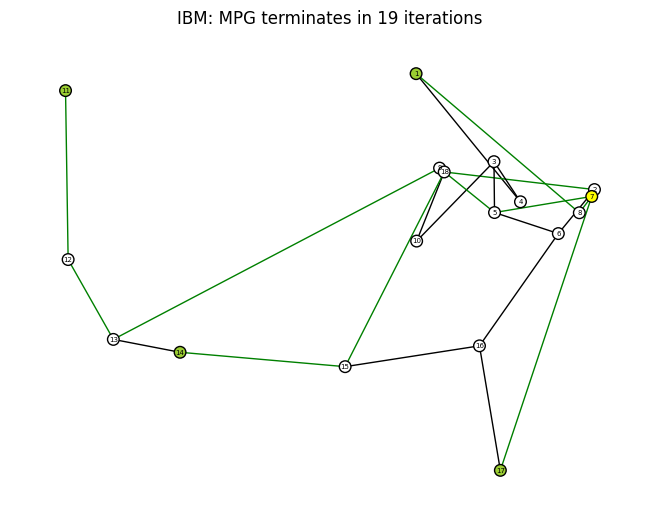



running 90: PACKETEXCHANGE
skip PACKETEXCHANGE for now


running 91: HIBERNIACANADA
Graph HIBERNIACANADA is problematic.


running 92: RAILTELINDIA


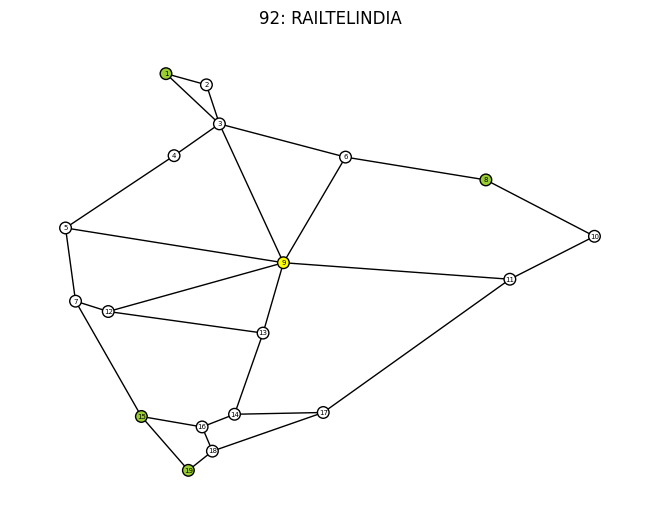

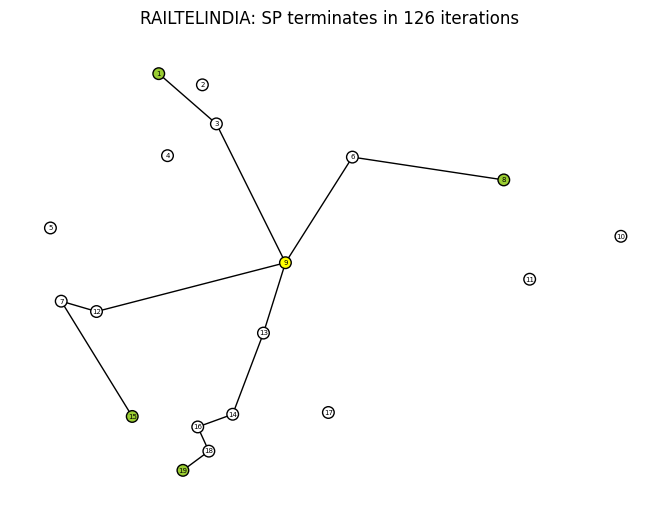

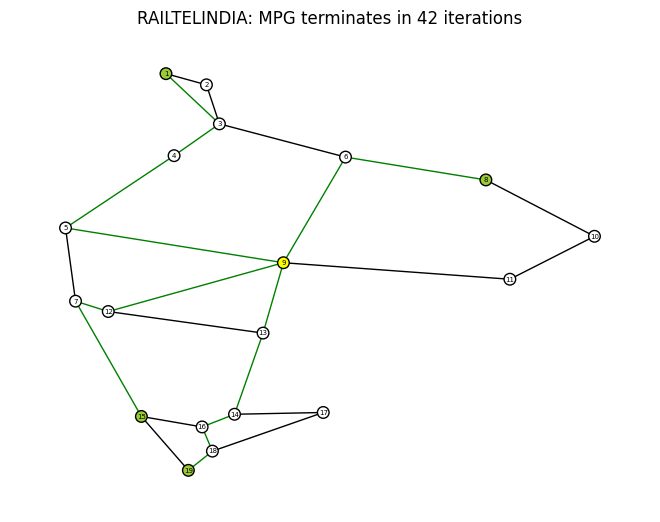



running 93: CORONET


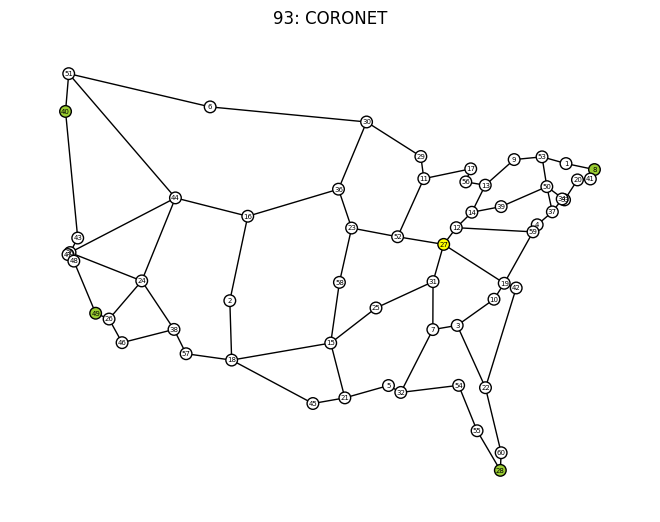

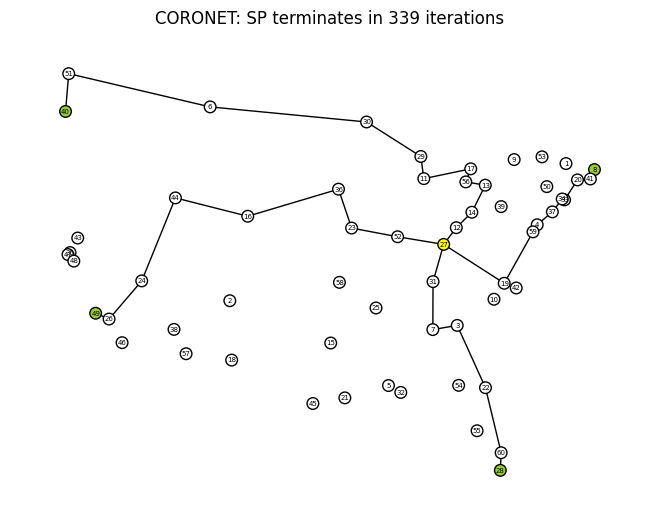

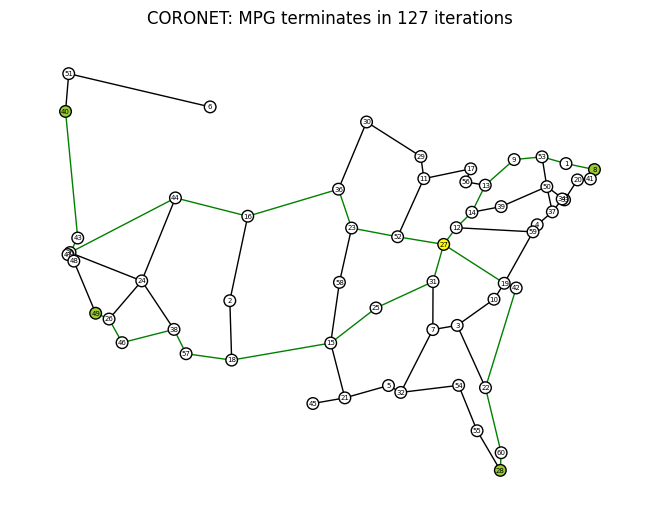



running 94: CERNET


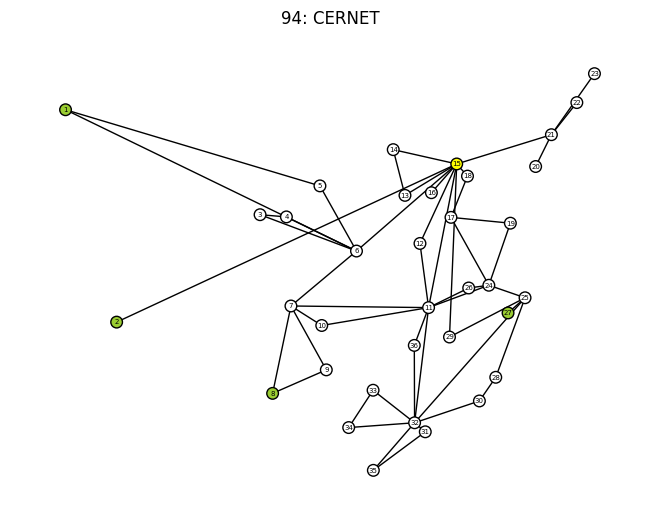

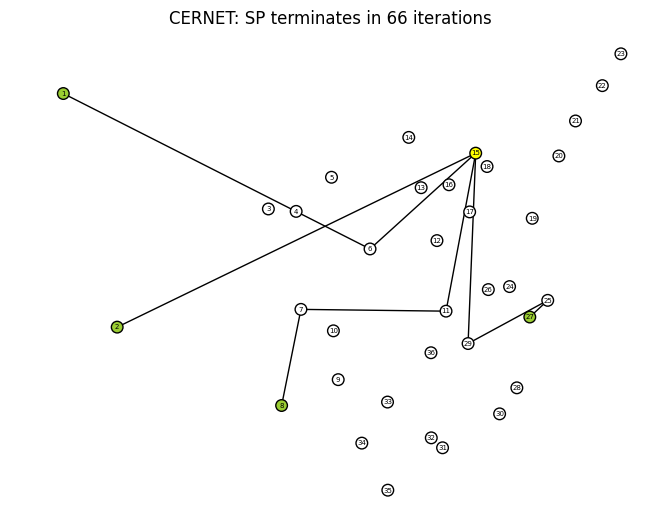

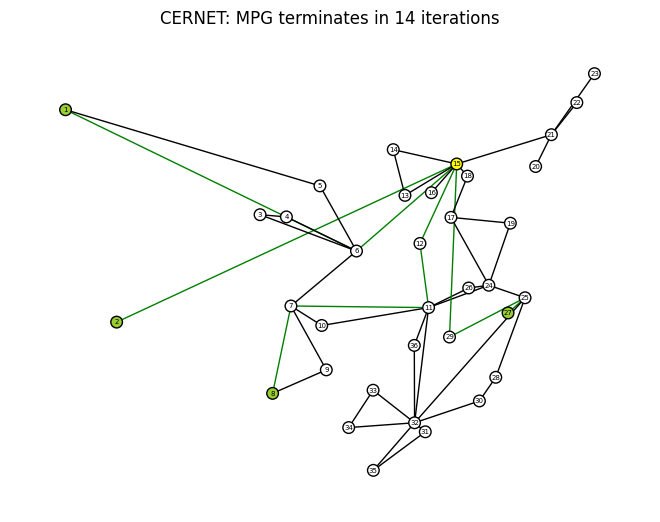



running 95: PIONIER


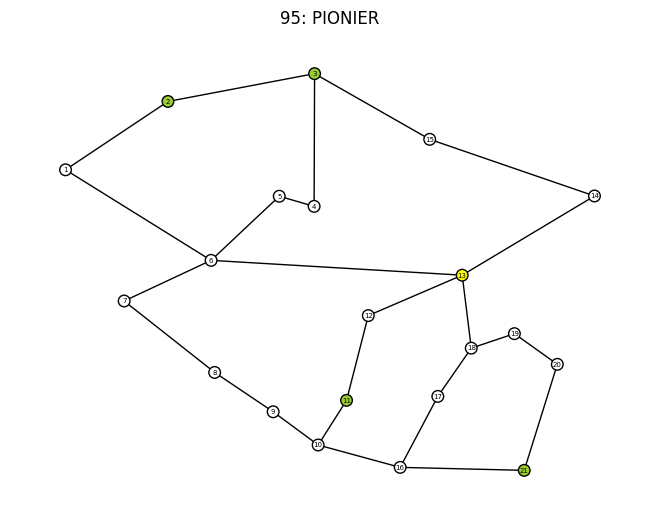

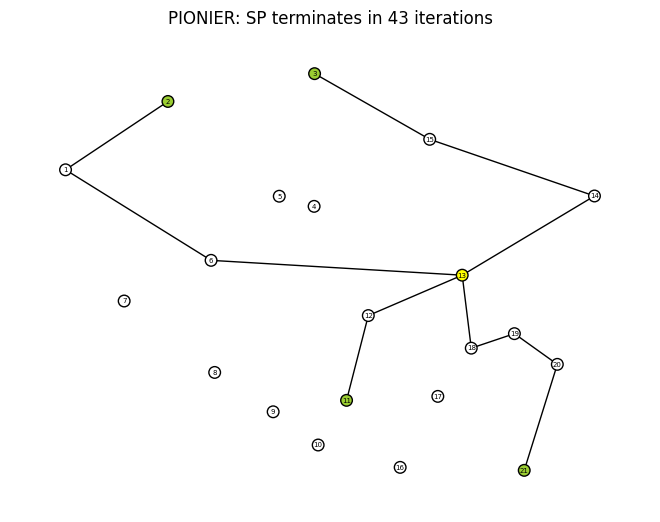

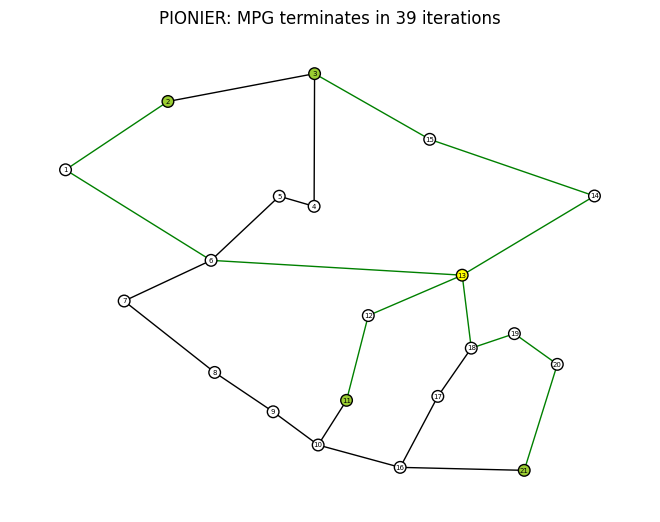



running 96: GEANT


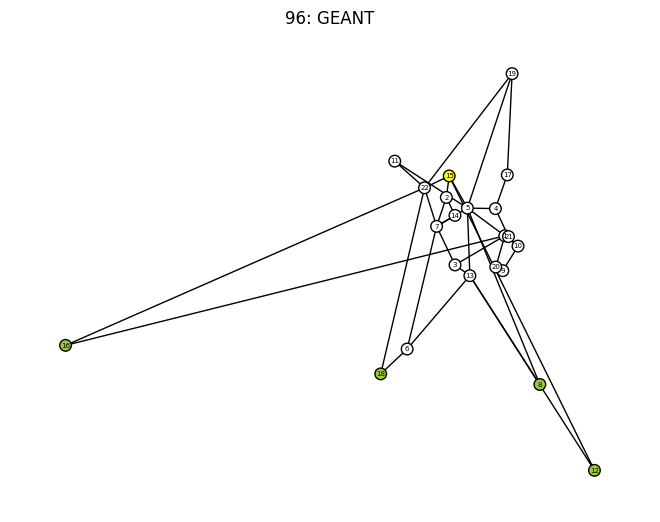

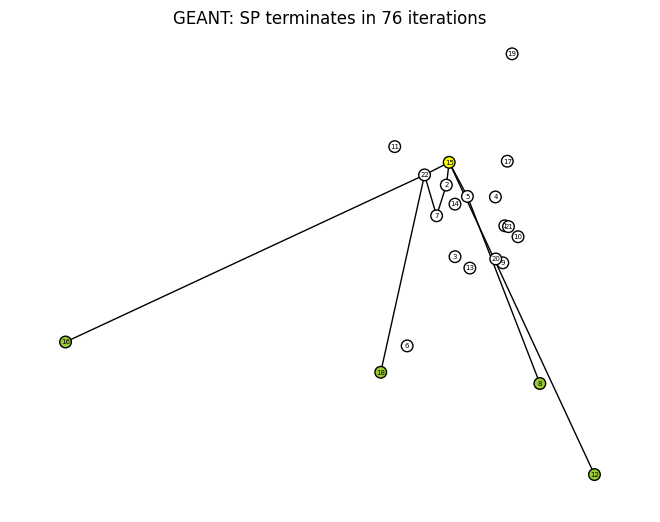

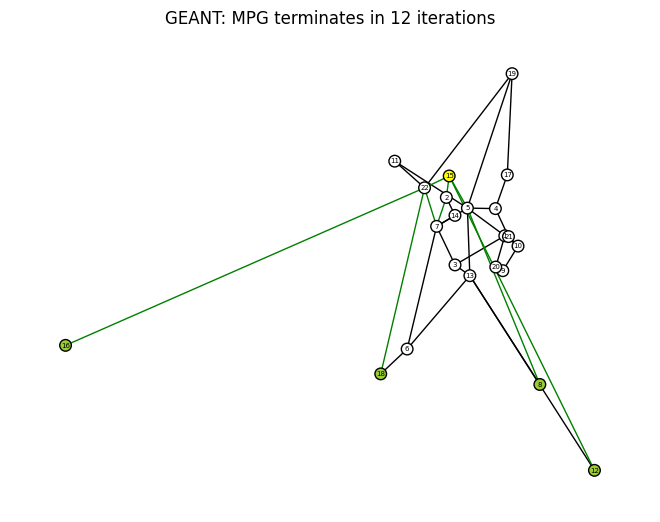



running 97: ELIBACKBONE


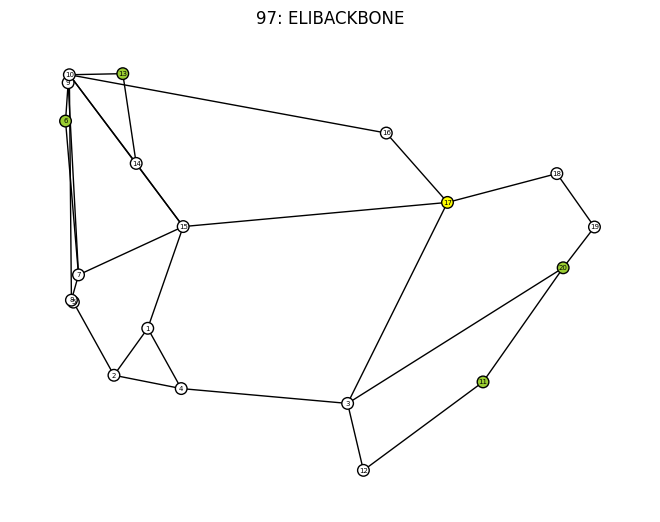

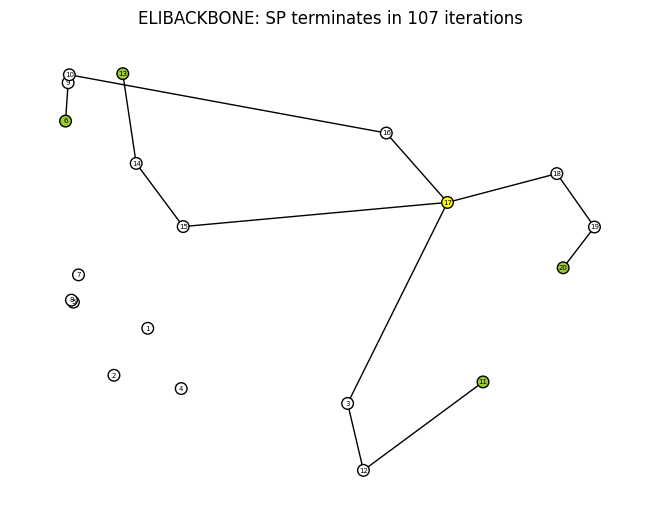

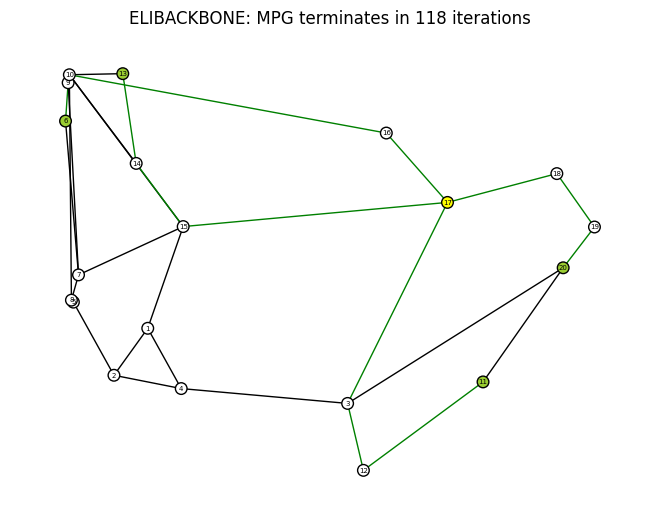



running 98: NOEL


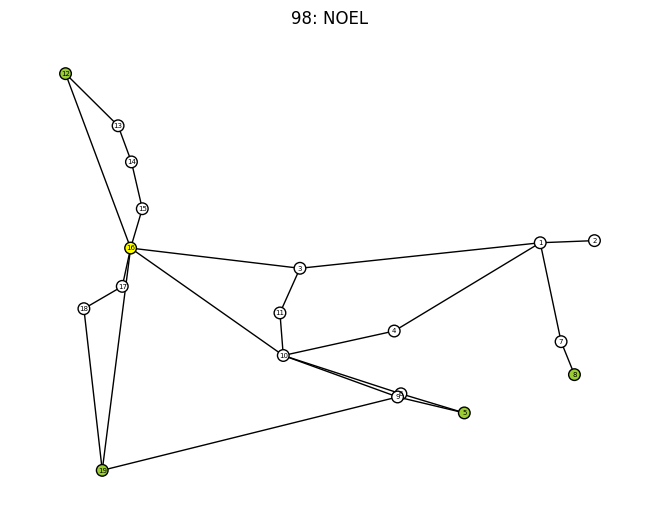

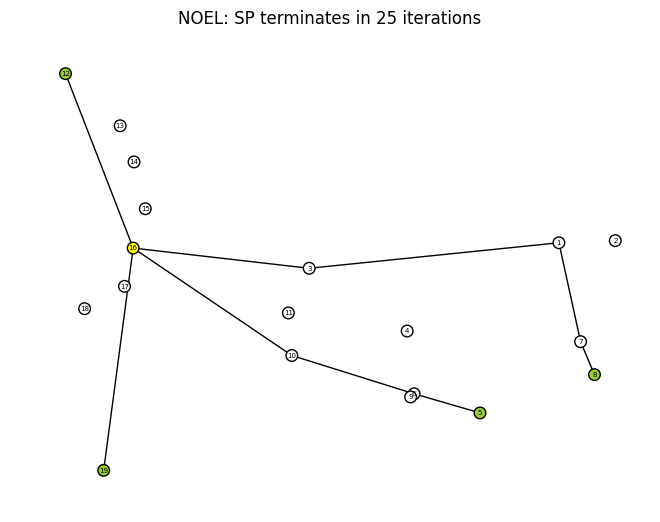

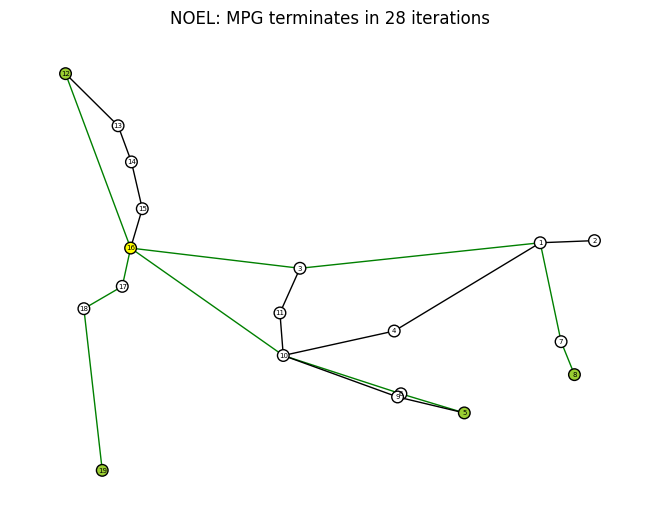



running 99: DARKSTRAND
Graph DARKSTRAND is problematic.


running 100: POLSKA


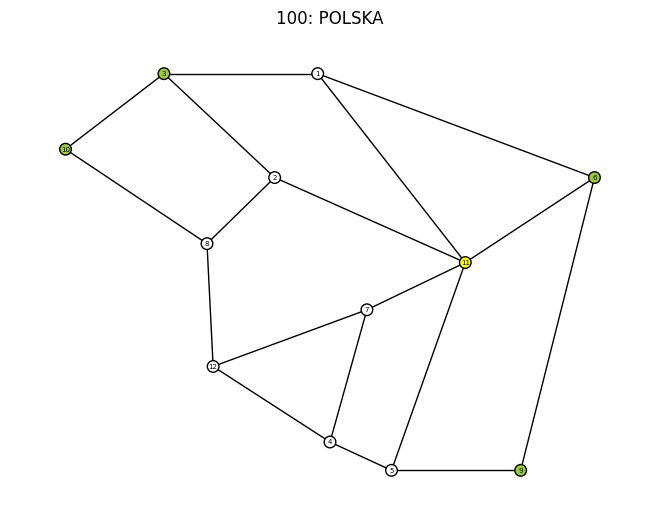

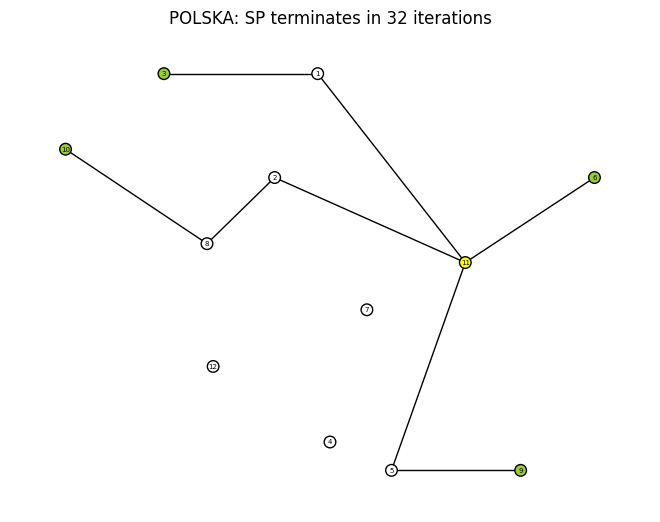

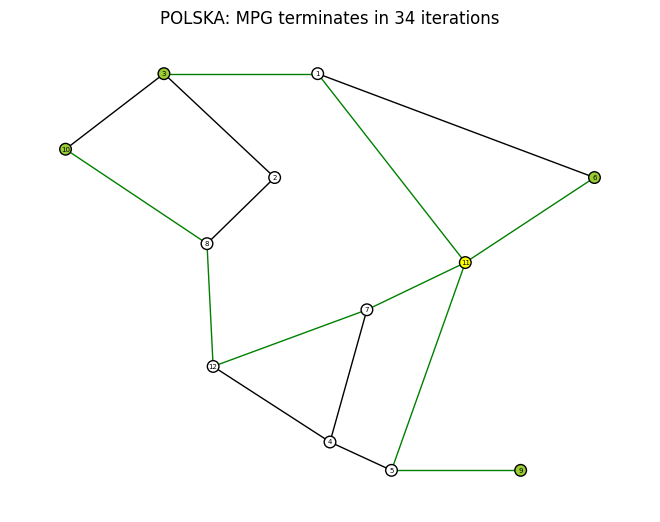



running 101: NOBELEU


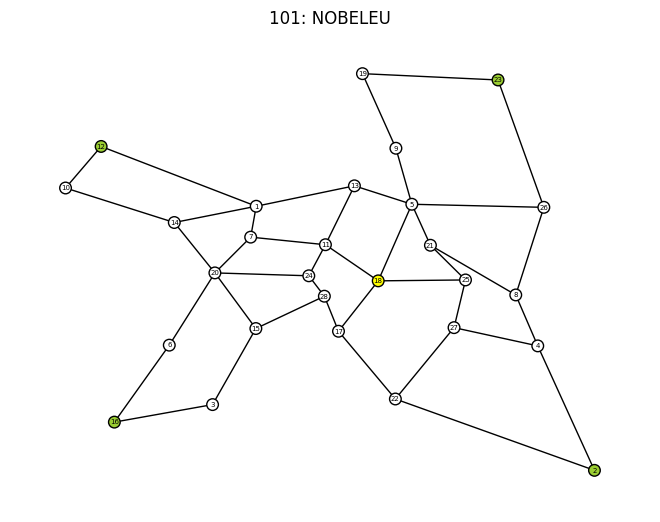

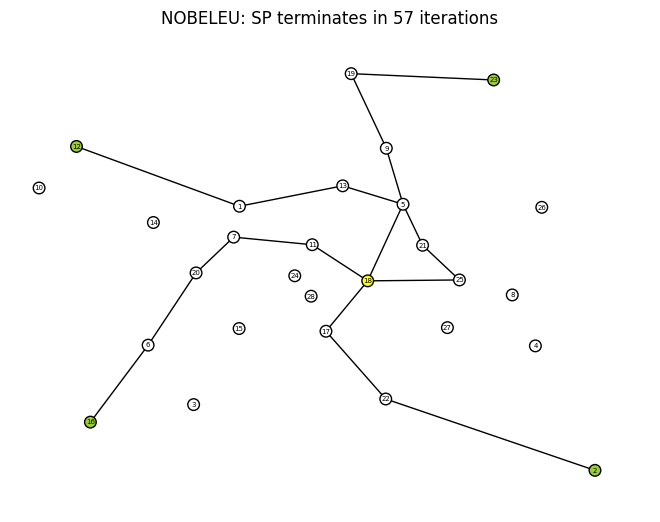

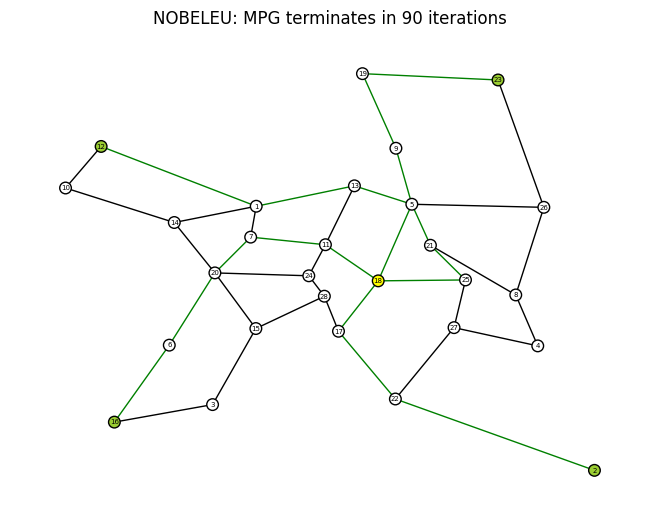



running 102: GETNET


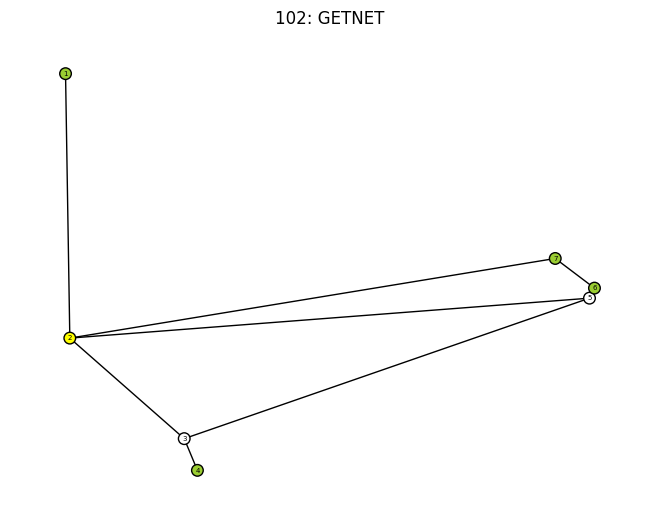

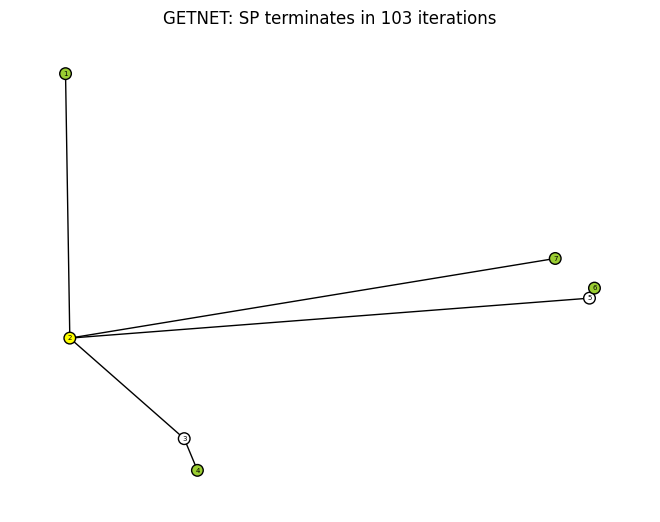

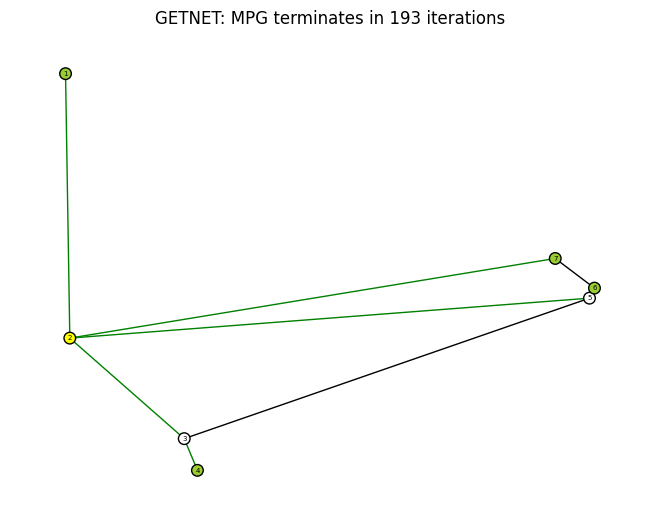



running 103: GBLNET
Graph GBLNET is problematic.


running 104: PIONIERL3


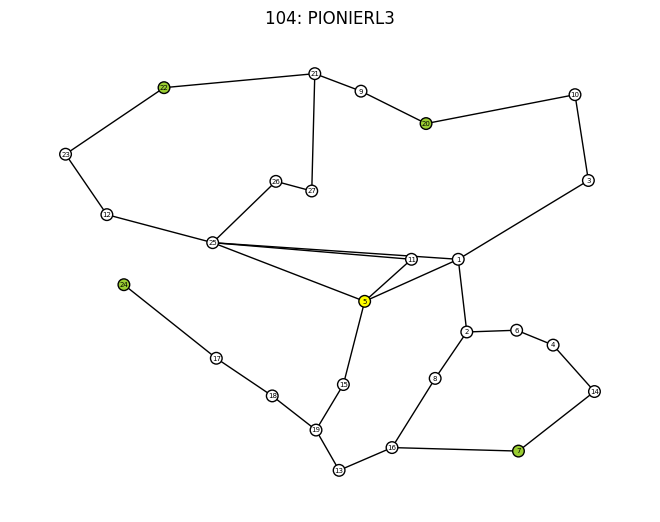

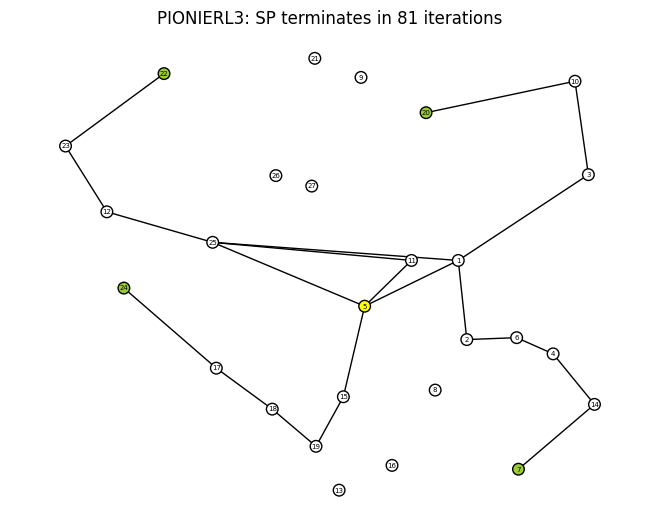

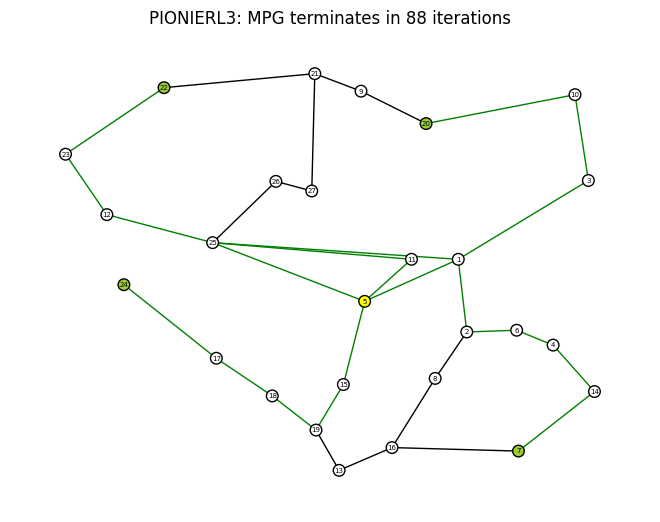

fin


In [227]:
real_topo_users = {}
real_topo_colors = {}
real_topo_colors_no_cent = {}

# results from "findusers" command
real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}

for i in range(len(real_topo)):

    print(f'\n\nrunning {str(i)}: {file_names[i]}')

    if i in bad_indices:
         print(f'Graph {file_names[i]} is problematic.')
         continue
    if i in temp_filter:
         print(f'skip {file_names[i]} for now')
         continue

    #real_topo_users[i] = find_users(real_topo[i],4)
    # this takes a while - the results are already saved as a variable.

    center_for_color = find_center_node(real_topo[i],real_topo_users[i])[0]

    real_topo_colors[i] = node_colors(real_topo[i],real_topo_users[i],center_for_color)
    real_topo_colors_no_cent[i] = node_colors(real_topo[i],real_topo_users[i])
    
    #print(real_topo[i].edges(data=True))


    draw_graphs = True
    save_graphs = False
    if draw_graphs:
        nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color=real_topo_colors[i], font_size=5, node_size=70)
        weights = nx.get_edge_attributes(real_topo[i],'weight')
        plt.title(str(i) + ': ' + file_names[i])
        if save_graphs:
             plt.savefig('real_topo_img\\users+central\\' + f'{i}_{file_names[i]}.png', bbox_inches='tight')
        plt.show()


    run_SP = True
    run_MPG = True
    run_MPC = False
    
    draw_protocol_graphs = True
    save_protocol_graphs = False

    if run_SP:
        SP_output = protocol('SP',real_topo[i],real_topo_users[i])
        if SP_output == None:
            print('SP not found')
            continue
        if draw_protocol_graphs:
            nx.draw(SP_output[0], with_labels=True, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(f'{file_names[i]}: SP terminates in {SP_output[1]} iterations')
            if save_protocol_graphs:
                plt.savefig('real_topo_img\\protocols\\SP\\' + f'{i}_{file_names[i]}.png', bbox_inches='tight')
            plt.show()

    if run_MPG:
        MPG_output = protocol('MPG',real_topo[i],real_topo_users[i])
        if MPG_output == None:
            print('MPG not found')
            continue
        
        MPG_e_colors = []
        for e in MPG_output[0].edges():
            if e[0:2] in MPG_output[2] or e[0:2][::-1] in MPG_output[2]:
                MPG_e_colors.append('green')
            else:
                MPG_e_colors.append('black')
        if draw_protocol_graphs:
            nx.draw(MPG_output[0], with_labels=True,edge_color=MPG_e_colors, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(f'{file_names[i]}: MPG terminates in {MPG_output[1]} iterations')
            if save_protocol_graphs:
                plt.savefig('real_topo_img\\protocols\\MPG\\' + f'{i}_{file_names[i]}.png', bbox_inches='tight')
            plt.show()

    if run_MPC:
        MPC_output = protocol('MPC',real_topo[i],real_topo_users[i])
        if MPC_output == None:
            print('MPC not found')
            continue
        if draw_protocol_graphs:
            nx.draw(MPC_output[0], with_labels=True, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors_no_cent[i])
            plt.title(f'{file_names[i]}: MPC terminates in {MPC_output[1]} iterations')
            plt.show()

print('fin')

### Iterating simulations + saving to files

In [29]:
real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}
presave_centers = {}
presave_disjpaths = {}
for i in range(len(real_topo)):
    if i in bad_indices:
        continue
    presave_centers[i] = find_center_node(real_topo[i],real_topo_users[i])[0]
    presave_disjpaths[i] = find_disjoint_path_edges(real_topo[i],real_topo_users[i],presave_centers[i])

In [168]:
def protocol_presave(algo,G,users,i): # presave paths, center... etc           
    # initialise G'
    G_prime = nx.Graph()
    G_prime.add_nodes_from(G.nodes())

    # central node used in SP and MPG
    if algo in {'SP','MPG'}:
        central = presave_centers[i]

    # SP: entanglement over shortest path edges
    # MPG,MPC: entangement over all edges
    if algo == 'SP':
        entangle_edges = presave_disjpaths[i]
    elif algo in {'MPG','MPC'}:
        entangle_edges = G.edges(data=True)
    
    edge_memory = {}
    hasGHZ = False 
    iter = 0

    while not hasGHZ:        
        iter += 1
        new_edges = []
        
        for e in entangle_edges:
            e_tuple = (e[0],e[1])
            if e in G_prime.edges():
                e_mem = edge_memory[e_tuple]
                if e_mem == 0:
                    G_prime.remove_edge(*e)
                elif e_mem > 0:
                    edge_memory[e_tuple] -= 1

            elif e not in G_prime.edges():
                edge_memory[e_tuple] = 0
                
                e_prob = G.get_edge_data(*e_tuple).get('p', 1.0)
                rng = np.random.random()
                if rng < e_prob:
                    if algo == 'SP':
                        G_prime.add_edge(*e_tuple)
                    elif algo in {'MPG','MPC'}:
                        G_prime.add_edge(*e_tuple,weight=e[2]['weight'])
                    edge_memory[e_tuple] = T_c

                    new_edges.append(e)
        
        # SP,MPG: checks if each user node connects to central node
        # MPC: checks if all user nodes are connected [need to implement requirement that users are not repeaters]
        if algo == 'SP':
            hasGHZ = all([e in G_prime.edges() for e in entangle_edges])

        elif algo == 'MPG':
            UCCD = users_connected_center_disj(G_prime,users,central)
            hasGHZ = UCCD[0]
            valid_edges = UCCD[1]

        elif algo == 'MPC':
            users_path_exist = []
            for nodes in combinations(users, 2):
                G_prime_no_u = G_prime.copy()
                for u in [u_ for u_ in users if u_ not in nodes]:
                    G_prime_no_u.remove_node(u)
                users_path_bool = nx.has_path(G_prime_no_u, *nodes)
                users_path_exist.append(users_path_bool)
            if all(users_path_exist):
                hasGHZ = True

            #steiner = nx.algorithms.approximation.steinertree.steiner_tree(G_prime,users,weight='weight')


        if hasGHZ:
            if algo == 'SP':
                return (G_prime,iter,entangle_edges)

            elif algo == 'MPG':
                return (G_prime,iter,valid_edges)
            
            elif algo == 'MPC':
                return (G_prime,iter)#,steiner.edges())

In [308]:
loop_counter = 0

for _ in range(893):
    loop_counter += 1
    for i in range(len(real_topo)):
        if i in bad_indices or i in temp_filter:
            continue
        filepath_mpg_rep = f'data\\rep_usage_data\\MPG\\MPG_reps_{i}.txt'
        filepath_sp_iter = f'data\\iterations\\SP\\SP_iters_{i}.txt'
        filepath_mpg_iter = f'data\\iterations\\MPG\\MPG_iters_{i}.txt'
        filepath_mpc_iter = f'data\\iterations\\MPC\\MPC_iters_{i}.txt'
        real_topo_iters_l_SP = []
        real_topo_iters_l_MPG = []
        real_topo_iters_l_MPC = []

        real_topo_reps_l_MPG = []
        
        with open(filepath_mpg_rep, 'a') as file_mpg_rep, \
            open(filepath_sp_iter, 'a') as file_sp_iter, \
            open(filepath_mpg_iter, 'a') as file_mpg_iter, \
            open(filepath_mpc_iter, 'a') as file_mpc_iter:
            
                SP_output_presaved = protocol_presave('SP',real_topo[i],real_topo_users[i],i)
                MPG_output_presaved = protocol_presave('MPG',real_topo[i],real_topo_users[i],i)
                MPC_output_presaved = protocol_presave('MPC',real_topo[i],real_topo_users[i],i)

                traversed_reps_mpg = {n for sublist in MPG_output_presaved[2] for n in sublist}
                file_mpg_rep.write(f"{traversed_reps_mpg}\n")

                file_sp_iter.write(f"{SP_output_presaved[1]},")
                file_mpg_iter.write(f"{MPG_output_presaved[1]},")
                file_mpc_iter.write(f"{MPC_output_presaved[1]},") 

        
    clear_output(wait=True)
    print(f'iteration {loop_counter} complete...')
    

            if keyboard.is_pressed('s'): # hold s to end at next iter
                    print(f"Loop terminated by user. {loop_counter} iterations complete.")
                    break
            

iteration 893 complete...


### Repeater usage analysis (SP,MPG)

In [302]:
# SP repeaters used:
real_topo_reps_SP = {0: {1, 2, 3, 4, 5, 8, 9, 10, 12, 13, 14, 16, 17, 18, 22, 23, 24, 25, 31, 34, 35, 36, 38, 41, 42}, 1: {1, 2, 3, 4, 5, 6}, 2: {1, 3, 4, 7, 10, 11, 12, 15, 17, 20, 21, 24, 26, 27, 28}, 3: {1, 3, 7, 9, 10, 11, 12, 13}, 4: {1, 4, 5, 6, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19}, 5: {1, 2, 6, 7, 8, 9, 10, 11, 12}, 6: {2, 3, 4, 8, 9, 10, 11, 12, 14}, 7: {1, 2, 3, 5, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19}, 8: {1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12}, 10: {2, 3, 4, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17}, 11: {128, 1, 130, 131, 3, 133, 134, 135, 8, 7, 10, 6, 5, 12, 13, 14, 16, 11, 9, 19, 141, 21, 4, 27, 32, 33, 35, 41, 44, 46, 47, 48, 49, 50, 52, 53, 138, 57, 59, 60, 61, 62, 63, 64, 140, 70, 71, 79, 80, 81, 108, 113, 115, 116, 123}, 12: {5, 9, 10, 11, 12, 13, 15, 16, 17, 18}, 13: {1, 2, 5, 6, 10, 11, 12, 13, 14, 15, 16, 22, 23}, 14: {2, 3, 4, 5, 6, 7, 13, 14, 18, 19, 21, 22}, 16: {1, 3, 4, 6, 7, 8, 12}, 17: {3, 4, 9, 11, 14, 18, 21, 25, 26, 32, 36, 37, 38, 39, 40, 41, 42, 46, 50}, 19: {1, 2, 3, 5, 6, 7}, 21: {1, 2, 10, 12, 13, 14, 15, 19, 23, 30}, 22: {1, 3, 7, 8, 9, 12, 13, 17, 18, 19, 25, 26, 27}, 26: {8, 11, 14, 15, 16, 17, 18, 19, 20, 21, 23}, 27: {3, 4, 6, 7, 8, 11, 12, 13, 14, 16, 17, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 33, 34, 36, 37, 40, 41, 44, 49, 51, 52, 56, 59, 60}, 28: {1, 2, 3, 4, 5, 6, 9, 10, 11, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26}, 29: {1, 2, 8, 11, 12, 13, 16, 17, 18, 19, 20, 22, 24, 27, 28, 30, 32, 33, 34, 35, 38, 45, 46, 48, 52, 54, 58, 61, 63, 64, 66, 67, 71, 74}, 30: {1, 9, 10, 14, 16, 17, 19, 20, 21, 25, 26, 27, 30, 31, 39, 49, 50, 53, 56, 60, 61, 65, 69, 70, 77, 78, 89, 90, 95, 96, 97}, 33: {1, 2, 3, 7, 10, 11, 12, 13, 14, 15, 16, 24}, 34: {1, 2, 3, 5, 6, 16, 17, 18, 19, 21, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 39, 41, 42, 43, 44, 45, 47, 48}, 35: {1, 2, 3, 4, 5, 8, 9, 11, 12, 17, 19, 23, 26}, 36: {1, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31}, 37: {4, 5, 6, 7, 8, 10, 12, 13, 15, 16, 18, 21}, 38: {1, 2, 3, 4, 5, 7, 8, 9}, 39: {1, 2, 3, 4, 5, 8, 13, 14}, 40: {1, 2, 5, 7, 8, 9, 10, 11, 13, 14, 16, 17, 18}, 41: {8, 11, 14, 15, 16, 17, 18, 19, 20, 21, 23}, 42: {3, 4, 5, 6, 11, 13, 14, 15, 17}, 43: {1, 2, 6, 15, 18, 19, 20, 21, 22, 23, 24, 28, 29}, 45: {1, 2, 4, 8, 9, 10, 12, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27}, 47: {32, 1, 34, 2, 36, 5, 33, 10, 11, 13, 15, 16, 18, 19, 24, 27, 28, 30}, 48: {1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19}, 49: {3, 5, 7, 8, 19, 20, 22, 23, 26, 28, 29, 32, 35, 39, 44, 45, 50, 56, 57, 68, 69, 72, 90, 93, 95, 96, 97, 98, 100}, 50: {1, 2, 3, 4, 7, 9, 11, 12, 13, 14, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33}, 51: {3, 4, 5, 6, 8, 9, 10, 11, 12, 14, 16, 17, 18}, 52: set(), 54: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 21, 22, 23, 24, 25, 27, 28, 29, 30}, 55: {1, 2, 3, 4, 5, 6, 7, 13, 21, 22, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 45}, 57: {3, 4, 6, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 35}, 58: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28}, 61: {1, 2, 5, 6, 7, 9, 12, 14, 16, 17, 19, 21, 23, 24, 25, 26}, 62: {1, 2, 3, 4, 5, 8, 10, 11, 13, 14, 15}, 63: {1, 3, 4, 6, 7, 9, 11, 14, 15, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 42, 43, 47, 48, 49}, 64: {1, 4, 5, 8, 11, 12, 13, 17, 18}, 65: {1, 2, 3, 4, 5, 6, 7, 9, 10, 12, 13, 14}, 67: set(), 68: set(), 70: {1, 34, 3, 5, 6, 7, 8, 9, 12, 17, 18, 19, 22, 24, 26, 27, 28, 29}, 71: {5, 7, 9, 11, 12, 13, 18, 19, 22, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 37, 38, 41, 44, 46, 51, 52, 54, 55, 59, 60}, 72: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 17, 18, 19, 20}, 76: {1, 2, 3, 4, 6, 8, 9, 15, 16, 18, 20, 23}, 77: set(), 79: {1, 2, 3, 5, 7, 9, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25}, 81: {1, 2, 3, 5, 7, 8, 9, 10, 12, 13, 15, 17, 18, 19, 20, 22, 23, 27, 28, 29, 30}, 82: {1, 2, 4, 5, 6, 7, 8, 9, 10, 17}, 83: {1, 2, 3, 4, 5, 6, 9, 10, 11, 12}, 84: {1, 2, 3, 4, 5, 12, 13, 14}, 86: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}, 88: {32, 3, 5, 6, 9, 12, 13, 15, 16, 18, 19, 22, 25, 28, 29, 30}, 89: {1, 2, 5, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18}, 90: set(), 92: {1, 3, 6, 7, 8, 9, 12, 13, 14, 15, 16, 18, 19}, 93: {3, 4, 6, 7, 8, 11, 12, 13, 14, 16, 17, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 33, 34, 36, 37, 40, 41, 44, 49, 51, 52, 56, 59, 60}, 94: {1, 2, 6, 7, 8, 11, 15, 25, 27, 29}, 95: {1, 2, 3, 6, 11, 12, 13, 14, 15, 18, 19, 20, 21}, 96: {2, 5, 7, 8, 12, 15, 16, 18, 22}, 97: {3, 6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20}, 98: {1, 3, 5, 6, 7, 8, 10, 12, 16, 19}, 100: {1, 2, 3, 5, 6, 8, 9, 10, 11}, 101: {1, 2, 5, 6, 7, 9, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 25}, 102: {1, 2, 3, 4, 5, 6, 7}, 104: {1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 14, 15, 17, 18, 19, 20, 22, 23, 24, 25}}

In [309]:
mpg_reps_fp = r"data\rep_usage_data\MPG"
mpg_reps_dict = {}

for file in os.listdir(mpg_reps_fp):
    mpg_reps_txt_name = os.fsdecode(file)
    with open(f'{mpg_reps_fp}\\{file}','r') as mpg_reps_txt:
        mpg_reps_txt_data = mpg_reps_txt.read()
        mpg_reps_txt_data = mpg_reps_txt_data.split('\n')
        mpg_reps_l = []
        for line in mpg_reps_txt_data:
            line_l = line[1:-1].split(', ') # [1:-1] to remove the { and }
            line_set = {int(n) for n in line_l if n!=''}
            mpg_reps_l.append(line_set)
        index = int( mpg_reps_txt_name.replace('MPG_reps_','').replace('.txt','') )
        mpg_reps_l = [s for s in mpg_reps_l if len(s)>0]
        mpg_reps_dict[index] = mpg_reps_l

tot_n = len(mpg_reps_dict[0])
print(f'Simulation has been run {tot_n} times.')

Simulation has been run 5000 times.


In [304]:
mpg_rep_freq = {}

# initialise mpg_rep_freq
for i in mpg_reps_dict:
    mpg_rep_freq[i] = {}
    for node in real_topo[i].nodes():
        mpg_rep_freq[i][node] = 0
    
for i in mpg_reps_dict:
    for node in real_topo[i].nodes(): 
        for set_ in mpg_reps_dict[i]:
            if node in set_:
                mpg_rep_freq[i][node] += 1

In [305]:
mpg_node_freq_ratio_dict = {}
for i in mpg_reps_dict:
    temp_freq_ratio_dict = {}
    for node in real_topo[i].nodes():
        temp_freq_ratio_dict[node] = mpg_rep_freq[i][node]/tot_n
    mpg_node_freq_ratio_dict[i] = temp_freq_ratio_dict



running 0: SANET


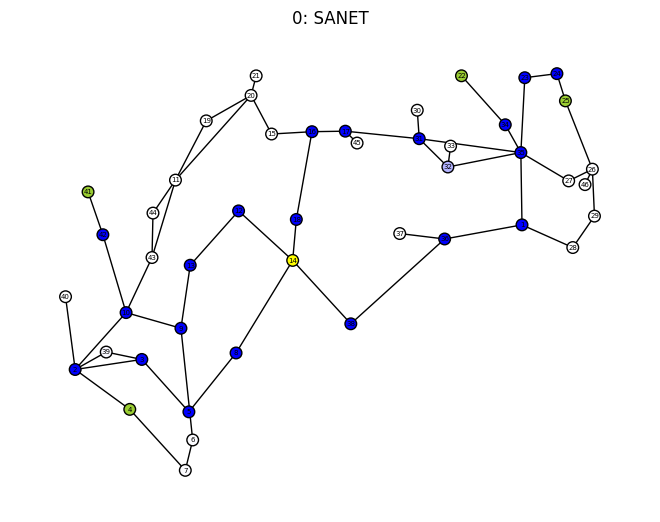



running 1: LAYER42


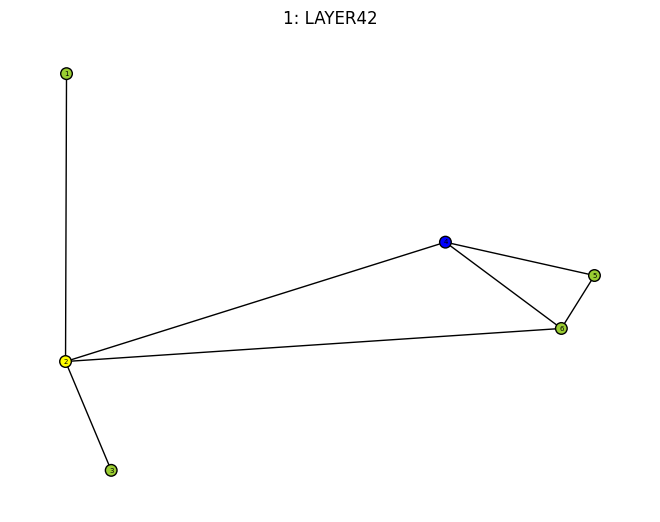



running 2: BEYONDTHENETWORK


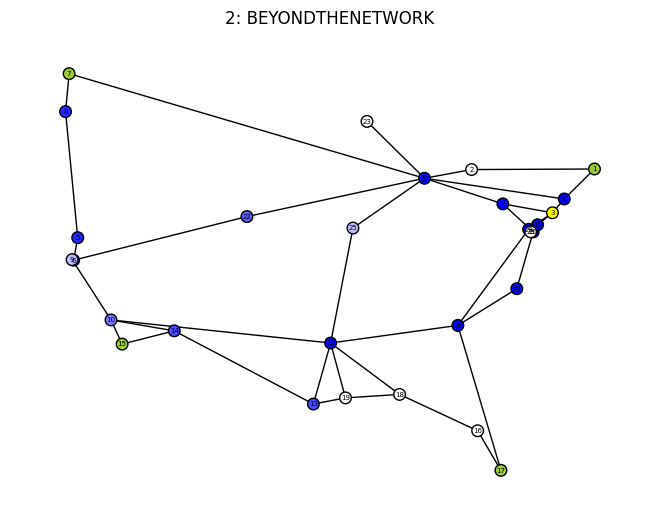



running 3: NSFNET13


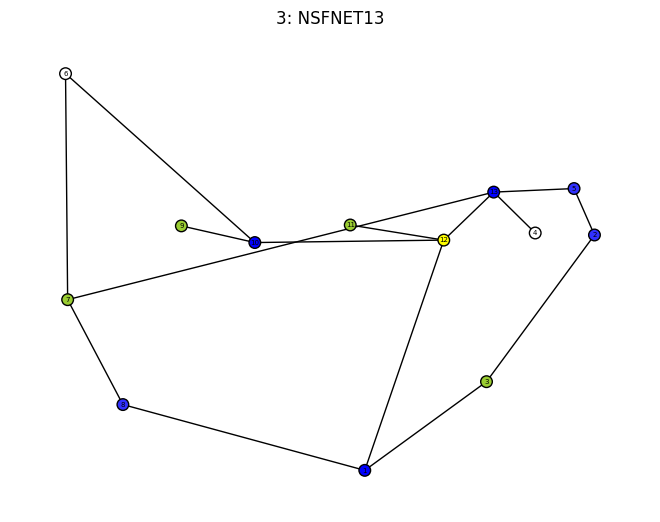



running 4: CANARIE


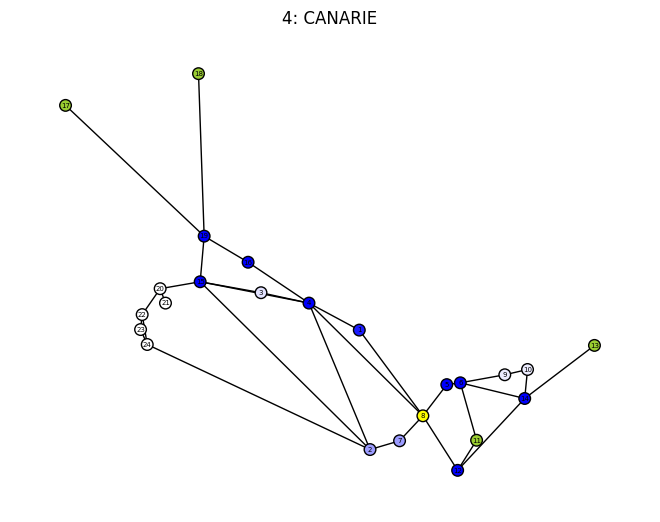



running 5: DT17


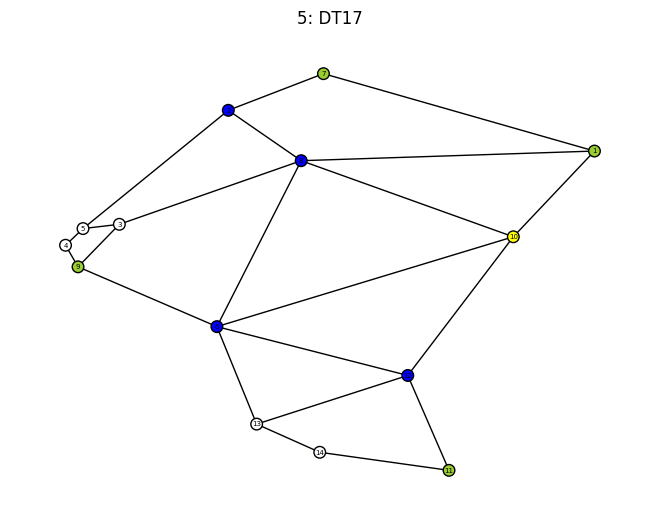



running 6: ERNET


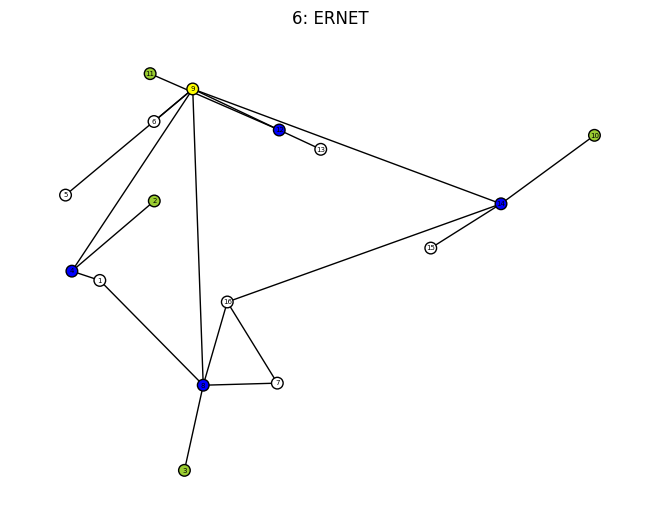



running 7: CANARIE


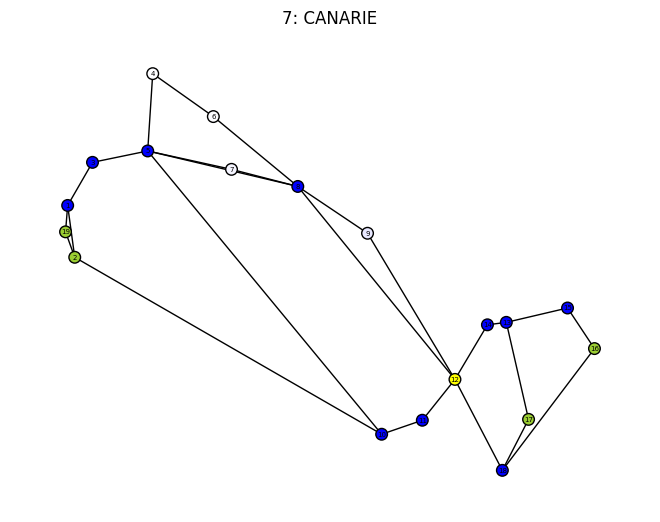



running 8: JPN12


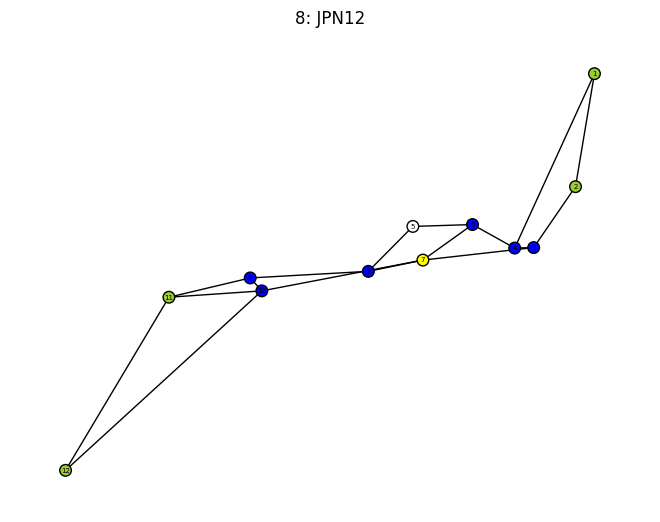



running 9: FUNET


running 10: ARNES


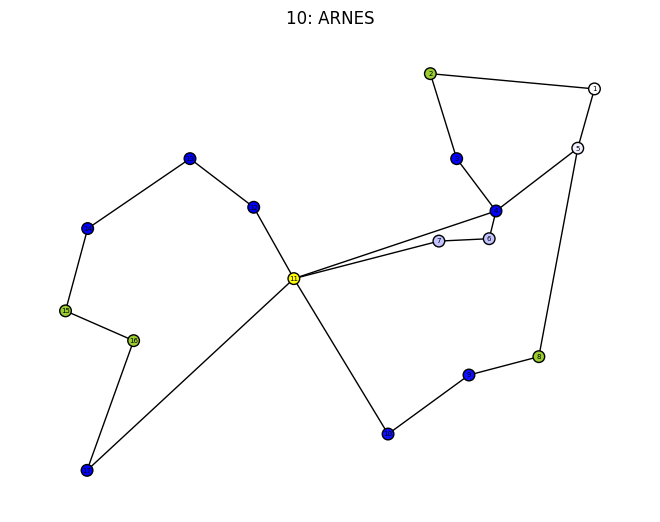



running 11: TATANID


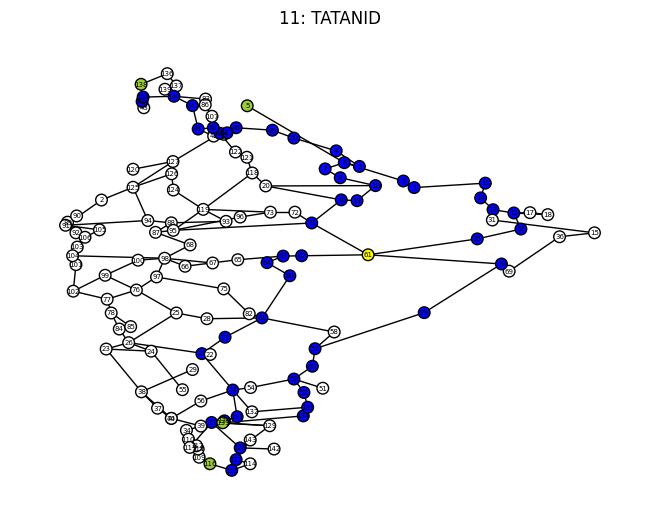



running 12: RENATER2004


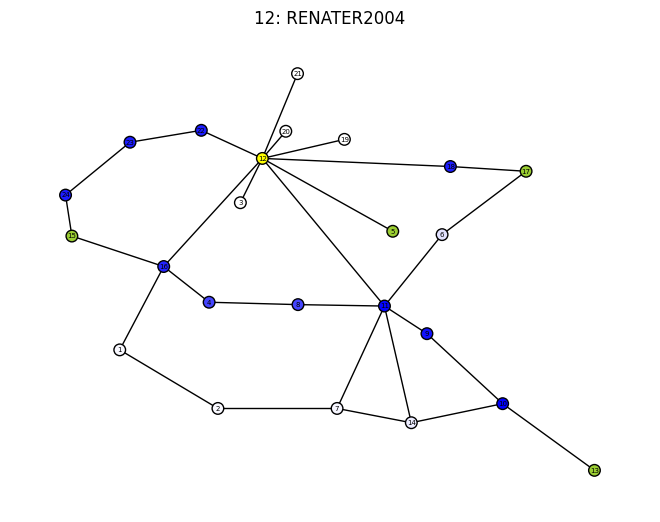



running 13: RENATER2001


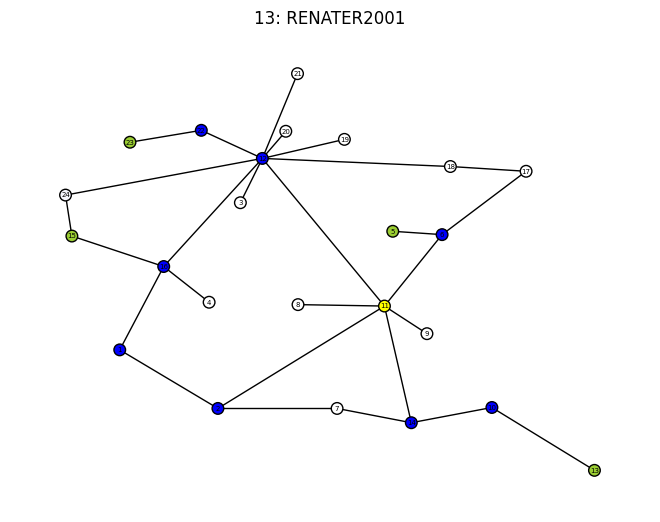



running 14: CWIX


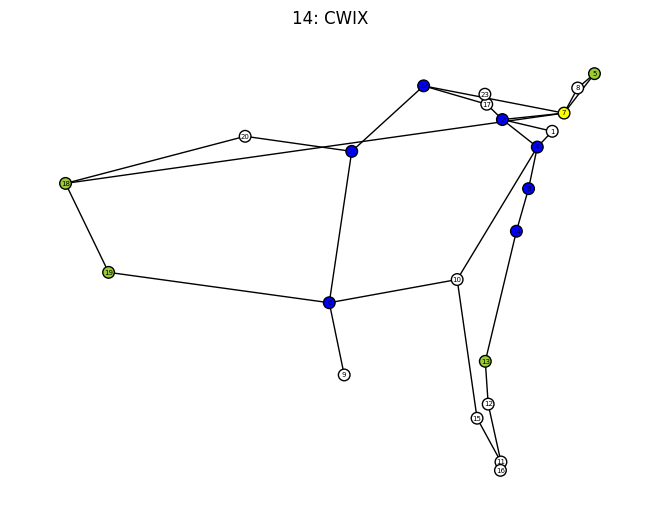



running 15: SAGO


running 16: CESNET


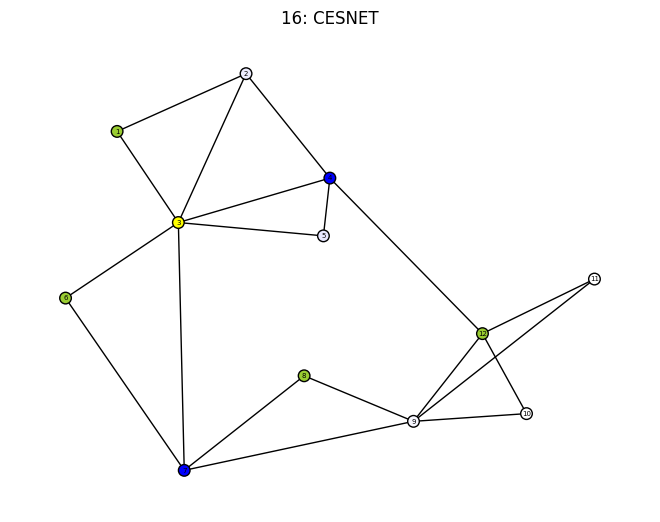



running 17: GERMANY50


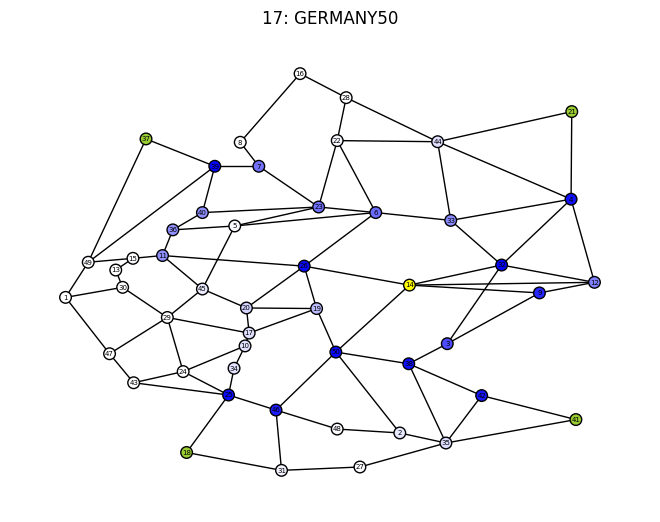



running 18: NEXTGEN


running 19: NETRAIL


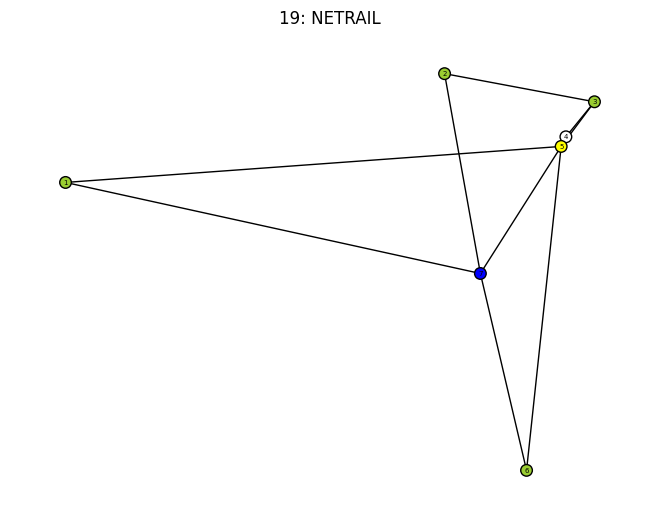



running 20: ATMNET


running 21: GEANT2


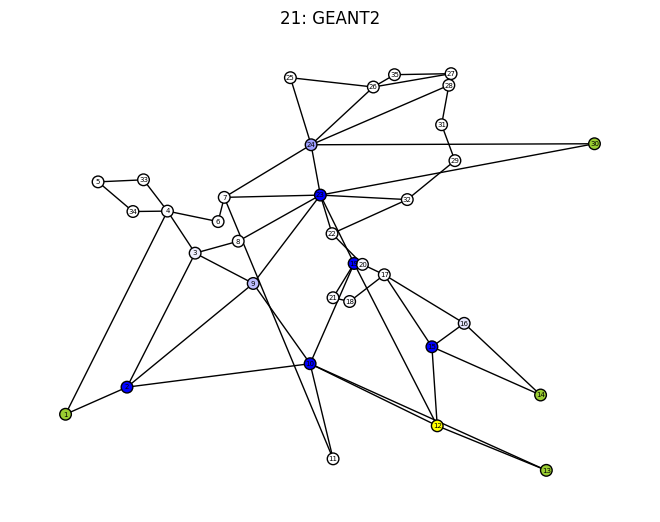



running 22: RENATER


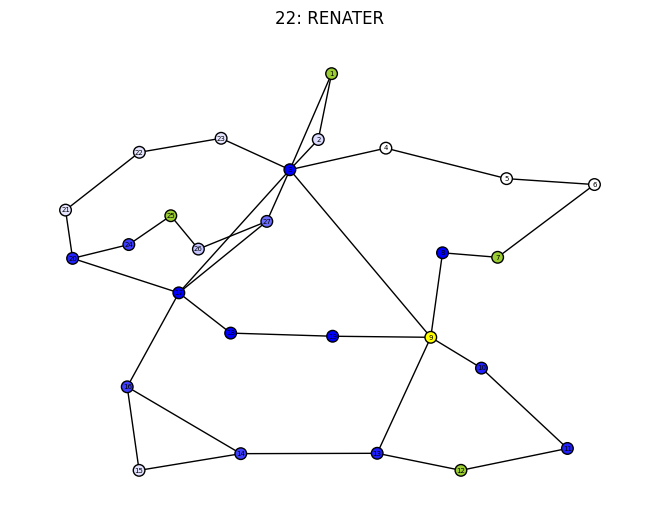



running 23: GTSCZECHREPUBLIC


running 24: SANREN


running 25: EPOCH


running 26: RENATER2008


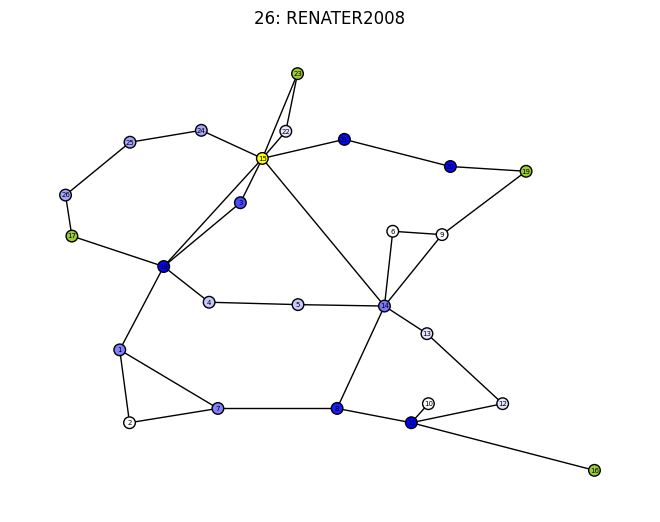



running 27: CONUS6079


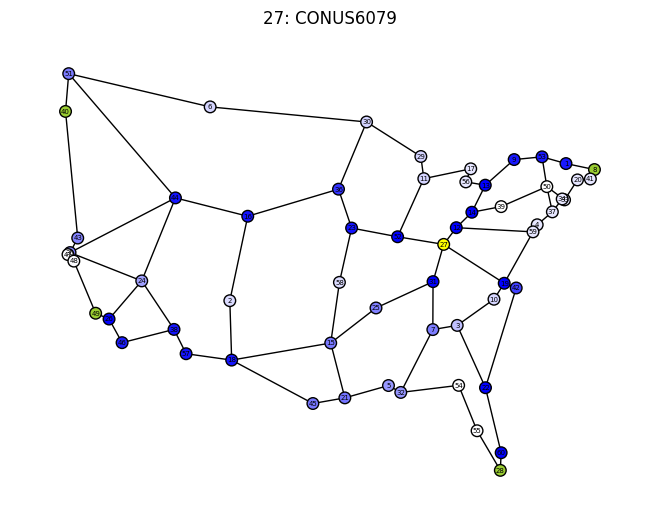



running 28: GTSPOLAND


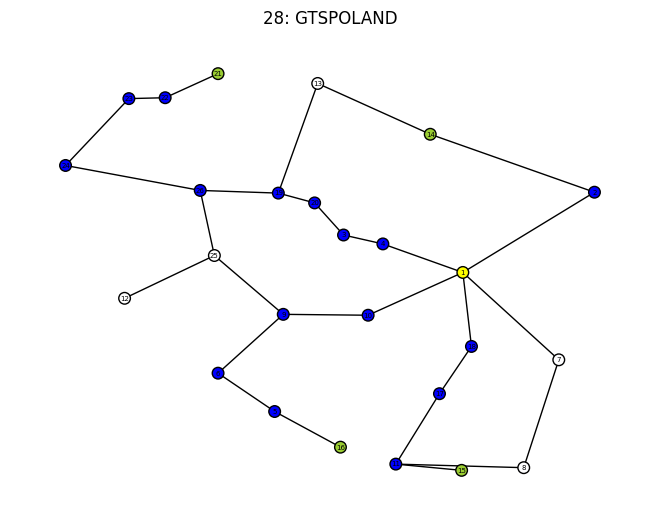



running 29: CONUS75


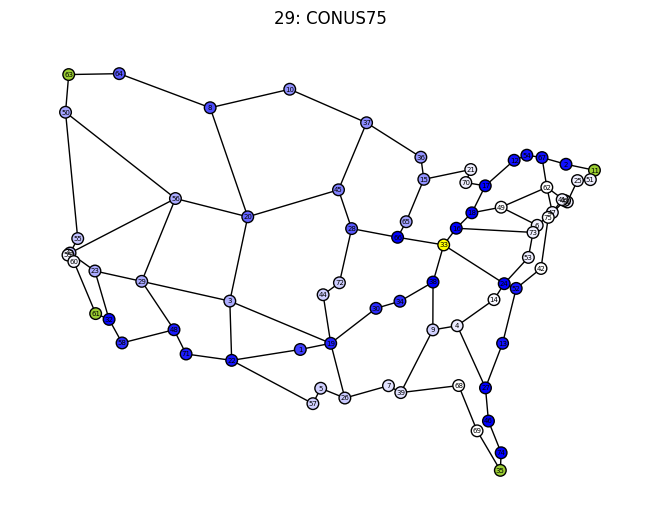



running 30: USA100


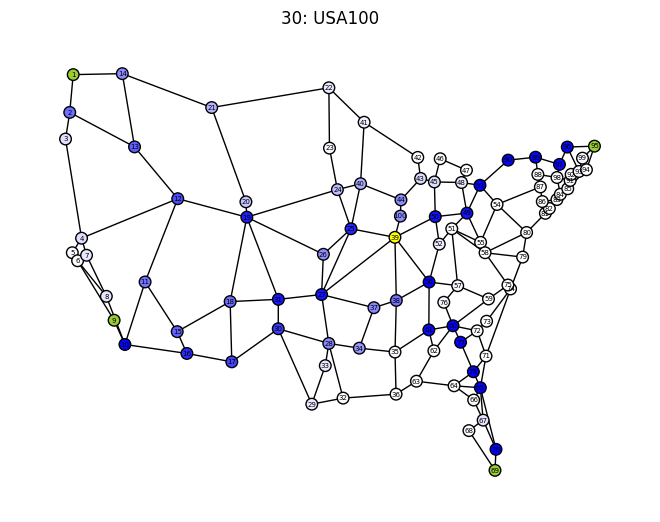



running 31: HOSTWAYINTERNATIONAL


running 32: HIBERNIANIRELAND


running 33: RENATER1999


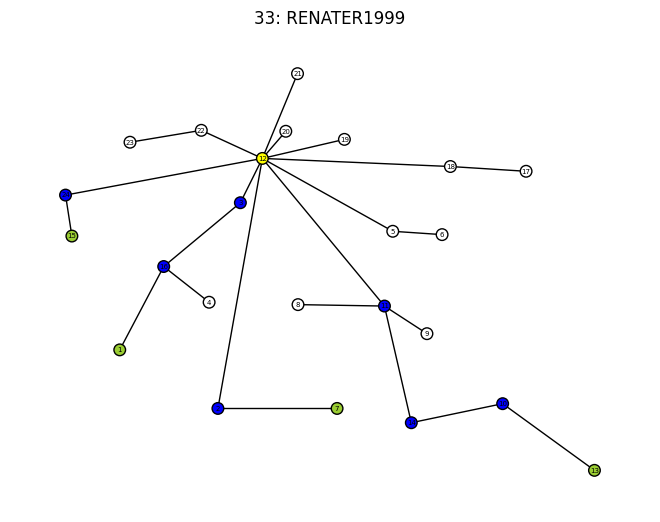



running 34: JPN48


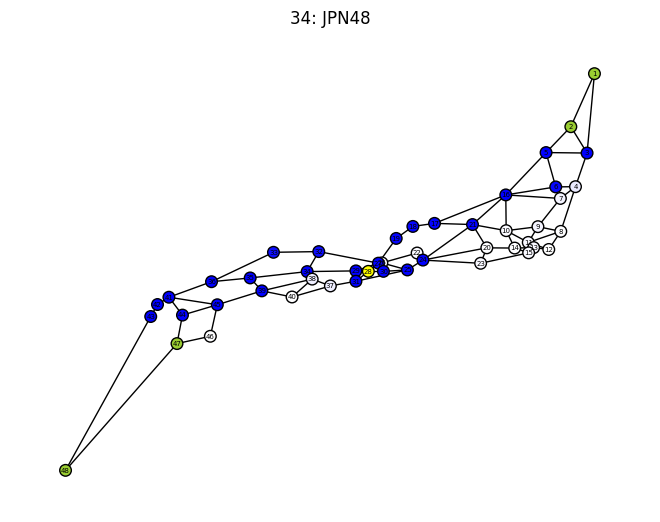



running 35: PORTUGAL


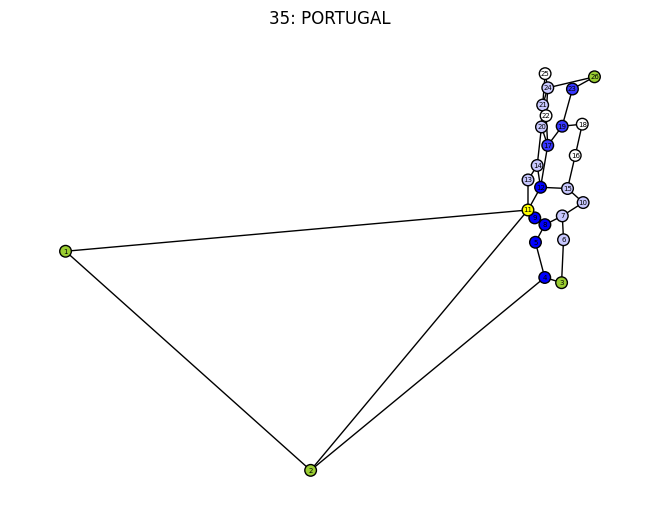



running 36: DIGEX


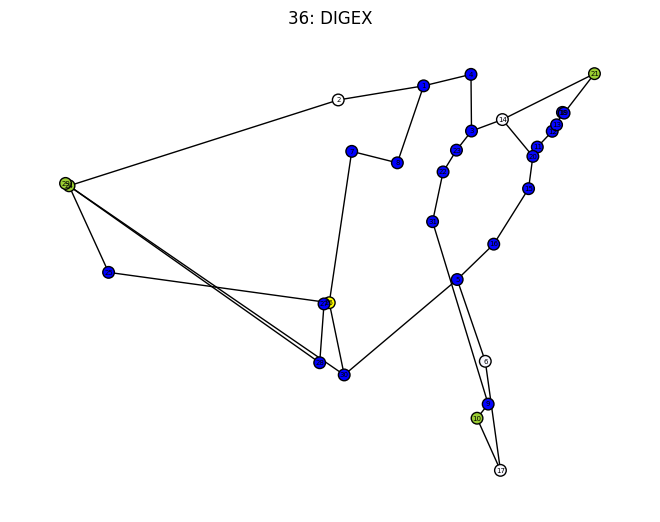



running 37: ITALY


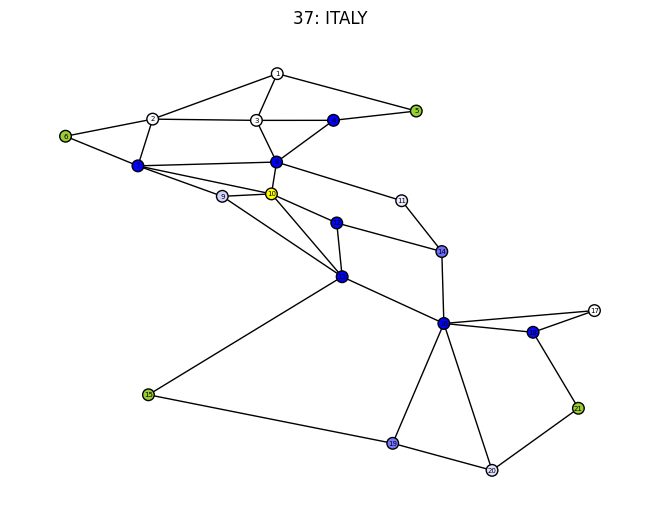



running 38: VIA


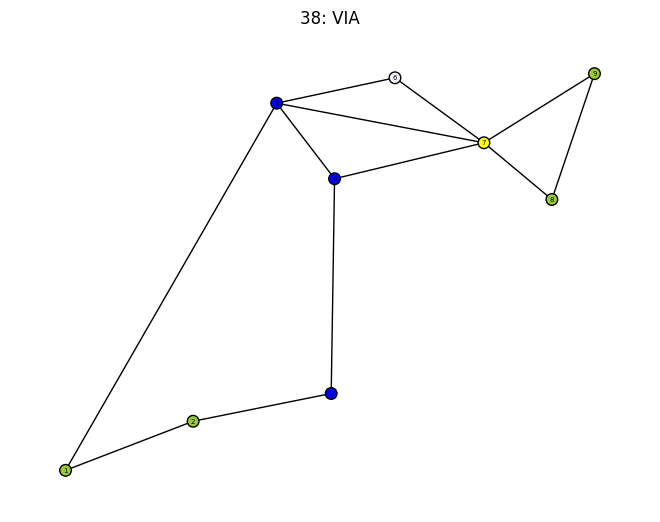



running 39: REDCLARA


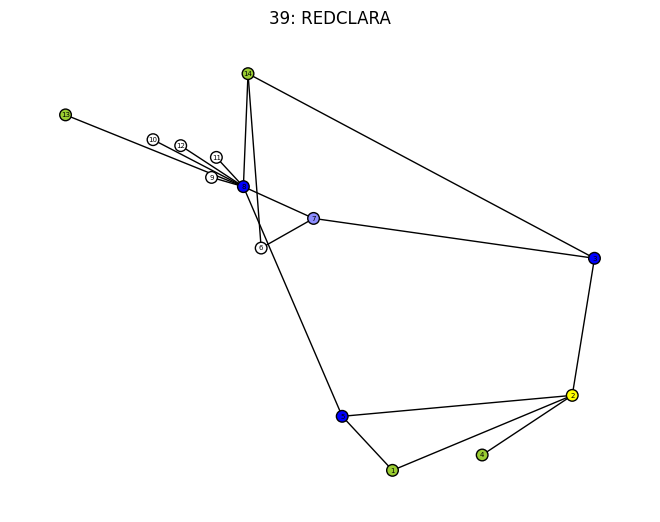



running 40: ANS


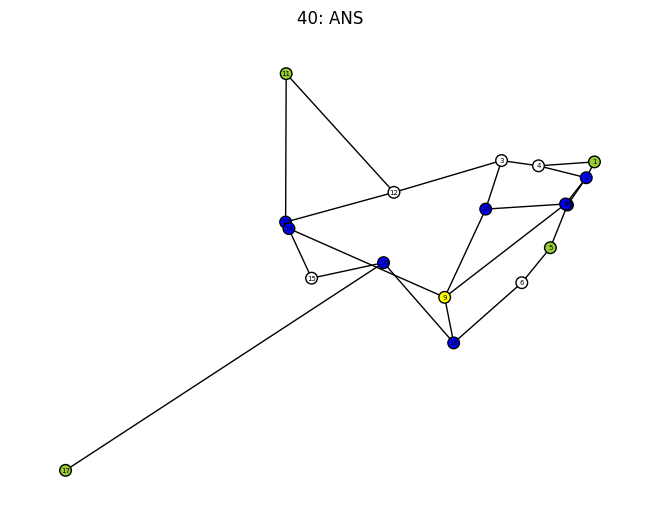



running 41: RENATER2006


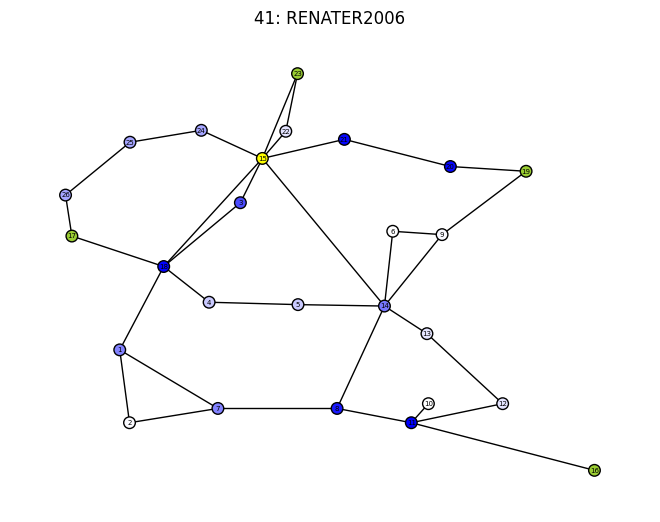



running 42: REDIRIS


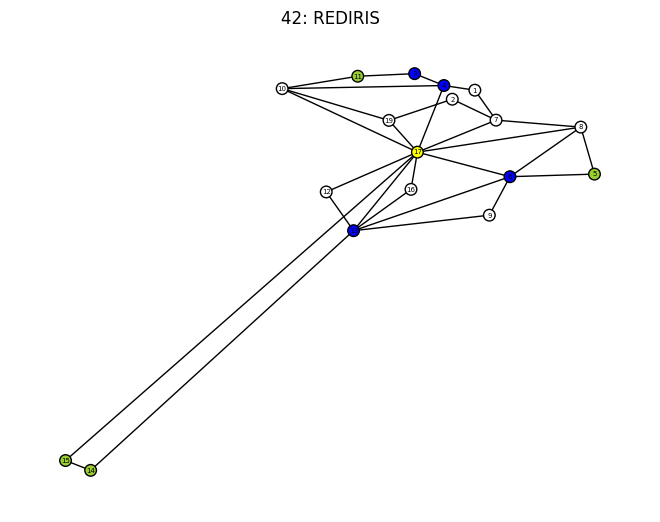



running 43: BICS


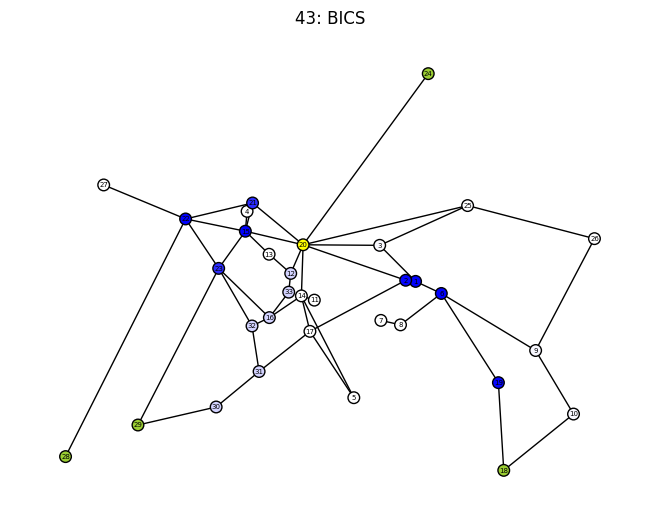



running 44: BREN


running 45: INTEGRA


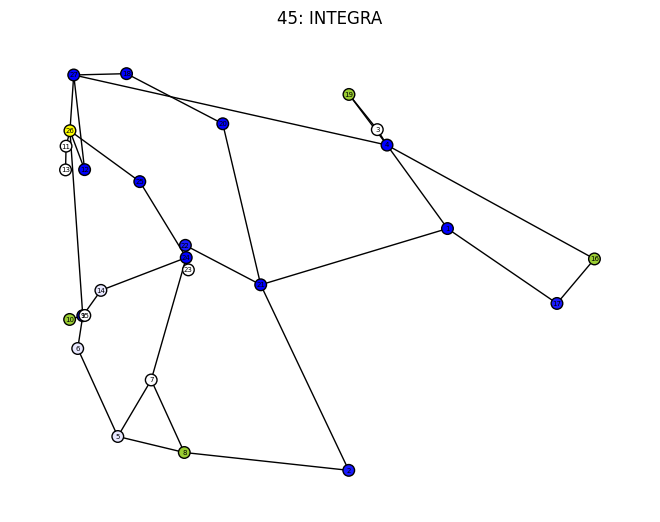



running 46: UNIC


running 47: COST


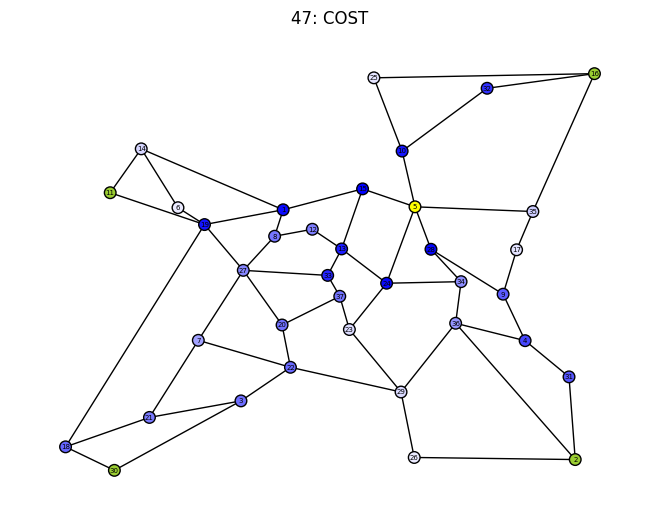



running 48: OXFORD


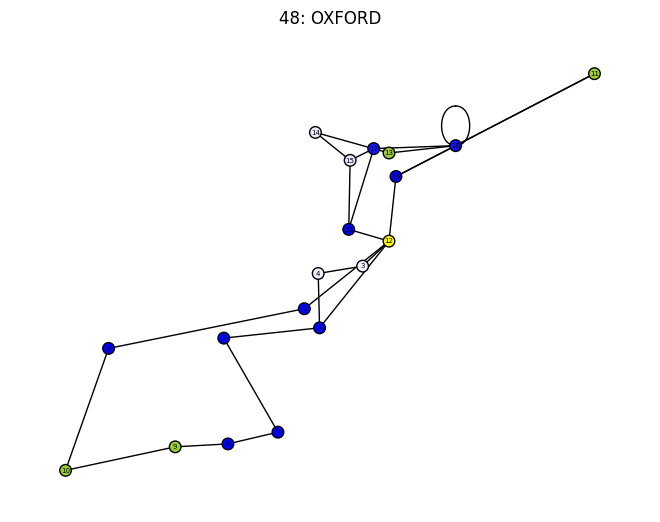



running 49: CONUS100


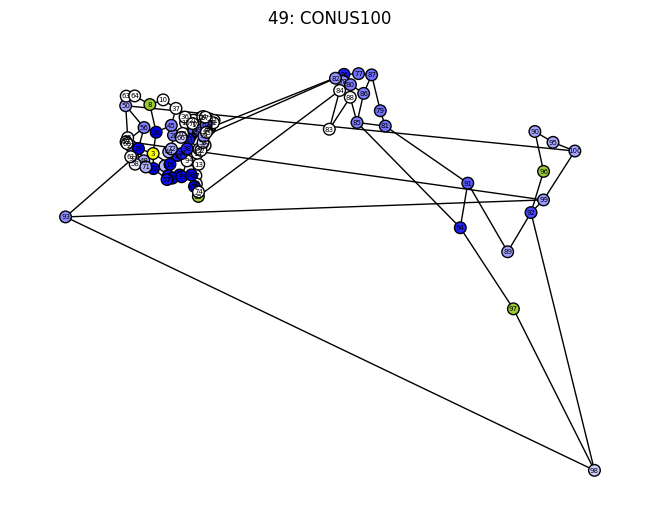



running 50: CRLNETWORKSERVICES


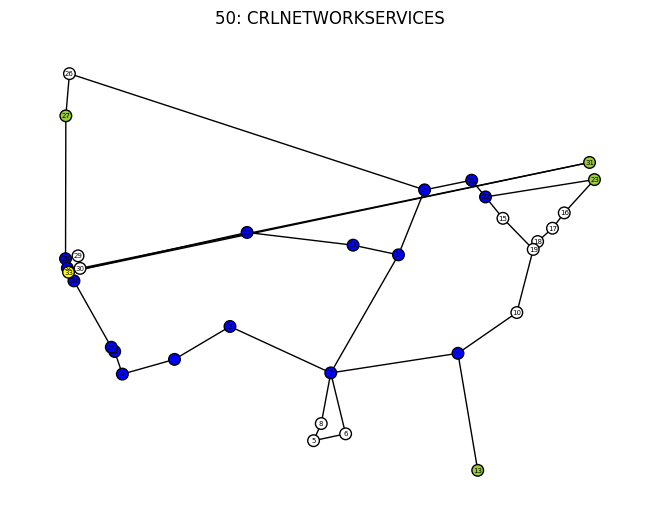



running 51: ARPANET


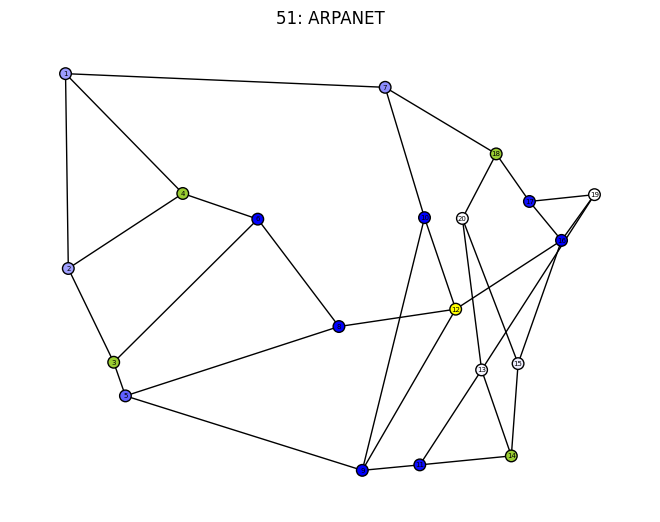



running 52: HIBERNIAGLOBAL


running 53: ABILENE


running 54: LONI


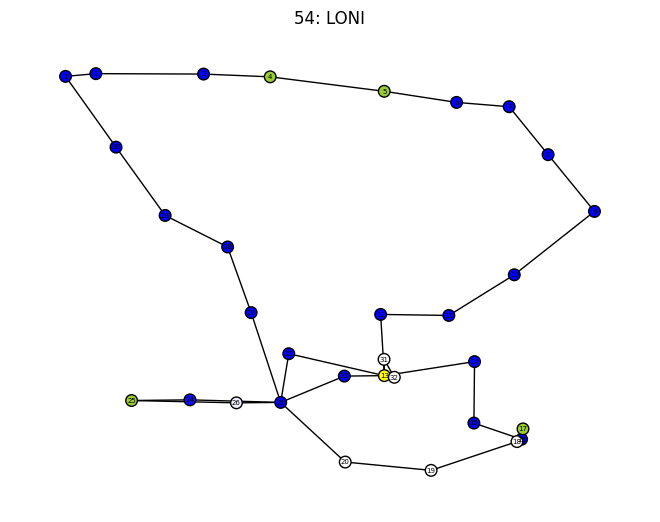



running 55: PALMETTO


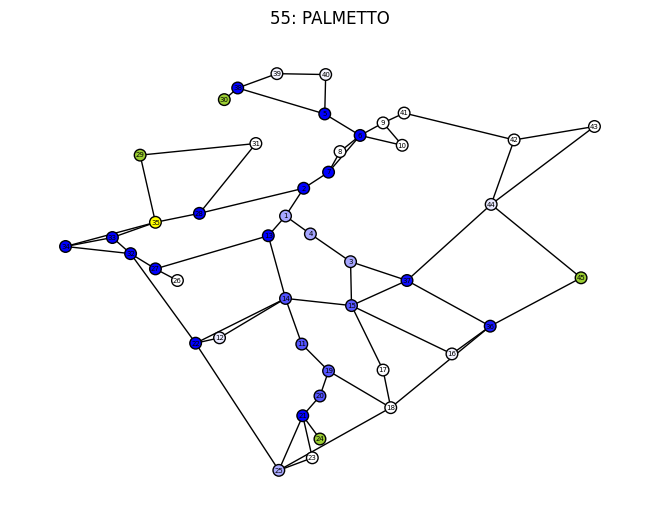



running 56: MARWAN


running 57: NETWORKUSA


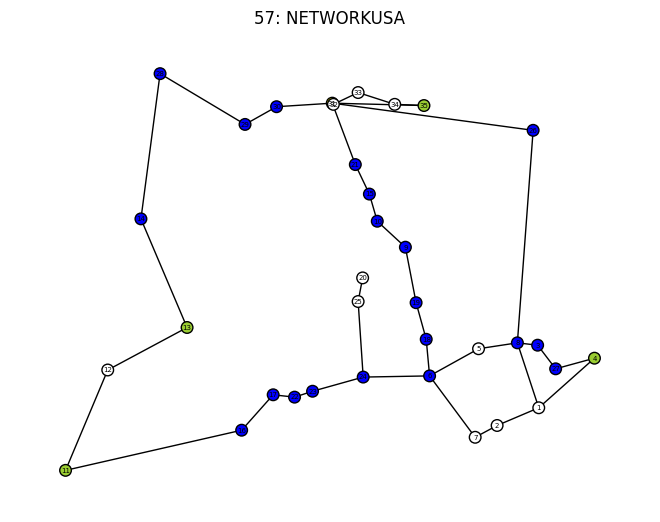



running 58: BIZNET


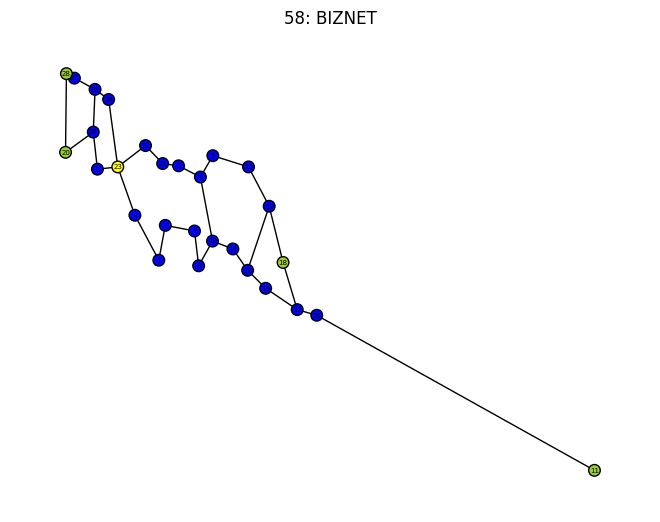



running 59: BBNPLANET


running 60: JGN2PLUS


running 61: JANOSUS


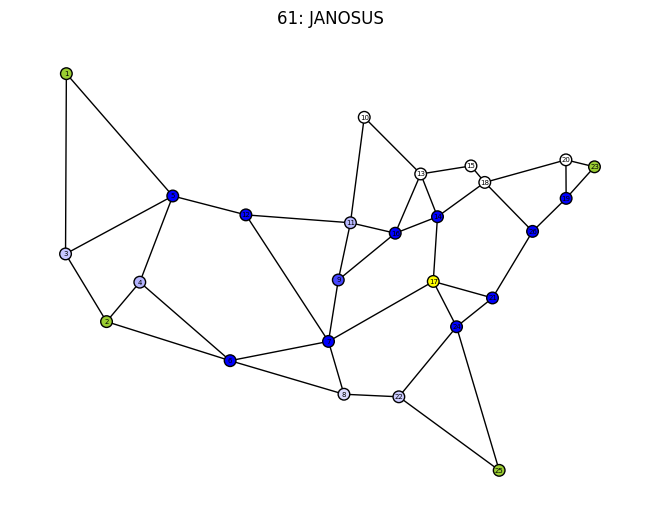



running 62: CLARANET


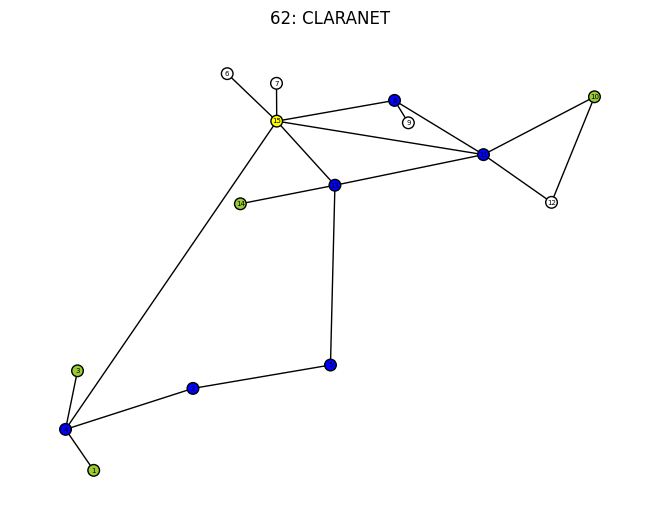



running 63: IRIS


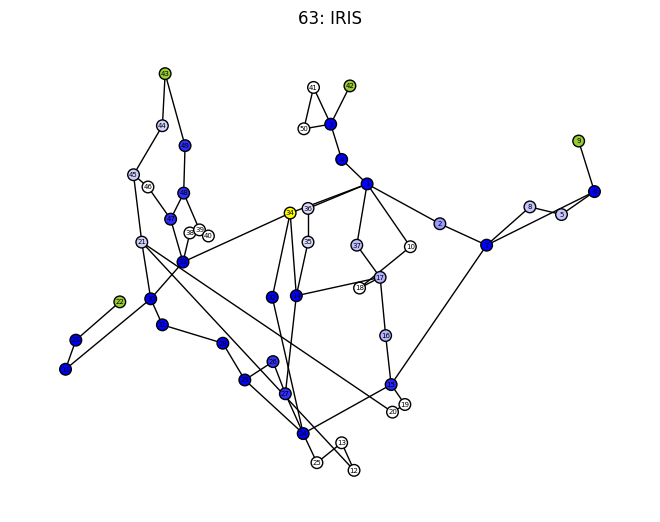



running 64: EON


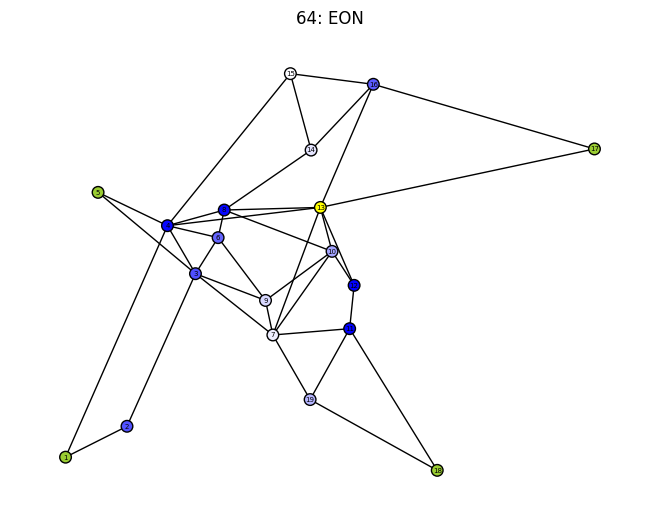



running 65: MZIMA


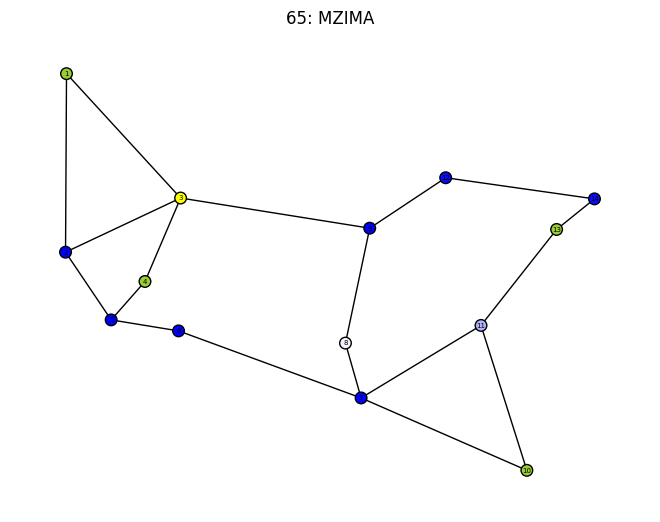



running 66: HIBERNIAIRELAND


running 67: OPTUNETSWEDEN


running 68: MEMOREX


running 69: NEWNET


running 70: RENATER2010


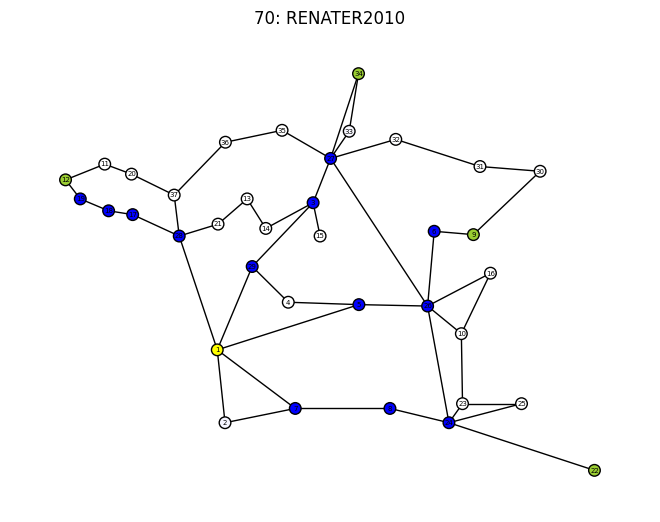



running 71: CONUS6077


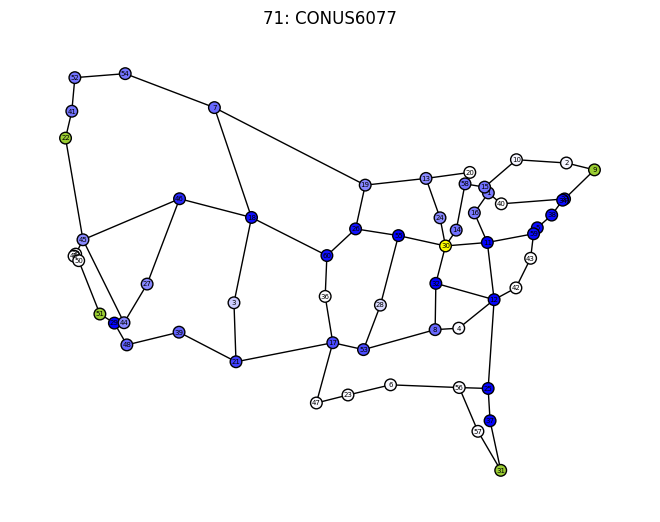



running 72: HIBERNIAUS


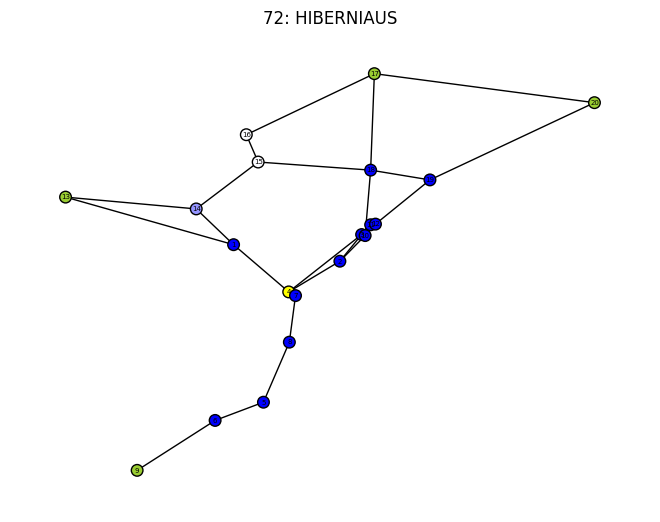



running 73: SAVVIS


running 74: ISTAR


running 75: HIBERNIAUK


running 76: KAREN


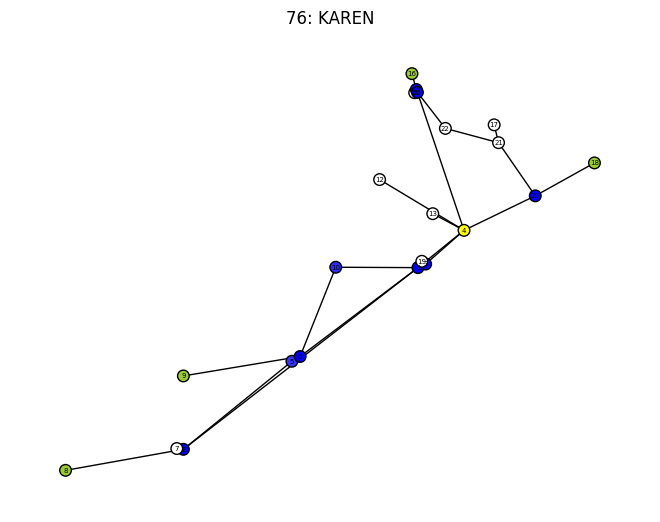



running 77: METRONA


running 78: TELECOMSERBIA


running 79: JPN25


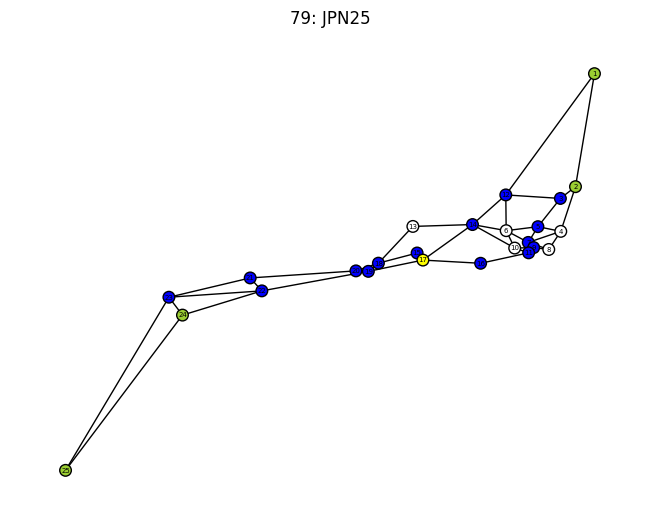



running 80: PSINET


running 81: CONUS30


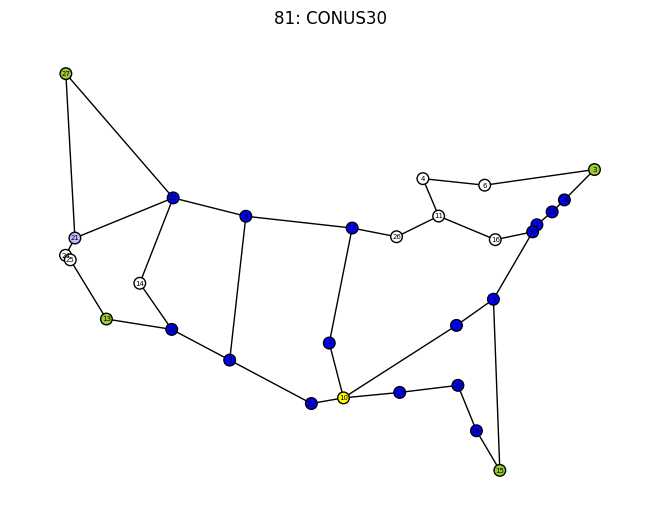



running 82: NOBELGERMANY


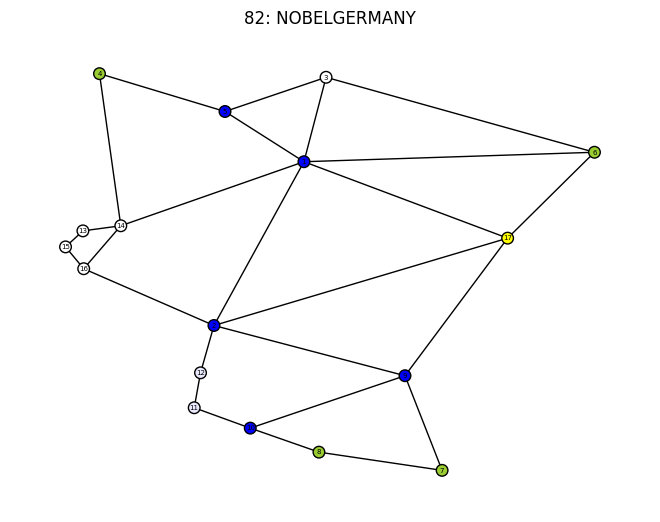



running 83: GAMBIA


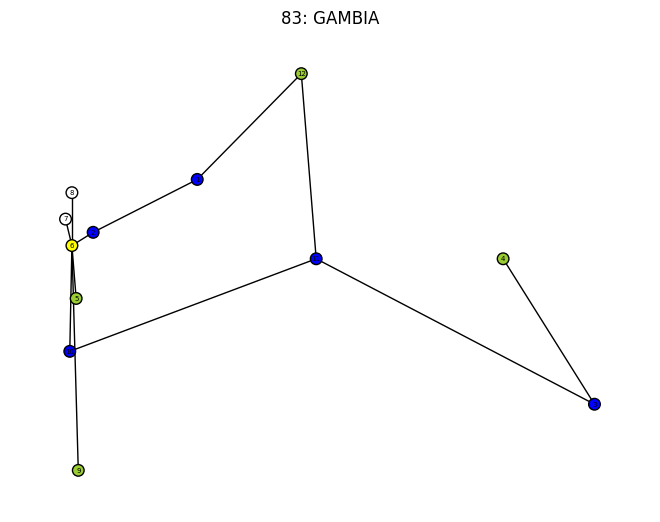



running 84: NOBELUS


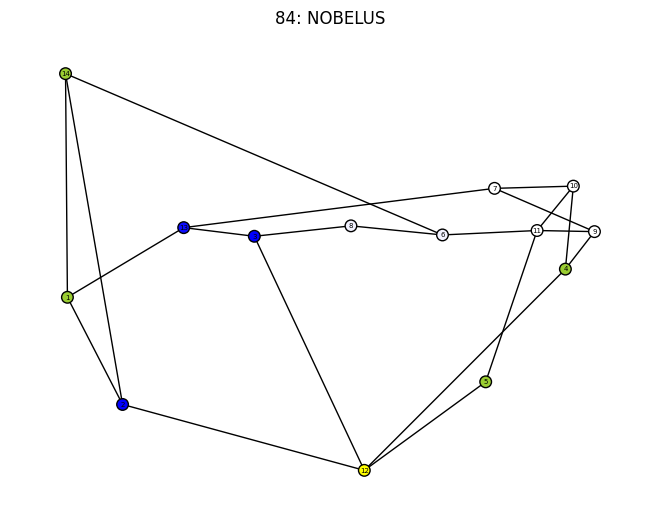



running 85: LAMBDARAIL


running 86: SPIRALIGHT


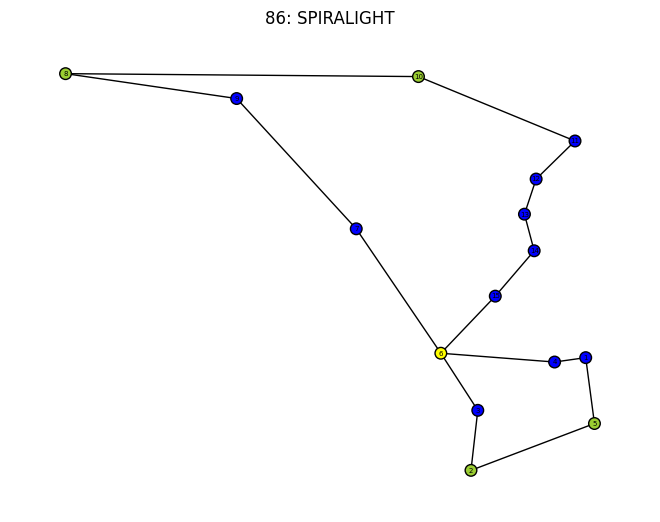



running 87: RNPBRAZIL


running 88: GRNET


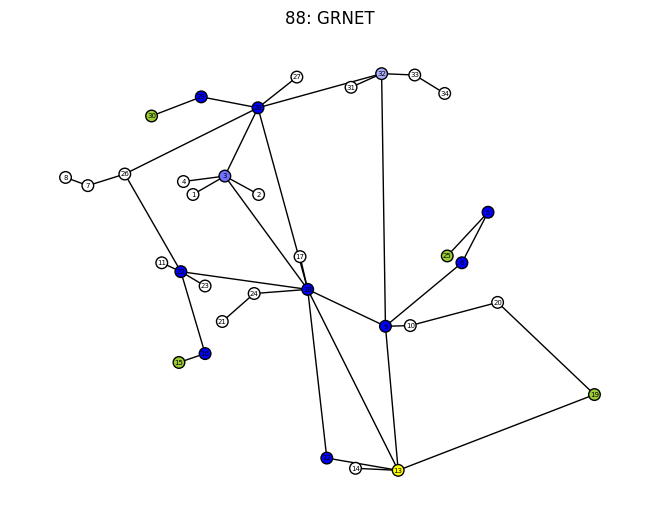



running 89: IBM


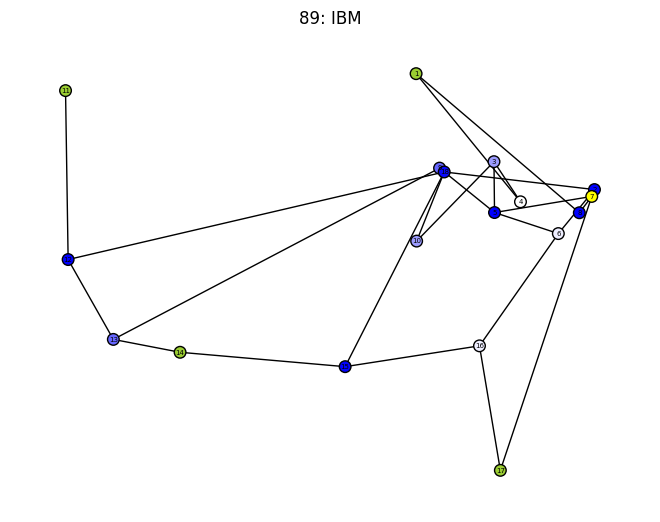



running 90: PACKETEXCHANGE


running 91: HIBERNIACANADA


running 92: RAILTELINDIA


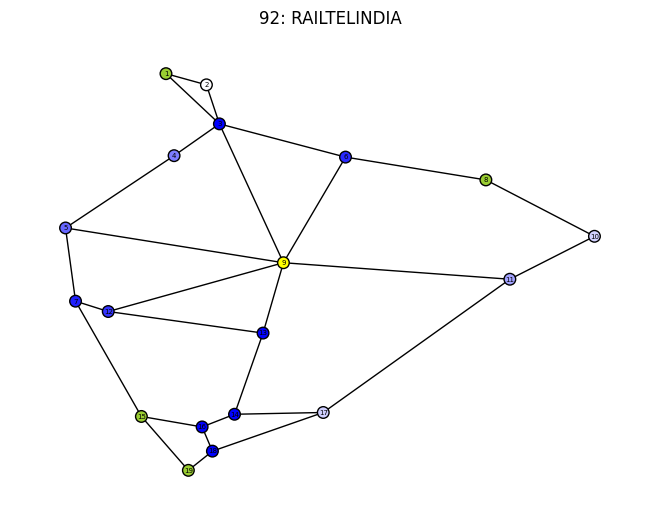



running 93: CORONET


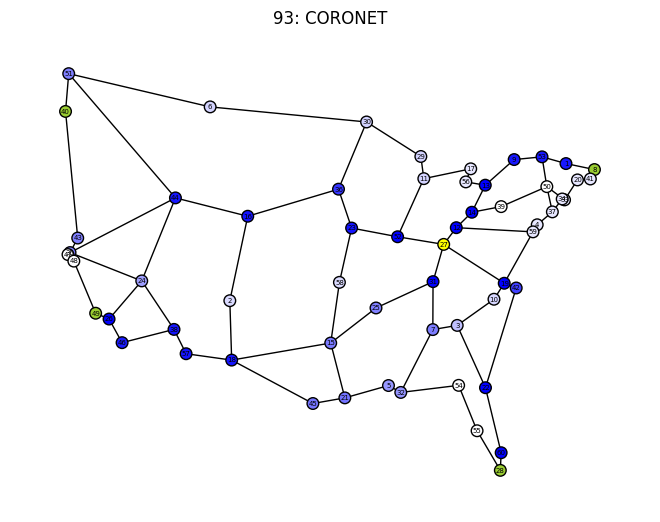



running 94: CERNET


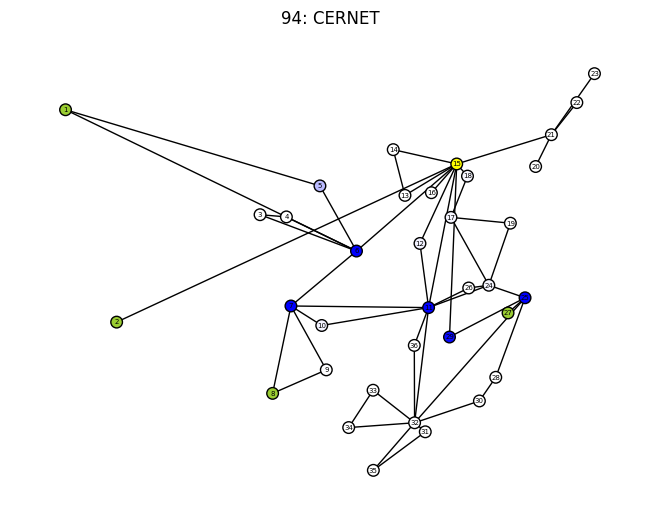



running 95: PIONIER


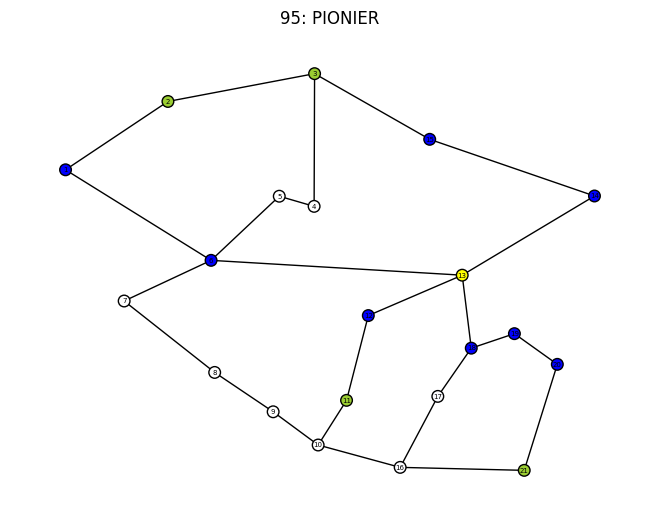



running 96: GEANT


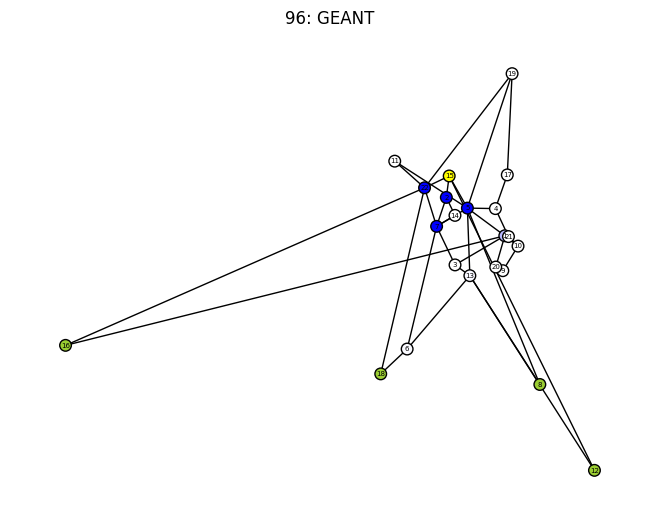



running 97: ELIBACKBONE


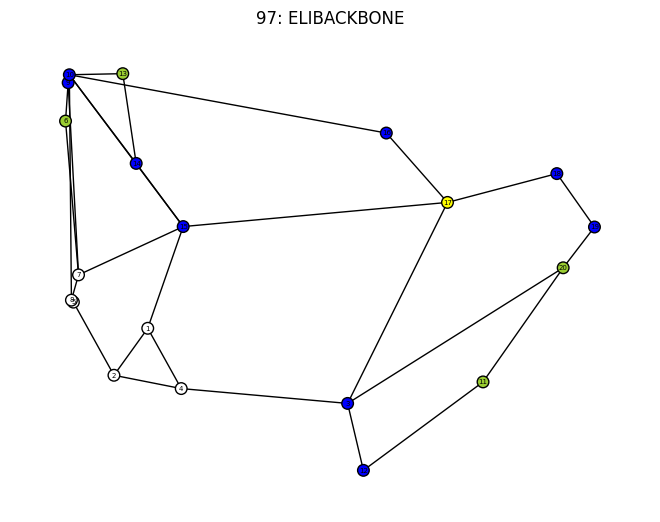



running 98: NOEL


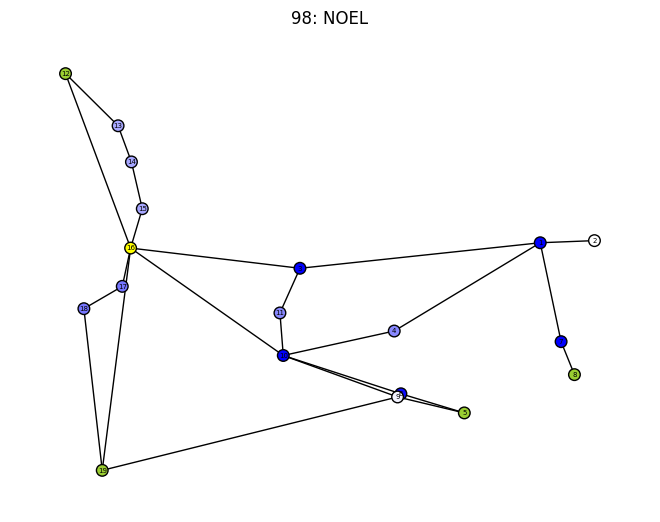



running 99: DARKSTRAND


running 100: POLSKA


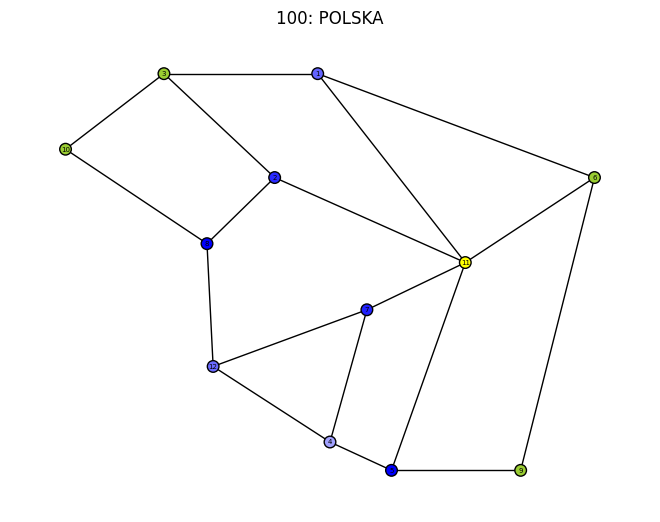



running 101: NOBELEU


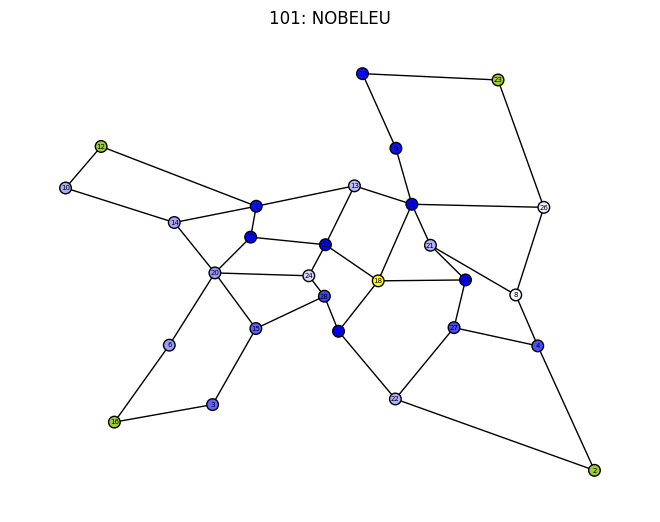



running 102: GETNET


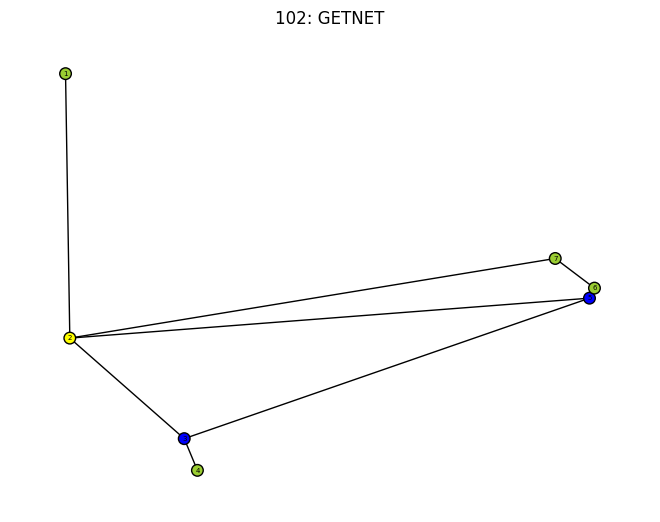



running 103: GBLNET


running 104: PIONIERL3


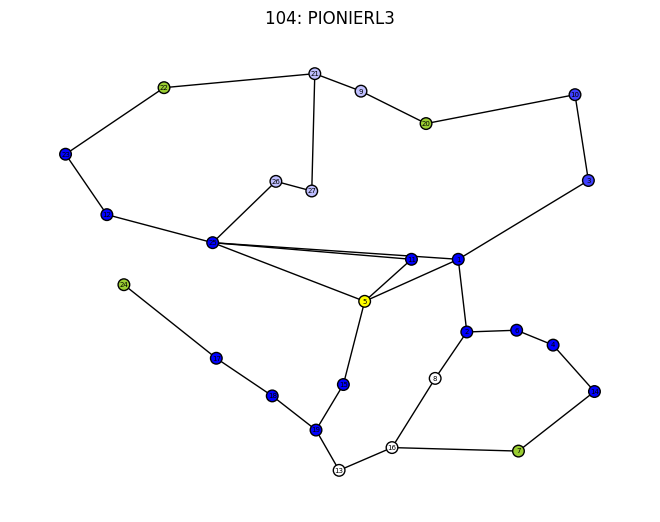

In [306]:
real_topo_colors_mpg_freq = {}

for i in range(len(real_topo)):

    print(f'\n\nrunning {str(i)}: {file_names[i]}')

    if i in bad_indices:
         continue
    if i in temp_filter:
         continue

    real_topo_colors_mpg_freq[i] = node_colors_freq(real_topo[i],real_topo_users[i],presave_centers[i],mpg_node_freq_ratio_dict[i])

    nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color=real_topo_colors_mpg_freq[i], font_size=5, node_size=70)
    plt.title(str(i) + ': ' + file_names[i])
    plt.show()